In [232]:
!pip install --upgrade scipy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


# **Data Understanding**

In [233]:
# Importing modul

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as mnso
import random

from xgboost import XGBClassifier
from scipy.stats import ttest_ind
from sklearn.impute import KNNImputer, SimpleImputer
from scipy.stats import skew,skewtest,spearmanr,pearsonr,normaltest
from sklearn.preprocessing import RobustScaler,OneHotEncoder, OrdinalEncoder
from sklearn.feature_selection import mutual_info_classif,SelectKBest
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, precision_recall_curve,make_scorer,accuracy_score, precision_score, recall_score, classification_report, roc_auc_score, confusion_matrix
from sklearn.model_selection import train_test_split, cross_validate, KFold, cross_val_score, RandomizedSearchCV, GridSearchCV


import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)

In [234]:
# Load Dataset

data1 = pd.read_csv('model_development_set.csv',sep=';')
data2 = pd.read_csv('model_backtesting_set.csv',sep=';')

In [235]:
# Data model checking

data1

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_zip_code_prefix,seller_city,seller_state,product_category_name_english,label
0,281fb8b9868caf9889214e5a8d56e271,4e5a10bd8f468ee5acc890961a2b7ce4,36570,vicosa,MG,36570,-20.751405,-42.824725,vicosa,MG,1ea7acde8dacf11a098d0b85b13cdc0e,delivered,2017-10-27 16:21:02,2017-10-27 17:31:13,2017-11-01 00:07:57,2017-11-06 20:17:37,2017-11-22 00:00:00,1,588531f8ec37e7d5ff5b7b22ea0488f8,53243585a1d6dc2643021fd1853d8905,2017-11-03 16:35:40,1437.00,42.51,1,credit_card,8,1479.51,pcs,55.0,3611.0,4.0,2750,16,31,39,42738,lauro de freitas,BA,computers,0
1,74739c82729e0172c2449caa51f42122,46b7b0549a0fd88de78b58bafe90c3e5,72225,brasilia,DF,72225,-15.817357,-48.113121,brasilia,DF,10bc94fc052750e8053c44b8a0cdab8d,delivered,2017-12-11 13:32:50,2017-12-11 13:50:16,2017-12-11 23:10:08,2017-12-26 19:52:23,2018-01-11 00:00:00,1,6cdd53843498f92890544667809f1595,ccc4bbb5f32a6ab2b7066a4130f114e3,2017-12-20 13:50:16,349.90,22.85,1,credit_card,7,372.75,beleza_saude,51.0,625.0,1.0,900,25,12,38,80310,curitiba,PR,health_beauty,0
2,70fd1803205b1552d3a4ead3f6997b50,b11122912484da7417c071b26d9e74c8,13160,artur nogueira,SP,13160,-22.577270,-47.170631,artur nogueira,SP,8b2747171304ba1b058713f5d64fc179,delivered,2018-02-16 20:24:06,2018-02-16 20:46:34,2018-02-20 15:37:54,2018-03-08 16:12:09,2018-03-15 00:00:00,1,70906e04da1eebf3d1b8791bd09ffe85,f457c46070d02cadd8a68551231220dd,2018-02-22 19:46:34,69.90,12.62,1,credit_card,3,82.52,informatica_acessorios,51.0,518.0,1.0,214,18,14,13,87047,maringa,PR,computers_accessories,0
3,0309b2a47dddf69e60c888db00cb5858,5dd27319cab49c620f28cd6e4e378570,15600,fernandopolis,SP,15600,-20.277672,-50.233246,fernandopolis,SP,53639d3483b91d202af2934021b5e2fa,delivered,2018-01-07 10:16:22,2018-01-08 10:11:22,2018-01-09 20:45:04,2018-01-13 01:03:35,2018-02-05 00:00:00,1,7814c273ab16783d73a9863ebfa8b141,1025f0e2d44d7041d6cf58b6550e0bfa,2018-01-17 10:11:22,250.00,35.02,1,credit_card,6,285.02,moveis_decoracao,51.0,756.0,1.0,12250,45,35,45,3204,sao paulo,SP,furniture_decor,0
4,22a330de6f63a8d1631ce94b17a4fafe,d2dbd5be475f37efe006c1de35e5db92,29360,castelo,ES,29360,-20.607682,-41.202173,castelo,ES,d3a2d71aecfd58b0ddd6b9d7b56ed55d,delivered,2017-07-24 22:09:04,2017-07-24 22:23:14,2017-07-26 11:07:51,2017-08-09 17:17:38,2017-08-28 00:00:00,1,3516632e8f52b679ff83d1665ecc990e,e9bc59e7b60fc3063eb2290deda4cced,2017-07-30 22:23:14,75.90,25.81,1,credit_card,3,101.71,informatica_acessorios,45.0,267.0,1.0,167,16,12,13,87083,maringa,PR,computers_accessories,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6809,8c4dbeee7cb11dc1f6ab09d05aec9e58,ea65d284a7c5624a4e29365e2e4bb901,13806,mogi mirim,SP,13806,-22.427304,-46.980045,mogi mirim,SP,081dff6255d4b75937a72577339b2728,delivered,2018-03-13 14:21:08,2018-03-13 14:35:38,2018-03-14 17:48:57,2018-03-17 02:26:53,2018-03-23 00:00:00,1,26c6145c9687019a428467c8852ae36b,ffad1e7127fb622cb64a900751590acd,2018-03-19 14:31:43,17.80,8.64,1,credit_card,1,52.88,bebes,30.0,245.0,3.0,350,60,2,20,13465,americana,SP,baby,1
6810,0c792d32a3251b4f69dae8646dfbedbc,6d394722d5fc5e721aee6875a218d8db,22775,rio de janeiro,RJ,22775,-22.969620,-43.387842,rio de janeiro,RJ,be382a9e1ed25128148b97d6bfdb21af,delivered,2017-11-04 17:29:15,2017-11-07 16:31:17,2017-11-21 14:22:28,2017-11-23 20:28:46,201

In [236]:
# Data backtest checking

data2

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_zip_code_prefix,seller_city,seller_state,product_category_name_english
0,e2a1ab008932ae1211651ffb0cffe7ea,b35bbea722303bf6e700f2b67ed6a88e,19906,ourinhos,SP,19906,-22.990940,-49.887524,ourinhos,SP,6094159cbb1c76bdf3249a954c2da017,delivered,2018-05-17 14:40:34,2018-05-18 00:14:56,2018-05-18 11:20:00,2018-05-30 20:44:25,2018-06-05 00:00:00,1,79863f997e214f8f98c423694c745f3d,a416b6a846a11724393025641d4edd5e,2018-05-24 00:14:56,166.00,15.25,1,credit_card,6,181.25,beleza_saude,20.0,1688.0,1.0,1450,30,12,16,3702,sao paulo,SP,health_beauty
1,a292a83e844f94fd579a662199ee9319,77ed6756100f9e16700cc6bf7207abd6,11250,bertioga,SP,11250,-23.763952,-45.903124,bertioga,SP,3438253f6ad093b9a0051a04700d125f,delivered,2017-07-25 20:13:09,2017-07-25 20:25:16,2017-07-26 21:57:40,2017-07-31 18:29:56,2017-08-16 00:00:00,1,d357105bd504c78d8470ffd247747eab,b88e7c57cb2d8b973b7dd4a2bfa14b36,2017-07-31 20:25:16,15.00,15.10,1,credit_card,1,30.10,beleza_saude,17.0,341.0,1.0,255,17,13,15,81350,curitiba,PR,health_beauty
2,82f10cdf48026392161bedb195f79931,0a6f34aa51fd18d116edfb8798793eb3,30130,belo horizonte,MG,30130,-19.931521,-43.933723,belo horizonte,MG,afa4f45747006532ff507b1a527f6642,delivered,2017-03-17 08:20:43,2017-03-17 08:20:43,2017-03-22 09:37:35,2017-03-29 14:59:52,2017-04-17 00:00:00,1,57de1d67d6badffc863b651c74e59dd0,b2ba3715d723d245138f291a6fe42594,2017-03-30 08:20:43,189.90,16.09,1,credit_card,3,205.99,papelaria,52.0,280.0,2.0,1800,18,45,32,3470,sao paulo,SP,stationery
3,db27297d513bc9f50d255ee7b7ee8cd6,8e6d0b8e818e7b2cbbe279e9ac21393c,13604,araras,SP,13604,-22.330936,-47.379980,araras,SP,6ef0679f937afb1cb20c8cab157f6f9a,delivered,2017-12-27 17:05:32,2017-12-27 17:12:22,2017-12-28 19:06:03,2018-01-03 17:12:32,2018-01-29 00:00:00,2,5d66715cc928aadd0074f61332698593,128639473a139ac0f3e5f5ade55873a5,2018-01-03 17:12:22,19.90,12.48,1,credit_card,1,64.76,eletronicos,52.0,390.0,1.0,150,20,13,18,87050,maringa,PR,electronics
4,f4f06b67ddcc8a9efa90a1719558dbe1,3dfa96a5c650beb1772d1db80b14b222,22631,rio de janeiro,RJ,22631,-23.004489,-43.368646,rio de janeiro,RJ,a34cb116fd337ef68f4d8057031b39a5,delivered,2018-07-05 13:27:33,2018-07-06 02:51:02,2018-07-06 11:49:00,2018-07-12 20:32:33,2018-08-07 00:00:00,1,0505f239830b15ffbd923b4113a96855,4830e40640734fc1c52cd21127c341d4,2018-07-10 02:51:02,19.90,15.24,1,boleto,1,35.14,malas_acessorios,44.0,503.0,8.0,250,20,26,15,3573,sao paulo,SP,luggage_accessories
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2916,2d1f279054680b8bf048f693f51841c7,b9f1e76e684a889311467d29722e254e,32040,contagem,MG,32040,-19.916153,-44.094864,contagem,MG,6b08ff5328e55bd0396c0ffb9df586ca,delivered,2017-11-24 23:54:38,2017-11-25 02:33:13,2017-11-28 00:08:59,2017-12-19 22:44:46,2017-12-15 00:00:00,1,371c121dc86b3821f720e7dbe1928207,4830e40640734fc1c52cd21127c341d4,2017-11-30 02:31:46,15.99,14.10,1,credit_card,2,30.09,papelaria,59.0,504.0,4.0,150,22,5,12,3573,sao paulo,SP,stationery
2917,0af7fa6075b712e4e90ee3b1ca759872,89adb0f485715b9290d1bc3ed400d27c,37501,itajuba,MG,37501,-22.425231,-45.448810,itajuba,MG,a328c24c32a2e3815402210e8bb95c5d,delivered,2018-02-08 20:01:54,2018-02-09 20:07:57,2018-02-22 11:47:13,2018-03-05 21:58:30,2018-04-05 00:00:00,2,a226729b96bbb6962f9f8fc6a14db590,5058e8c1e82653974541

## 1. Data Description

In [237]:
# Melihat informasi dataset

data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6814 entries, 0 to 6813
Data columns (total 40 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   customer_id                    6814 non-null   object 
 1   customer_unique_id             6814 non-null   object 
 2   customer_zip_code_prefix       6814 non-null   int64  
 3   customer_city                  6814 non-null   object 
 4   customer_state                 6814 non-null   object 
 5   geolocation_zip_code_prefix    6814 non-null   int64  
 6   geolocation_lat                6814 non-null   float64
 7   geolocation_lng                6814 non-null   float64
 8   geolocation_city               6814 non-null   object 
 9   geolocation_state              6814 non-null   object 
 10  order_id                       6814 non-null   object 
 11  order_status                   6814 non-null   object 
 12  order_purchase_timestamp       6814 non-null   o

In [238]:
'''
Data Description

 0   customer_id                    6814 non-null   object ======== nomor cutomer
 1   customer_unique_id             6814 non-null   object ======== nomor unik customer
 2   customer_zip_code_prefix       6814 non-null   int64  ======== kode pos customer 
 3   customer_city                  6814 non-null   object ======== kota customer
 4   customer_state                 6814 non-null   object ======== negara bagian customer
 5   geolocation_zip_code_prefix    6814 non-null   int64  ======== kode daerah lokasi customer
 6   geolocation_lat                6814 non-null   float64 ======= kode koordinat X customer
 7   geolocation_lng                6814 non-null   float64 ======= kode koordinat y customer
 8   geolocation_city               6814 non-null   object ======== kode lokasi kota
 9   geolocation_state              6814 non-null   object ======== kode lokasi negara bagian 
 10  order_id                       6814 non-null   object ======== nomor pesanan
 11  order_status                   6814 non-null   object ======== status pesanan
 12  order_purchase_timestamp       6814 non-null   object ======== tanggal pesanan
 13  order_approved_at              6812 non-null   object ======== tanggal verifikasi pesanan
 14  order_delivered_carrier_date   6814 non-null   object ======== tanggal pesanan dikirim
 15  order_delivered_customer_date  6814 non-null   object ======== tanggal pesanan diterima
 16  order_estimated_delivery_date  6814 non-null   object ======== tanggal estimasi terkirim
 17  order_item_id                  6814 non-null   int64  ======== jumlah barang
 18  product_id                     6814 non-null   object ======== nomor produk
 19  seller_id                      6814 non-null   object ======== nomor penjual
 20  shipping_limit_date            6814 non-null   object ======== tanggal tenggat akhir pengiriman
 21  price                          6814 non-null   float64 ======= harga produk
 22  freight_value                  6814 non-null   float64 ======= biaya kirim
 23  payment_sequential             6814 non-null   int64  ======== urutan pembayaran
 24  payment_type                   6814 non-null   object ======== tipe pembayaran
 25  payment_installments           6814 non-null   int64  ======== lama angsuran 
 26  payment_value                  6814 non-null   float64 ======= nilai jumlah pembayaran
 27  product_category_name          6719 non-null   object ======== nama kategori produk
 28  product_name_lenght            6719 non-null   float64 ======= panjang nama produk
 29  product_description_lenght     6719 non-null   float64 ======= panjang deskripsi produk
 30  product_photos_qty             6719 non-null   float64 ======= jumlah foto produk
 31  product_weight_g               6814 non-null   int64  ======== berat produk
 32  product_length_cm              6814 non-null   int64  ======== panjang produdk
 33  product_height_cm              6814 non-null   int64  ======== tinggi produk
 34  product_width_cm               6814 non-null   int64  ======== lebar produk
 35  seller_zip_code_prefix         6814 non-null   int64  ======== kode pos penjual
 36  seller_city                    6814 non-null   object ======== kota penjual
 37  seller_state                   6814 non-null   object ======== negara bagian penjual
 38  product_category_name_english  6718 non-null   object ======== nama produk dalam bahasa inggris
 39  label                          6814 non-null   int64 ========= keterangan 1 = mendapat rate 5 ; 0 = tidak mendapat rate 5

 '''

'\nData Description\n\n 0   customer_id                    6814 non-null   object ======== nomor cutomer\n 1   customer_unique_id             6814 non-null   object ======== nomor unik customer\n 2   customer_zip_code_prefix       6814 non-null   int64  ======== kode pos customer \n 3   customer_city                  6814 non-null   object ======== kota customer\n 4   customer_state                 6814 non-null   object ======== negara bagian customer\n 5   geolocation_zip_code_prefix    6814 non-null   int64  ======== kode daerah lokasi customer\n 6   geolocation_lat                6814 non-null   float64 ======= kode koordinat X customer\n 7   geolocation_lng                6814 non-null   float64 ======= kode koordinat y customer\n 8   geolocation_city               6814 non-null   object ======== kode lokasi kota\n 9   geolocation_state              6814 non-null   object ======== kode lokasi negara bagian \n 10  order_id                       6814 non-null   object ======== nomor

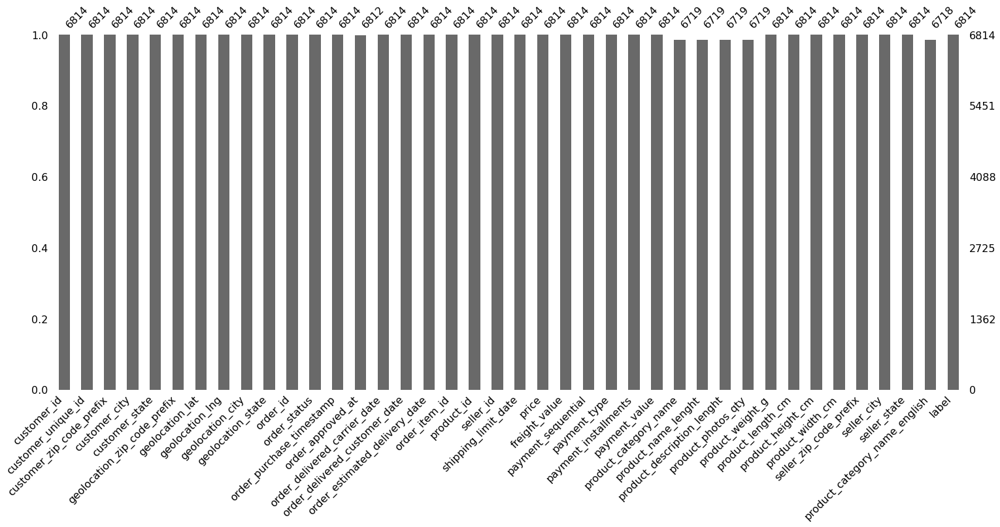

In [239]:
# Melihat jumlah missing value

mnso.bar(data1)

In [240]:
# Melihat jumlah persentase missing value

data1.isna().sum()/len(data1)

customer_id                      0.000000
customer_unique_id               0.000000
customer_zip_code_prefix         0.000000
customer_city                    0.000000
customer_state                   0.000000
geolocation_zip_code_prefix      0.000000
geolocation_lat                  0.000000
geolocation_lng                  0.000000
geolocation_city                 0.000000
geolocation_state                0.000000
order_id                         0.000000
order_status                     0.000000
order_purchase_timestamp         0.000000
order_approved_at                0.000294
order_delivered_carrier_date     0.000000
order_delivered_customer_date    0.000000
order_estimated_delivery_date    0.000000
order_item_id                    0.000000
product_id                       0.000000
seller_id                        0.000000
shipping_limit_date              0.000000
price                            0.000000
freight_value                    0.000000
payment_sequential               0

Metode penanganan missing value :

1. missing value ≤10% gunakan simple imputer yaitu median untuk kolom numerik dan modus untuk kolom kategorik <p>
2. missing value >10% dan ≤30%  gunakan KNNImputer atau <p>
3. missing value >30% drop kolom

In [241]:
# Memisahkan data kategorik dan data numerik

data1_num = data1.select_dtypes('number')
data1_cat = data1.select_dtypes('object')

In [242]:
# Menampilkan statistika deskriptif secara keseluruhan pada data numerik

data1_num.describe().T

,count,mean,std,min,25%,50%,75%,max
customer_zip_code_prefix,6814.0,33074.708248,27186.295524,1151.000000,13087.750000,24030.000000,38500.000000,99950.000000
geolocation_zip_code_prefix,6814.0,33074.708248,27186.295524,1151.000000,13087.750000,24030.000000,38500.000000,99950.000000
geolocation_lat,6814.0,-21.936902,4.408352,-33.519139,-23.600512,-22.913169,-20.421852,2.836945
geolocation_lng,6814.0,-45.901907,3.541532,-72.685562,-47.567456,-46.454536,-43.356398,-34.820877
order_item_id,6814.0,1.197388,0.657077,1.000000,1.000000,1.000000,1.000000,17.000000
price,6814.0,119.431415,181.548486,2.200000,39.990000,74.900000,134.900000,3980.000000
freight_value,6814.0,19.559297,13.698708,0.000000,13.612500,16.330000,20.907500,192.840000
payment_sequential,6814.0,1.091576,0.638881,1.000000,1.000000,1.000000,1.000000,18.000000
payment_installments,6814.0,2.900205,2.731707,1.000000,1.000000,1.000000,4.000000,24.000000
payment_value,6814.0,172.836651,258.207677,0.010000,61.595000,109.345000,192.277500,7274.880000


In [243]:
# Menampilkan statistika deskriptif secara keseluruhan pada data kategorik

data1_cat.describe().T

,count,unique,top,freq
customer_id,6814,6285,5f79f446984a2ba4f1cb86bf26f3ef64,5
customer_unique_id,6814,6248,79b23d9300163e8db6ae01c4d2eb3394,5
customer_city,6814,866,rio de janeiro,859
customer_state,6814,27,SP,2532
geolocation_city,6814,980,rio de janeiro,859
geolocation_state,6814,27,SP,2532
order_id,6814,6285,37d928cc42067f69b394747c5c71a260,5
order_status,6814,1,delivered,6814
order_purchase_timestamp,6814,6278,2017-05-25 22:27:50,5
order_approved_at,6812,6239,2017-08-08 16:15:18,5


## 2. Exploratory Data Analysis

In [244]:
# Menyaring kolom yang tidak dibutuhkan dalam EDA dan permodelan

df = data1.drop(['customer_id',
                 'customer_unique_id',
                 'order_id',
                 'order_status',
                 'product_id',
                 'seller_id',
                 'geolocation_city',
                 'geolocation_state',
                 'geolocation_zip_code_prefix',
                 'geolocation_lat',
                 'geolocation_lng',
                 'customer_city',
                 'seller_city',
                 'product_category_name'],axis=1)
df

,customer_zip_code_prefix,customer_state,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_zip_code_prefix,seller_state,product_category_name_english,label
0,36570,MG,2017-10-27 16:21:02,2017-10-27 17:31:13,2017-11-01 00:07:57,2017-11-06 20:17:37,2017-11-22 00:00:00,1,2017-11-03 16:35:40,1437.00,42.51,1,credit_card,8,1479.51,55.0,3611.0,4.0,2750,16,31,39,42738,BA,computers,0
1,72225,DF,2017-12-11 13:32:50,2017-12-11 13:50:16,2017-12-11 23:10:08,2017-12-26 19:52:23,2018-01-11 00:00:00,1,2017-12-20 13:50:16,349.90,22.85,1,credit_card,7,372.75,51.0,625.0,1.0,900,25,12,38,80310,PR,health_beauty,0
2,13160,SP,2018-02-16 20:24:06,2018-02-16 20:46:34,2018-02-20 15:37:54,2018-03-08 16:12:09,2018-03-15 00:00:00,1,2018-02-22 19:46:34,69.90,12.62,1,credit_card,3,82.52,51.0,518.0,1.0,214,18,14,13,87047,PR,computers_accessories,0
3,15600,SP,2018-01-07 10:16:22,2018-01-08 10:11:22,2018-01-09 20:45:04,2018-01-13 01:03:35,2018-02-05 00:00:00,1,2018-01-17 10:11:22,250.00,35.02,1,credit_card,6,285.02,51.0,756.0,1.0,12250,45,35,45,3204,SP,furniture_decor,0
4,29360,ES,2017-07-24 22:09:04,2017-07-24 22:23:14,2017-07-26 11:07:51,2017-08-09 17:17:38,2017-08-28 00:00:00,1,2017-07-30 22:23:14,75.90,25.81,1,credit_card,3,101.71,45.0,267.0,1.0,167,16,12,13,87083,PR,computers_accessories,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6809,13806,SP,2018-03-13 14:21:08,2018-03-13 14:35:38,2018-03-14 17:48:57,2018-03-17 02:26:53,2018-03-23 00:00:00,1,2018-03-19 14:31:43,17.80,8.64,1,credit_card,1,52.88,30.0,245.0,3.0,350,60,2,20,13465,SP,baby,1
6810,22775,RJ,2017-11-04 17:29:15,2017-11-07 16:31:17,2017-11-21 14:22:28,2017-11-23 20:28:46,2017-12-01 00:00:00,1,2017-11-21 16:30:47,194.99,59.91,1,credit_card,1,2039.20,55.0,1180.0,1.0,16167,64,62,25,8577,SP,office_furniture,0
6811,30140,MG,2017-01-30 10:12:59,2017-01-30 10:32:21,2017-02-03 10:28:31,2017-02-10 18:28:30,2017-03-27 00:00:00,2,2017-02-04 10:12:59,19.90,25.00,1,credit_card,10,102.67,30.0,305.0,1.0,100,19,3,11,8250,SP,telephony,0
6812,8615,SP,2017-07-06 13:04:57,2017-07-06 13:23:40,2017-07-06 14:07:55,2017-07-18 19:47:47,2017-07-28 00:00:00,1,2017-07-12 13:23:40,102.90,17.97,2,voucher,1,100.00,45.0,702.0,1.0,1400,33,10,49,37564,MG,luggage_accessories,1


In [245]:
# Mengubah format tanggal menjadi datetime

df['order_purchase_timestamp'] = pd.to_datetime(df['order_purchase_timestamp'])
df['order_approved_at'] = pd.to_datetime(df['order_approved_at'])
df['order_delivered_carrier_date'] = pd.to_datetime(df['order_delivered_carrier_date'])
df['order_delivered_customer_date'] = pd.to_datetime(df['order_delivered_customer_date'])
df['order_estimated_delivery_date'] = pd.to_datetime(df['order_estimated_delivery_date'])
df['shipping_limit_date'] = pd.to_datetime(df['shipping_limit_date'])

In [246]:
# Memisahkan data kategorik dan data numerik pada dataset yang digunakan

df_num = df.select_dtypes('number')
df_cat = df.select_dtypes('object')

In [247]:
# Melihat kolom numerik

df_num.columns

Index(['customer_zip_code_prefix', 'order_item_id', 'price', 'freight_value',
       'payment_sequential', 'payment_installments', 'payment_value',
       'product_name_lenght', 'product_description_lenght',
       'product_photos_qty', 'product_weight_g', 'product_length_cm',
       'product_height_cm', 'product_width_cm', 'seller_zip_code_prefix',
       'label'],
      dtype='object')

In [248]:
# Melihat kolom kategorik

df_cat.columns

Index(['customer_state', 'payment_type', 'seller_state',
       'product_category_name_english'],
      dtype='object')

EDA univariat setiap kolom numerik dengan bentuk : <p>
    a. histogram dan boxplot untuk tiap kolom<p>
    b. metrik statistik dasar untuk tiap kolom: mean, std, min, q1, q2, q3, iqr, max<p>
    c. nilai upper whisker (nilai maximum tanpa outlier) dan lower whisker (nilai minimum tanpa outlier) dari boxplot tiap kolom<p>
    d. medeteksi outlier (<q1-1.5*iqr | >q3+1.5*iqr); menghitung count dan list dari outlier tiap kolom<p>
    e. menghitung metrik skew dan lakukan skewtest untuk tiap kolom<p>


Iterasi ke- 1
Kolom :  customer_zip_code_prefix


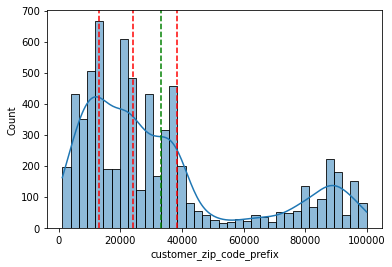

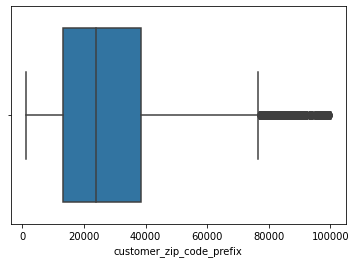


Skew Value :  1.1418702914606045
Skew Test Value :  SkewtestResult(statistic=31.337358315645798, pvalue=1.4465246376035385e-215)
count     6814.000000
mean     33074.708248
std      27186.295524
min       1151.000000
25%      13087.750000
50%      24030.000000
75%      38500.000000
max      99950.000000
Name: customer_zip_code_prefix, dtype: float64

nilai max di luar outlier = 76550
nilai min di luar outlier = 1151
jumlah outlier:1012
outlier:
[87043, 99700, 95555, 88070, 96020, 81030, 99150, 95670, 81150, 90110, 89256, 89560, 88160, 78050, 89031, 90010, 77660, 80530, 88015, 84200, 96211, 90035, 89163, 88303, 91755, 95900, 81110, 93525, 89560, 87200, 82410, 85010, 79560, 96200, 90620, 89900, 98700, 89037, 85906, 96820, 89245, 90620, 78850, 78050, 82320, 80730, 88390, 79560, 98900, 80045, 88220, 91910, 95625, 96030, 85501, 88390, 93990, 83750, 85301, 88034, 86818, 91260, 90450, 90050, 87890, 78455, 95500, 85835, 90220, 99010, 88215, 83260, 84940, 92025, 89812, 89201, 88058, 86050, 803

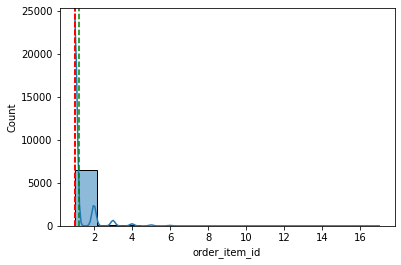

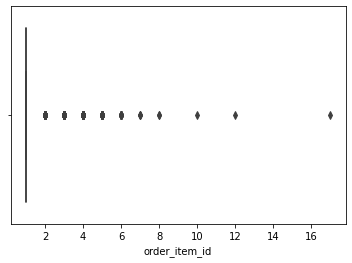


Skew Value :  6.507480642198555
Skew Test Value :  SkewtestResult(statistic=76.45854358945984, pvalue=0.0)
count    6814.000000
mean        1.197388
std         0.657077
min         1.000000
25%         1.000000
50%         1.000000
75%         1.000000
max        17.000000
Name: order_item_id, dtype: float64

nilai max di luar outlier = 1
nilai min di luar outlier = 1
jumlah outlier:873
outlier:
[3, 3, 2, 2, 6, 2, 2, 2, 2, 2, 3, 2, 2, 2, 2, 2, 2, 2, 3, 2, 2, 2, 2, 2, 2, 2, 3, 4, 2, 2, 2, 2, 2, 2, 3, 4, 2, 2, 2, 2, 2, 2, 5, 5, 2, 2, 2, 2, 2, 2, 2, 4, 2, 2, 2, 4, 2, 2, 2, 2, 3, 3, 2, 2, 2, 2, 4, 4, 2, 2, 2, 2, 2, 2, 2, 2, 3, 2, 2, 3, 2, 2, 2, 2, 2, 2, 3, 2, 2, 2, 3, 2, 3, 2, 2, 2, 2, 2, 2, 2, 4, 3, 4, 4, 3, 2, 2, 3, 2, 3, 2, 2, 2, 2, 4, 2, 4, 3, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 2, 3, 7, 3, 2, 2, 2, 2, 3, 2, 2, 2, 2, 2, 2, 3, 5, 2, 2, 2, 2, 4, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 6, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 2, 3, 2, 2, 2, 7, 3, 3, 4, 3, 2, 3, 3, 3, 2, 5, 12, 2, 2, 3, 2, 3, 2, 

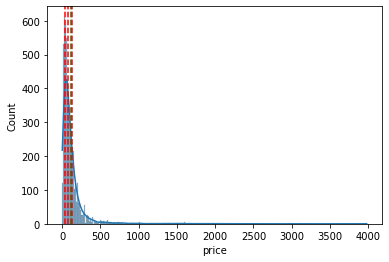

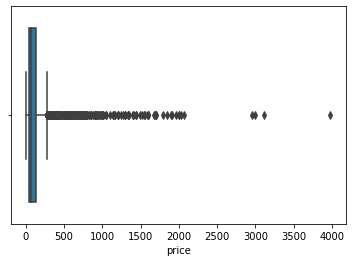


Skew Value :  7.379235598290324
Skew Test Value :  SkewtestResult(statistic=79.90329078393438, pvalue=0.0)
count    6814.000000
mean      119.431415
std       181.548486
min         2.200000
25%        39.990000
50%        74.900000
75%       134.900000
max      3980.000000
Name: price, dtype: float64

nilai max di luar outlier = 276.0
nilai min di luar outlier = 2.2
jumlah outlier:487
outlier:
[1437.0, 349.9, 418.9, 799.0, 449.9, 1699.0, 299.0, 379.0, 299.0, 599.9, 385.26, 329.0, 513.99, 299.99, 349.99, 299.0, 329.0, 412.0, 610.0, 307.58, 479.9, 546.9, 330.0, 400.0, 540.0, 570.0, 1399.99, 279.9, 1437.0, 395.65, 570.0, 295.0, 289.9, 439.9, 1997.0, 389.0, 395.65, 910.0, 314.91, 640.0, 348.8, 589.99, 2999.89, 313.9, 288.92, 890.0, 319.0, 569.0, 279.0, 499.99, 349.9, 516.49, 415.99, 1299.65, 299.0, 279.9, 539.9, 565.0, 299.9, 428.9, 360.0, 325.0, 412.0, 419.9, 759.9, 689.89, 292.9, 499.99, 299.99, 289.9, 299.0, 399.99, 520.0, 739.9, 369.9, 478.0, 299.0, 1099.0, 299.0, 319.99, 279.0, 415.

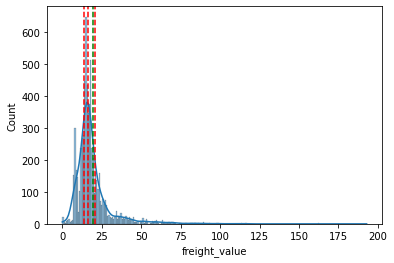

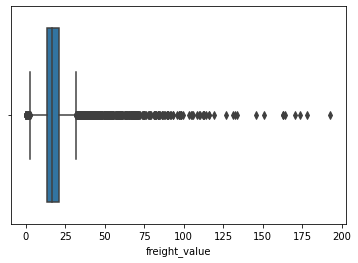


Skew Value :  4.285888787660831
Skew Test Value :  SkewtestResult(statistic=65.07523417067483, pvalue=0.0)
count    6814.000000
mean       19.559297
std        13.698708
min         0.000000
25%        13.612500
50%        16.330000
75%        20.907500
max       192.840000
Name: freight_value, dtype: float64

nilai max di luar outlier = 31.81
nilai min di luar outlier = 2.69
jumlah outlier:685
outlier:
[42.51, 35.02, 1.1, 1.74, 59.76, 170.8, 42.62, 33.5, 34.58, 46.26, 48.06, 0.0, 63.11, 57.27, 36.99, 37.03, 92.1, 33.76, 39.01, 44.37, 0.01, 50.12, 37.54, 44.38, 50.0, 43.6, 34.15, 50.85, 38.39, 50.94, 43.34, 37.61, 52.48, 98.47, 32.71, 42.51, 66.84, 60.48, 45.35, 33.89, 58.9, 63.2, 53.54, 35.28, 48.25, 50.71, 51.76, 54.48, 63.07, 41.84, 40.73, 34.15, 57.31, 32.23, 81.03, 33.08, 56.33, 35.84, 51.33, 45.09, 37.05, 50.0, 49.72, 45.25, 41.97, 35.81, 89.86, 42.95, 34.97, 31.92, 42.59, 50.96, 38.11, 43.06, 37.3, 0.0, 53.82, 70.63, 45.3, 0.0, 40.38, 32.65, 37.21, 47.35, 57.09, 2.34, 37.04, 41

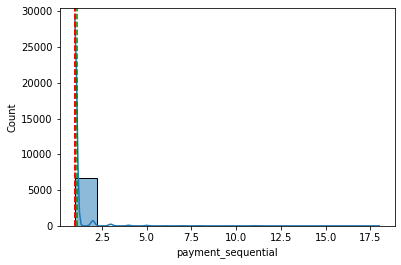

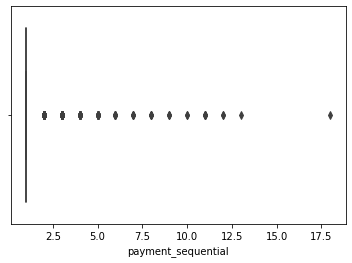


Skew Value :  12.201918029240165
Skew Test Value :  SkewtestResult(statistic=93.72619793633228, pvalue=0.0)
count    6814.000000
mean        1.091576
std         0.638881
min         1.000000
25%         1.000000
50%         1.000000
75%         1.000000
max        18.000000
Name: payment_sequential, dtype: float64

nilai max di luar outlier = 1
nilai min di luar outlier = 1
jumlah outlier:285
outlier:
[2, 4, 2, 2, 2, 11, 2, 3, 2, 5, 2, 2, 2, 2, 2, 2, 2, 2, 3, 2, 4, 2, 2, 8, 4, 2, 10, 3, 2, 2, 5, 3, 2, 4, 5, 2, 5, 3, 3, 6, 3, 2, 2, 2, 2, 3, 6, 2, 2, 2, 2, 2, 2, 2, 3, 2, 4, 2, 2, 11, 8, 2, 4, 2, 2, 2, 6, 2, 4, 3, 2, 2, 2, 2, 2, 2, 5, 2, 3, 2, 2, 3, 2, 2, 5, 3, 9, 2, 2, 2, 5, 3, 2, 2, 4, 3, 2, 3, 3, 3, 5, 2, 3, 2, 6, 2, 3, 10, 2, 2, 2, 2, 3, 4, 2, 5, 7, 2, 12, 2, 2, 2, 2, 2, 4, 2, 2, 3, 2, 2, 2, 2, 2, 3, 2, 3, 2, 2, 2, 2, 2, 2, 3, 2, 2, 2, 3, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 6, 4, 2, 2, 2, 2, 4, 3, 2, 2, 2, 8, 5, 4, 2, 2, 2, 2, 3, 2, 2, 2, 2, 2, 2, 3, 5, 2, 2, 2, 3, 2, 2, 4, 2, 2, 2, 3, 9,

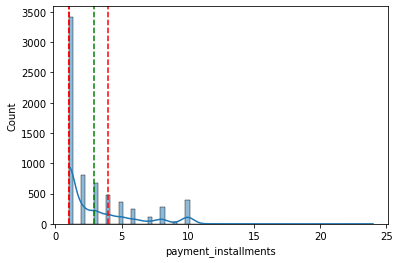

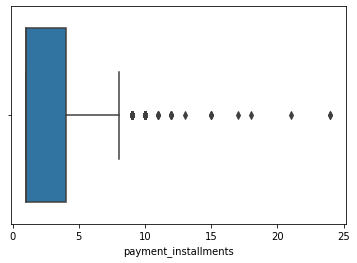


Skew Value :  1.624866162587931
Skew Test Value :  SkewtestResult(statistic=39.66809635639769, pvalue=0.0)
count    6814.000000
mean        2.900205
std         2.731707
min         1.000000
25%         1.000000
50%         1.000000
75%         4.000000
max        24.000000
Name: payment_installments, dtype: float64

nilai max di luar outlier = 8
nilai min di luar outlier = 1
jumlah outlier:456
outlier:
[10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 9, 9, 10, 10, 10, 12, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 9, 10, 10, 10, 9, 10, 11, 10, 10, 10, 10, 9, 10, 9, 10, 15, 9, 10, 10, 10, 9, 10, 10, 10, 10, 10, 9, 10, 10, 9, 10, 12, 10, 10, 10, 10, 10, 10, 10, 10, 9, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 9, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10,

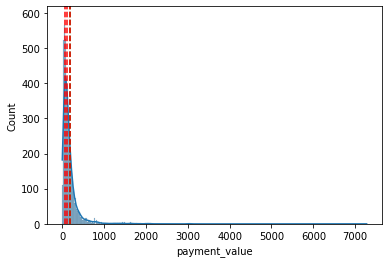

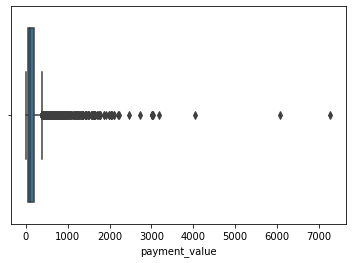


Skew Value :  9.034002463344924
Skew Test Value :  SkewtestResult(statistic=85.4577348724237, pvalue=0.0)
count    6814.000000
mean      172.836651
std       258.207677
min         0.010000
25%        61.595000
50%       109.345000
75%       192.277500
max      7274.880000
Name: payment_value, dtype: float64

nilai max di luar outlier = 387.99
nilai min di luar outlier = 0.01
jumlah outlier:529
outlier:
[1479.51, 873.86, 819.69, 470.62, 414.4, 1869.8, 1058.1, 394.67, 646.16, 473.12, 416.36, 562.05, 662.34, 826.8, 457.08, 435.72, 647.54, 501.5, 1658.7, 414.45, 425.34, 678.19, 417.68, 1087.44, 575.22, 558.53, 586.43, 1498.46, 1479.51, 462.3, 416.3, 591.87, 604.76, 456.0, 430.04, 2060.2, 411.63, 414.86, 503.86, 496.89, 688.25, 479.7, 410.1, 619.4, 765.84, 425.94, 3041.73, 971.03, 479.7, 392.56, 625.33, 521.37, 1351.44, 559.44, 433.07, 1330.88, 555.18, 618.82, 397.36, 430.75, 476.25, 479.15, 397.04, 461.77, 779.98, 712.29, 611.12, 1591.24, 576.04, 735.96, 676.92, 418.55, 567.22, 404.44, 7

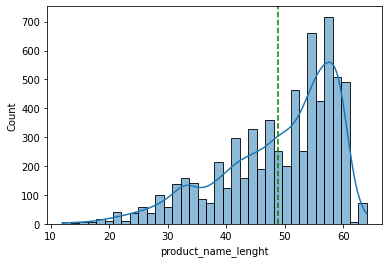

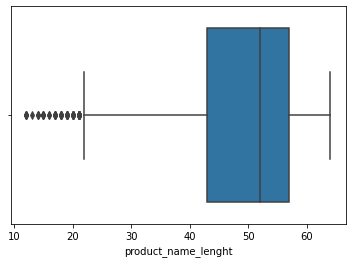


Skew Value :  nan
Skew Test Value :  SkewtestResult(statistic=nan, pvalue=nan)
count    6719.000000
mean       48.896711
std         9.876962
min        12.000000
25%        43.000000
50%        52.000000
75%        57.000000
max        64.000000
Name: product_name_lenght, dtype: float64

nilai max di luar outlier = nan
nilai min di luar outlier = nan
jumlah outlier:0
outlier:
[]


Iterasi ke- 9
Kolom :  product_description_lenght


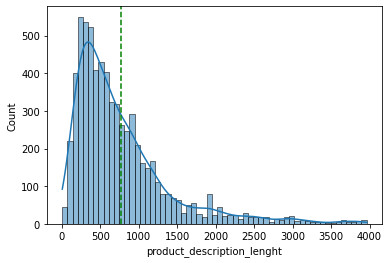

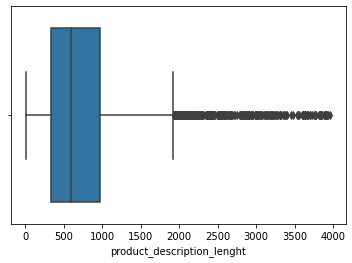


Skew Value :  nan
Skew Test Value :  SkewtestResult(statistic=nan, pvalue=nan)
count    6719.000000
mean      770.090341
std       639.562855
min         8.000000
25%       339.000000
50%       589.000000
75%       974.000000
max      3963.000000
Name: product_description_lenght, dtype: float64

nilai max di luar outlier = nan
nilai min di luar outlier = nan
jumlah outlier:0
outlier:
[]


Iterasi ke- 10
Kolom :  product_photos_qty


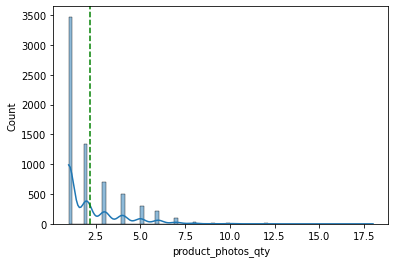

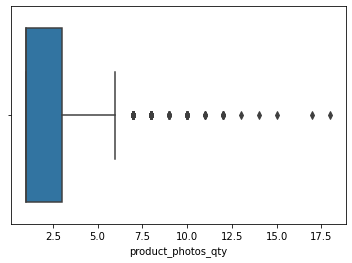


Skew Value :  nan
Skew Test Value :  SkewtestResult(statistic=nan, pvalue=nan)
count    6719.000000
mean        2.167584
std         1.715007
min         1.000000
25%         1.000000
50%         1.000000
75%         3.000000
max        18.000000
Name: product_photos_qty, dtype: float64

nilai max di luar outlier = nan
nilai min di luar outlier = nan
jumlah outlier:0
outlier:
[]


Iterasi ke- 11
Kolom :  product_weight_g


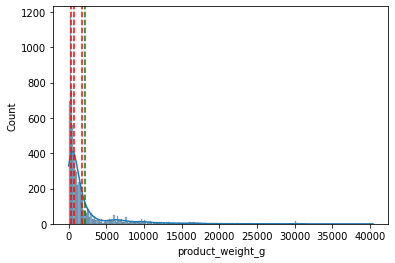

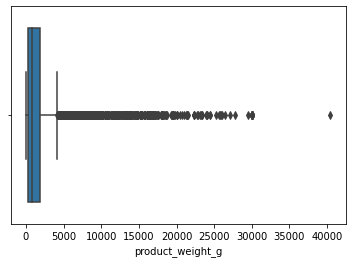


Skew Value :  3.5125753253011482
Skew Test Value :  SkewtestResult(statistic=59.70390473901165, pvalue=0.0)
count     6814.000000
mean      2133.938215
std       3735.769992
min          0.000000
25%        300.000000
50%        741.500000
75%       1825.000000
max      40425.000000
Name: product_weight_g, dtype: float64

nilai max di luar outlier = 4105
nilai min di luar outlier = 0
jumlah outlier:957
outlier:
[12250, 9900, 9950, 15700, 6038, 14400, 11325, 5150, 6617, 6050, 9088, 8200, 7750, 7150, 7650, 40425, 10050, 13500, 9200, 7550, 13388, 6550, 6038, 12600, 6550, 10700, 23100, 17000, 15350, 9000, 11800, 18600, 9450, 10125, 6150, 5950, 8300, 13300, 8850, 6663, 15250, 5200, 6600, 9550, 19575, 15100, 7400, 17250, 12050, 16750, 7625, 9450, 18000, 14050, 8100, 13867, 12650, 4867, 4350, 5950, 12150, 6650, 5200, 10700, 30000, 18500, 5150, 9750, 8875, 11825, 8150, 4867, 5500, 9000, 4950, 10050, 4450, 16200, 11350, 6550, 6050, 8100, 8450, 5400, 16400, 9800, 11875, 6500, 17050, 6600, 5250,

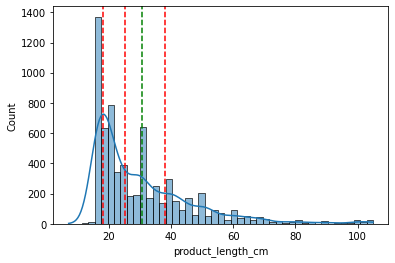

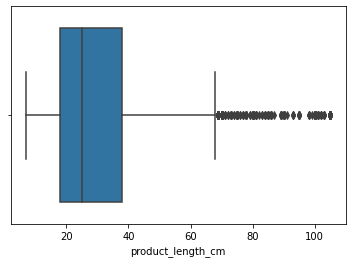


Skew Value :  1.758446792524944
Skew Test Value :  SkewtestResult(statistic=41.630211327096085, pvalue=0.0)
count    6814.000000
mean       30.510420
std        16.452926
min         7.000000
25%        18.000000
50%        25.000000
75%        38.000000
max       105.000000
Name: product_length_cm, dtype: float64

nilai max di luar outlier = 68
nilai min di luar outlier = 7
jumlah outlier:247
outlier:
[100, 90, 77, 80, 100, 100, 100, 80, 69, 85, 77, 102, 80, 105, 80, 101, 70, 70, 101, 86, 81, 80, 71, 98, 100, 70, 84, 69, 105, 102, 70, 75, 75, 90, 98, 70, 69, 69, 70, 80, 83, 78, 102, 70, 90, 90, 70, 93, 70, 89, 80, 69, 95, 70, 69, 69, 75, 95, 76, 101, 75, 86, 84, 75, 89, 73, 105, 100, 69, 100, 69, 69, 105, 80, 75, 90, 87, 100, 70, 69, 84, 80, 86, 75, 91, 80, 101, 73, 95, 70, 73, 105, 95, 102, 70, 79, 105, 105, 83, 105, 105, 74, 71, 105, 85, 73, 105, 89, 89, 80, 90, 80, 100, 72, 80, 90, 70, 105, 105, 69, 78, 70, 70, 69, 89, 100, 80, 95, 105, 80, 78, 69, 72, 100, 90, 103, 70, 100, 85, 6

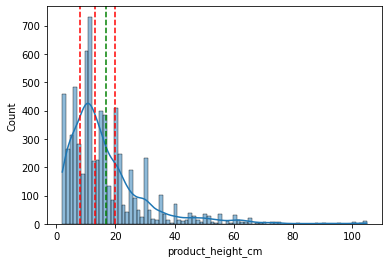

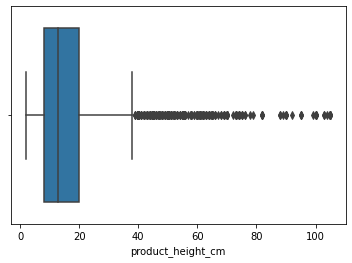


Skew Value :  2.2851943921893954
Skew Test Value :  SkewtestResult(statistic=48.31973412464129, pvalue=0.0)
count    6814.000000
mean       16.634723
std        13.606891
min         2.000000
25%         8.000000
50%        13.000000
75%        20.000000
max       105.000000
Name: product_height_cm, dtype: float64

nilai max di luar outlier = 38
nilai min di luar outlier = 2
jumlah outlier:465
outlier:
[105, 40, 46, 55, 40, 56, 65, 42, 61, 40, 51, 52, 40, 47, 47, 74, 55, 58, 40, 40, 55, 45, 45, 40, 44, 53, 49, 50, 40, 40, 46, 61, 48, 50, 60, 55, 55, 62, 40, 70, 61, 40, 45, 51, 39, 48, 65, 61, 48, 44, 40, 74, 40, 62, 60, 100, 65, 44, 45, 40, 40, 39, 104, 40, 58, 82, 51, 44, 63, 40, 60, 62, 40, 45, 40, 40, 52, 65, 40, 60, 64, 61, 103, 50, 53, 45, 50, 40, 42, 55, 52, 48, 40, 60, 76, 50, 63, 50, 40, 60, 58, 67, 50, 45, 50, 49, 42, 49, 47, 70, 45, 40, 60, 40, 62, 39, 45, 64, 62, 95, 57, 45, 40, 65, 55, 49, 53, 76, 44, 52, 62, 40, 105, 73, 51, 47, 40, 56, 50, 55, 68, 52, 66, 82, 49, 56, 61,

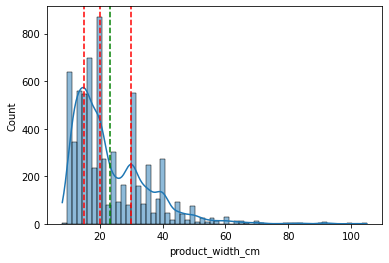

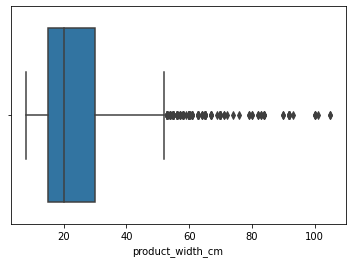


Skew Value :  1.7268626846073334
Skew Test Value :  SkewtestResult(statistic=41.17750953589188, pvalue=0.0)
count    6814.000000
mean       23.314500
std        11.937758
min         8.000000
25%        15.000000
50%        20.000000
75%        30.000000
max       105.000000
Name: product_width_cm, dtype: float64

nilai max di luar outlier = 52
nilai min di luar outlier = 8
jumlah outlier:163
outlier:
[55, 65, 79, 60, 64, 65, 79, 70, 56, 55, 61, 60, 57, 67, 55, 60, 100, 55, 84, 70, 60, 53, 92, 82, 67, 92, 63, 70, 65, 100, 93, 63, 92, 80, 56, 92, 55, 56, 53, 84, 65, 54, 90, 61, 58, 70, 65, 60, 84, 92, 56, 60, 65, 58, 70, 63, 70, 58, 70, 58, 71, 70, 60, 71, 60, 63, 63, 92, 60, 76, 92, 54, 53, 92, 60, 55, 55, 60, 82, 64, 53, 60, 53, 56, 53, 58, 57, 67, 56, 55, 56, 105, 69, 60, 101, 59, 58, 56, 53, 53, 70, 64, 53, 55, 53, 105, 60, 61, 70, 60, 56, 60, 60, 61, 92, 58, 74, 55, 65, 72, 54, 60, 80, 61, 61, 58, 60, 65, 53, 60, 57, 67, 65, 100, 90, 65, 61, 55, 54, 55, 63, 54, 63, 57, 56, 83, 58,

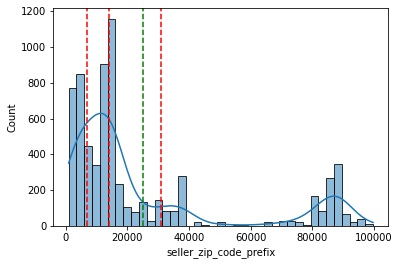

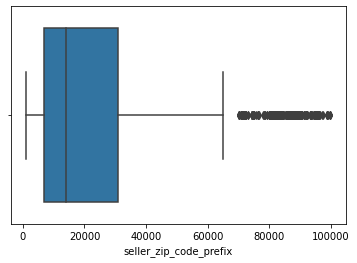


Skew Value :  1.488485953647959
Skew Test Value :  SkewtestResult(statistic=37.52745721528816, pvalue=3.28580966395506e-308)
count     6814.000000
mean     25225.881127
std      28184.961478
min       1021.000000
25%       6871.000000
50%      14020.000000
75%      30882.000000
max      99730.000000
Name: seller_zip_code_prefix, dtype: float64

nilai max di luar outlier = 65072
nilai min di luar outlier = 1021
jumlah outlier:1084
outlier:
[80310, 87047, 87083, 80610, 88037, 88132, 89225, 87047, 87502, 91740, 88330, 92030, 88085, 87504, 88504, 85801, 88220, 87083, 89160, 87045, 87050, 80230, 80610, 85501, 88301, 89460, 87047, 87025, 85801, 86010, 81350, 89023, 80330, 71070, 88501, 85904, 73020, 89160, 89460, 76400, 82400, 78095, 70645, 88359, 87083, 83830, 87030, 87030, 81825, 87025, 89560, 89560, 83010, 82810, 88037, 86010, 80310, 89036, 88301, 81880, 74333, 87025, 88063, 87050, 89204, 90230, 86050, 74930, 87050, 70235, 74645, 88115, 91510, 80330, 83010, 82510, 86050, 89041, 88301, 70

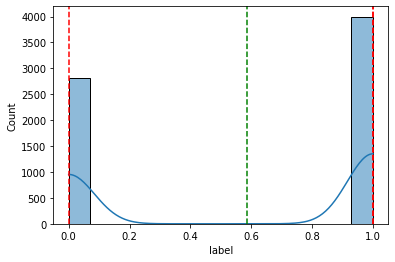

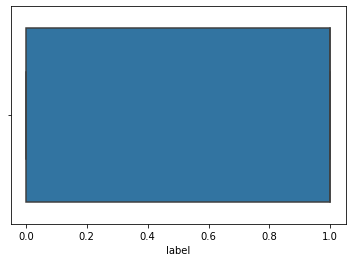


Skew Value :  -0.35104440557728234
Skew Test Value :  SkewtestResult(statistic=-11.506610603997254, pvalue=1.2218678956966523e-30)
count    6814.000000
mean        0.586440
std         0.492508
min         0.000000
25%         0.000000
50%         1.000000
75%         1.000000
max         1.000000
Name: label, dtype: float64

nilai max di luar outlier = 1
nilai min di luar outlier = 0
jumlah outlier:0
outlier:
[]



In [249]:
# Melakukan EDA Univariat pada setiap kolom numerik dataset

# Membuat list nama kolom numerik
list_kontinu = list(df_num.columns)

# Membuat loop
iter = 1
for i in list_kontinu:
  print()
  print('Iterasi ke-',iter)
  print('Kolom : ',i)
  sns.histplot(df_num[i],kde=True)
  plt.axvline(np.mean(df_num[i]),c='green',linestyle='--')
  plt.axvline(np.percentile(df_num[i],25),c='red',linestyle='--')
  plt.axvline(np.percentile(df_num[i],50),c='red',linestyle='--')
  plt.axvline(np.percentile(df_num[i],75),c='red',linestyle='--')
  plt.show()
  sns.boxplot(data=df_num, x=df_num[i])
  plt.show()

  print()
  print('Skew Value : ',skew(df_num[i]))
  print('Skew Test Value : ',skewtest(df_num[i]))
  print(df_num[i].describe())
  
  print()
  Q1 = np.percentile(df_num[i],25)
  Q2 = np.percentile(df_num[i],50)
  Q3 = np.percentile(df_num[i],75)
  IQR = Q3-Q1

  upper_f = Q3 + 1.5 * IQR
  lower_f = Q1 - 1.5 * IQR

  upper_w = np.max(df_num[df_num[i] <= upper_f][i])
  lower_w = np.min(df_num[df_num[i] >= lower_f][i])
  outlier = list(df_num[(df_num[i] < lower_w) | (df_num[i] > upper_f)][i])

  print('nilai max di luar outlier = {}'.format(upper_w))
  print('nilai min di luar outlier = {}'.format(lower_w))
  print('jumlah outlier:{}'.format(len(outlier)))
  print('outlier:')
  print(outlier)
  iter+=1
  print()

EDA univariat untuk setiap kolom kategorikal dengan countplot untuk tiap kolom dan jumlah kategori unik, daftar kategori unik dan value counts tiap kategori unik<p>


Iterasi ke- 1
Kolom :  customer_state


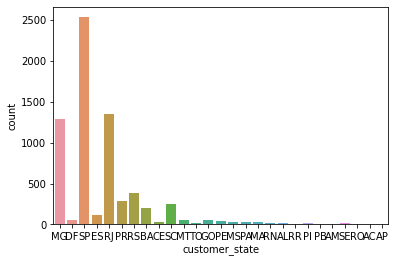

Jumlah kategori unik : 27
Jumlah nilai kategori unik : ['MG', 'DF', 'SP', 'ES', 'RJ', 'PR', 'RS', 'BA', 'CE', 'SC', 'MT', 'TO', 'GO', 'PE', 'MS', 'PA', 'MA', 'RN', 'AL', 'RR', 'PI', 'PB', 'AM', 'SE', 'RO', 'AC', 'AP']
Jumlah total nilai kategori unik :
SP    2532
RJ    1347
MG    1284
RS     387
PR     282
SC     250
BA     201
ES     113
DF      55
GO      54
MT      49
PE      46
CE      35
PA      34
MA      28
MS      25
RN      18
AL      13
SE      13
TO      11
PI      11
PB      10
RO       8
AM       3
AC       3
RR       1
AP       1
Name: customer_state, dtype: int64


Iterasi ke- 2
Kolom :  payment_type


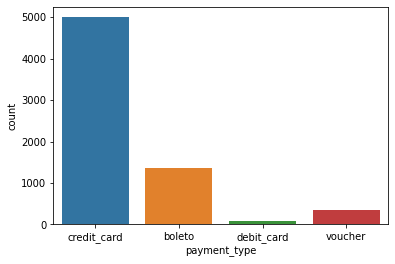

Jumlah kategori unik : 4
Jumlah nilai kategori unik : ['credit_card', 'boleto', 'debit_card', 'voucher']
Jumlah total nilai kategori unik :
credit_card    4991
boleto         1369
voucher         360
debit_card       94
Name: payment_type, dtype: int64


Iterasi ke- 3
Kolom :  seller_state


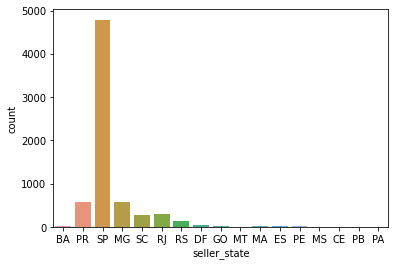

Jumlah kategori unik : 17
Jumlah nilai kategori unik : ['BA', 'PR', 'SP', 'MG', 'SC', 'RJ', 'RS', 'DF', 'GO', 'MT', 'MA', 'ES', 'PE', 'MS', 'CE', 'PB', 'PA']
Jumlah total nilai kategori unik :
SP    4787
PR     570
MG     568
RJ     296
SC     268
RS     137
DF      47
BA      31
GO      30
PE      24
MA      23
ES      19
MT       5
PB       4
MS       2
CE       2
PA       1
Name: seller_state, dtype: int64


Iterasi ke- 4
Kolom :  product_category_name_english


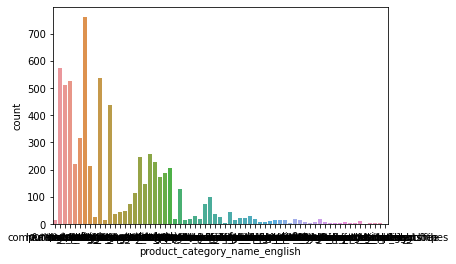

Jumlah kategori unik : 68
Jumlah nilai kategori unik : ['computers', 'health_beauty', 'computers_accessories', 'furniture_decor', 'cool_stuff', 'watches_gifts', 'bed_bath_table', 'perfumery', 'drinks', 'sports_leisure', 'signaling_and_security', 'housewares', 'home_construction', 'home_appliances', 'construction_tools_construction', 'luggage_accessories', 'fashion_bags_accessories', 'auto', 'stationery', 'garden_tools', 'toys', 'electronics', 'baby', 'telephony', 'home_appliances_2', 'pet_shop', 'industry_commerce_and_business', 'kitchen_dining_laundry_garden_furniture', 'books_general_interest', nan, 'fixed_telephony', 'consoles_games', 'office_furniture', 'musical_instruments', 'home_confort', 'furniture_mattress_and_upholstery', 'small_appliances', 'costruction_tools_garden', 'food', 'agro_industry_and_commerce', 'furniture_living_room', 'fashion_shoes', 'cine_photo', 'fashion_male_clothing', 'fashion_underwear_beach', 'market_place', 'audio', 'food_drink', 'diapers_and_hygiene', 'b

In [250]:
# Melakukan EDA Univariat pada setiap kolom kategorikal dataset

# Membuat list nama kolom kategorikal
list_kategori = list(df_cat.columns)

# Membuat loop
iter = 1
for i in list_kategori:
  print()
  print('Iterasi ke-',iter)
  print('Kolom : ',i)
  sns.countplot(data = df_cat, x = i)
  plt.show()
    
  print('Jumlah kategori unik :', len(df_cat[i].unique()))
  print('Jumlah nilai kategori unik :', list(df_cat[i].unique()))
  print('Jumlah total nilai kategori unik :')
  print(df_cat[i].value_counts())
  iter+=1
  print()

EDA multivariat untuk tiap pasangan kolom numerik-numerik dengan lmplot antar kolom numerik dengan kolom 'label' sebagai hue

In [251]:
# Membuat list pasangan nama kolom numerikal
col1 = list(df_num.columns)
col2 = list(df_num.columns)

col1.remove('label')
col2.remove('label')

list_pasangan = []
for i in col1:
  for j in col2:
    list_temp = sorted([i,j])
    if list_temp not in list_pasangan and i != j :
        list_pasangan.append(list_temp)

len(list_pasangan)

105

iterasi ke- 1
kombinasi pasangan i : customer_zip_code_prefix dan kombinasi pasangan j : order_item_id


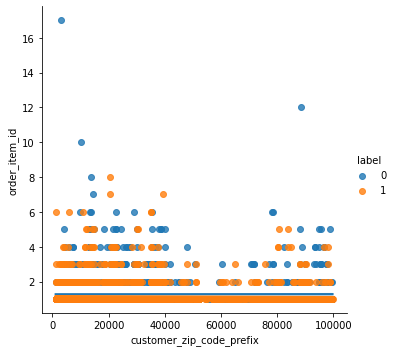


iterasi ke- 2
kombinasi pasangan i : customer_zip_code_prefix dan kombinasi pasangan j : price


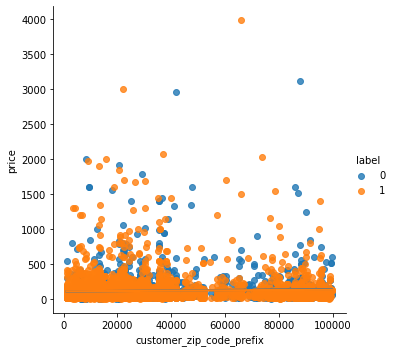


iterasi ke- 3
kombinasi pasangan i : customer_zip_code_prefix dan kombinasi pasangan j : freight_value


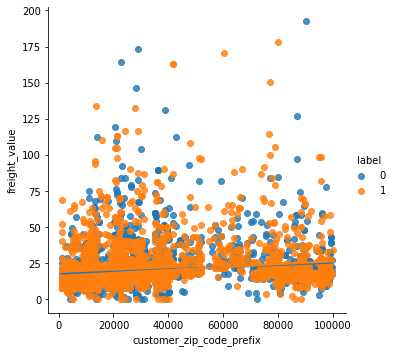


iterasi ke- 4
kombinasi pasangan i : customer_zip_code_prefix dan kombinasi pasangan j : payment_sequential


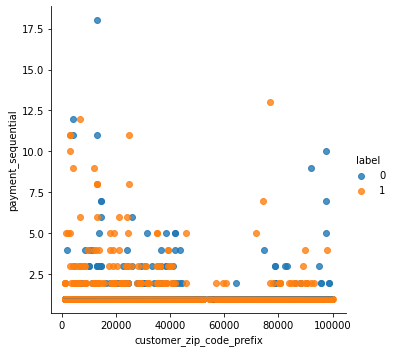


iterasi ke- 5
kombinasi pasangan i : customer_zip_code_prefix dan kombinasi pasangan j : payment_installments


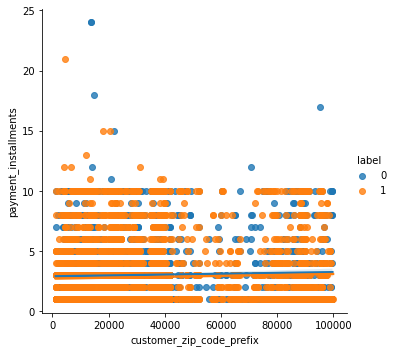


iterasi ke- 6
kombinasi pasangan i : customer_zip_code_prefix dan kombinasi pasangan j : payment_value


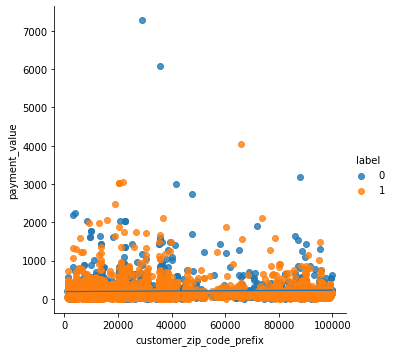


iterasi ke- 7
kombinasi pasangan i : customer_zip_code_prefix dan kombinasi pasangan j : product_name_lenght


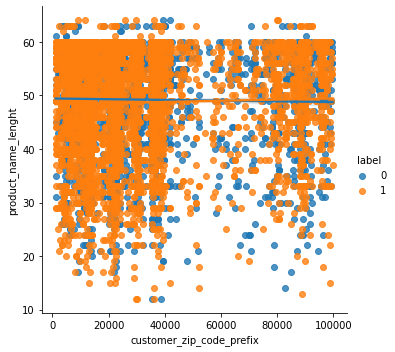


iterasi ke- 8
kombinasi pasangan i : customer_zip_code_prefix dan kombinasi pasangan j : product_description_lenght


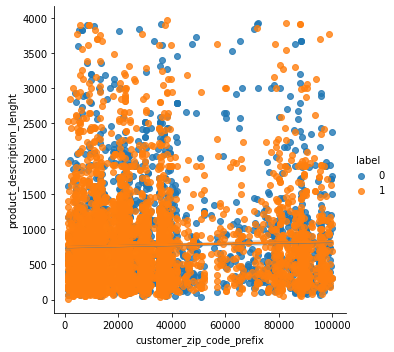


iterasi ke- 9
kombinasi pasangan i : customer_zip_code_prefix dan kombinasi pasangan j : product_photos_qty


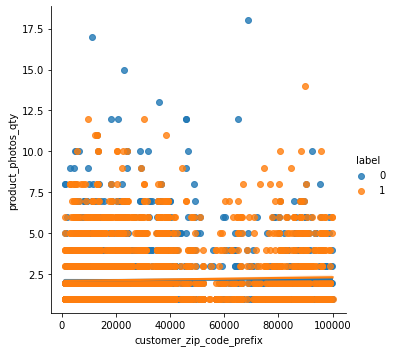


iterasi ke- 10
kombinasi pasangan i : customer_zip_code_prefix dan kombinasi pasangan j : product_weight_g


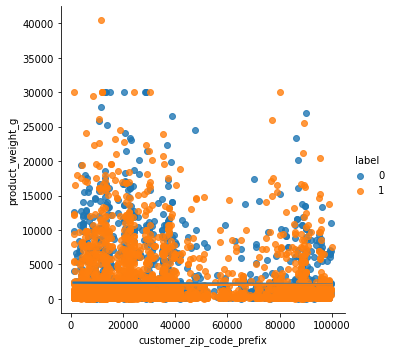


iterasi ke- 11
kombinasi pasangan i : customer_zip_code_prefix dan kombinasi pasangan j : product_length_cm


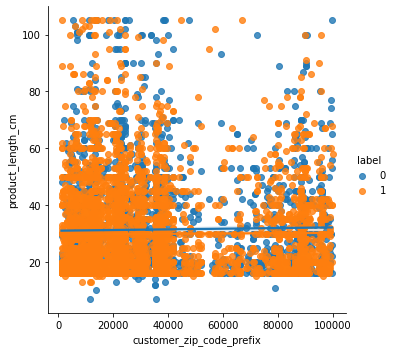


iterasi ke- 12
kombinasi pasangan i : customer_zip_code_prefix dan kombinasi pasangan j : product_height_cm


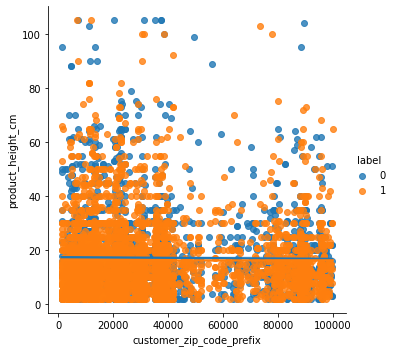


iterasi ke- 13
kombinasi pasangan i : customer_zip_code_prefix dan kombinasi pasangan j : product_width_cm


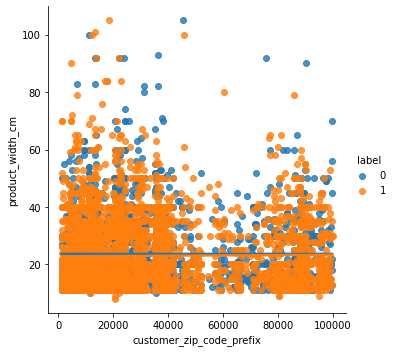


iterasi ke- 14
kombinasi pasangan i : customer_zip_code_prefix dan kombinasi pasangan j : seller_zip_code_prefix


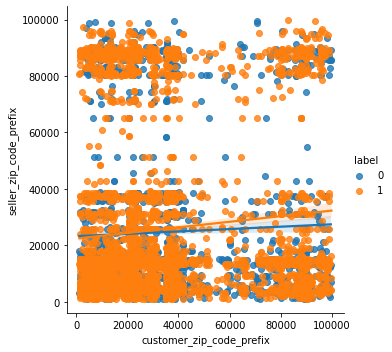


iterasi ke- 15
kombinasi pasangan i : order_item_id dan kombinasi pasangan j : price


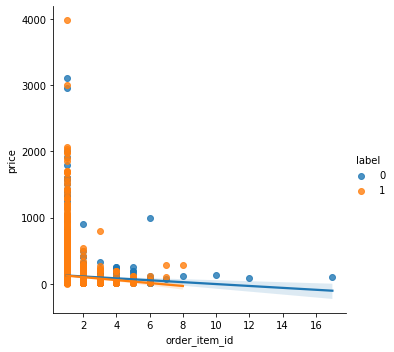


iterasi ke- 16
kombinasi pasangan i : freight_value dan kombinasi pasangan j : order_item_id


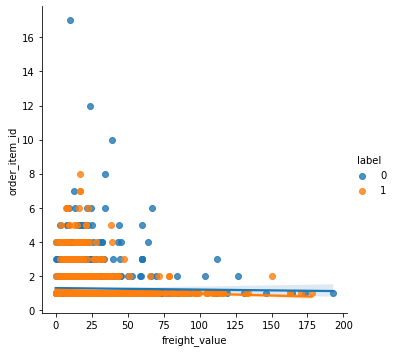


iterasi ke- 17
kombinasi pasangan i : order_item_id dan kombinasi pasangan j : payment_sequential


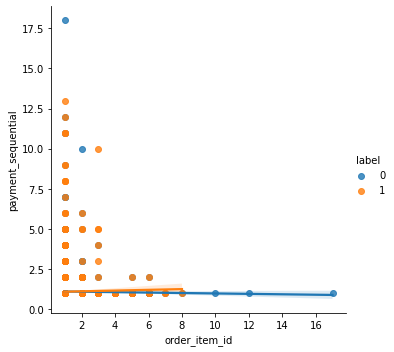


iterasi ke- 18
kombinasi pasangan i : order_item_id dan kombinasi pasangan j : payment_installments


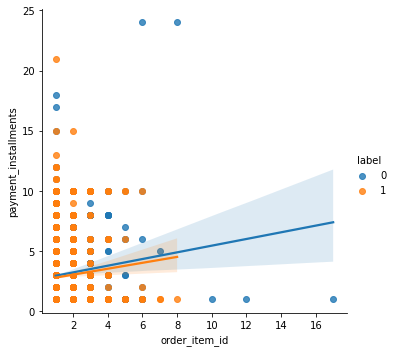


iterasi ke- 19
kombinasi pasangan i : order_item_id dan kombinasi pasangan j : payment_value


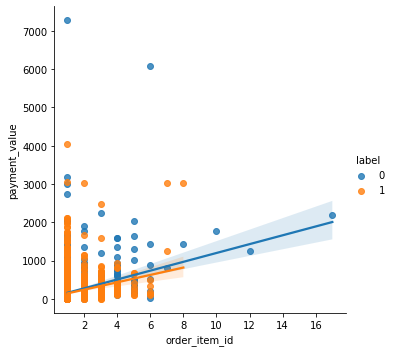


iterasi ke- 20
kombinasi pasangan i : order_item_id dan kombinasi pasangan j : product_name_lenght


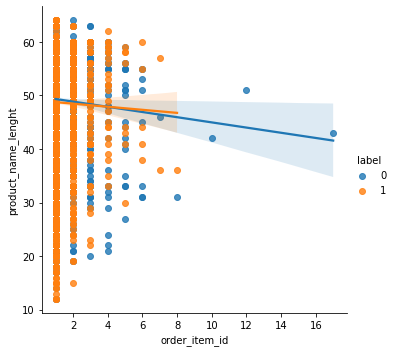


iterasi ke- 21
kombinasi pasangan i : order_item_id dan kombinasi pasangan j : product_description_lenght


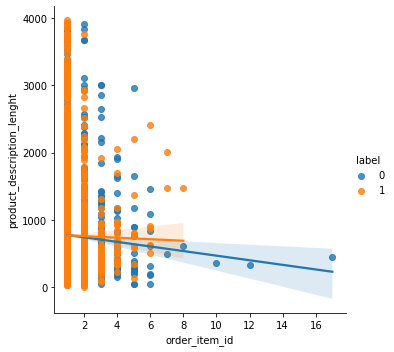


iterasi ke- 22
kombinasi pasangan i : order_item_id dan kombinasi pasangan j : product_photos_qty


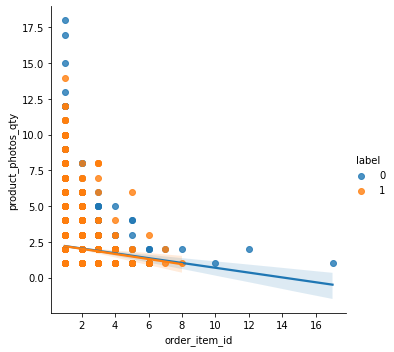


iterasi ke- 23
kombinasi pasangan i : order_item_id dan kombinasi pasangan j : product_weight_g


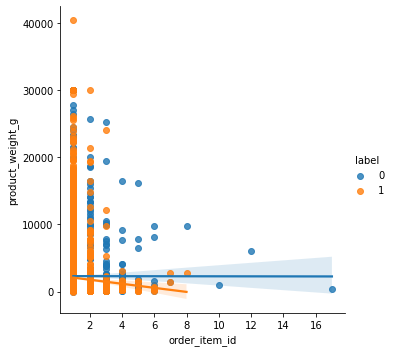


iterasi ke- 24
kombinasi pasangan i : order_item_id dan kombinasi pasangan j : product_length_cm


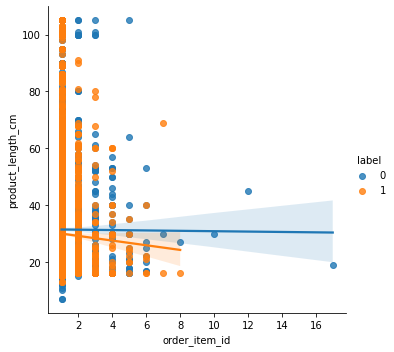


iterasi ke- 25
kombinasi pasangan i : order_item_id dan kombinasi pasangan j : product_height_cm


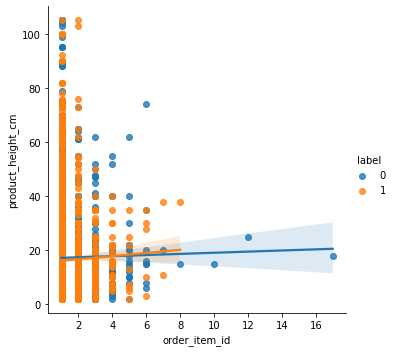


iterasi ke- 26
kombinasi pasangan i : order_item_id dan kombinasi pasangan j : product_width_cm


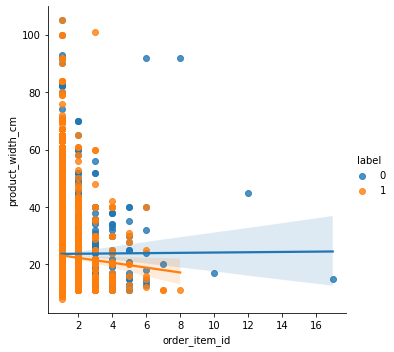


iterasi ke- 27
kombinasi pasangan i : order_item_id dan kombinasi pasangan j : seller_zip_code_prefix


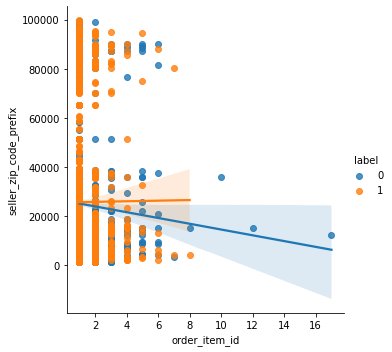


iterasi ke- 28
kombinasi pasangan i : freight_value dan kombinasi pasangan j : price


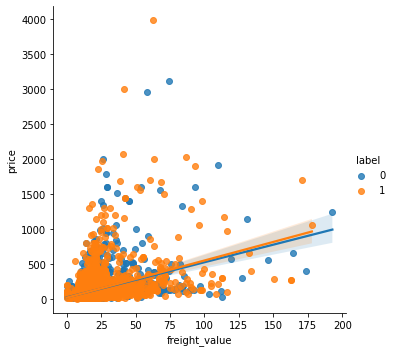


iterasi ke- 29
kombinasi pasangan i : payment_sequential dan kombinasi pasangan j : price


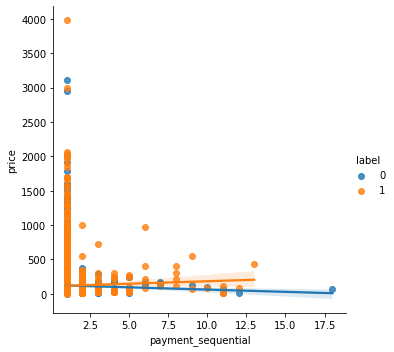


iterasi ke- 30
kombinasi pasangan i : payment_installments dan kombinasi pasangan j : price


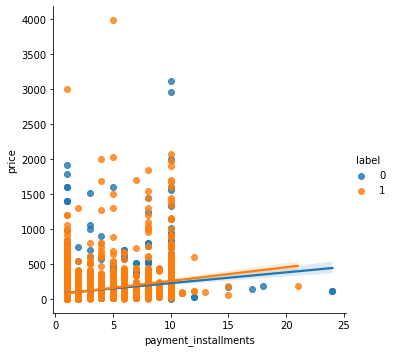


iterasi ke- 31
kombinasi pasangan i : payment_value dan kombinasi pasangan j : price


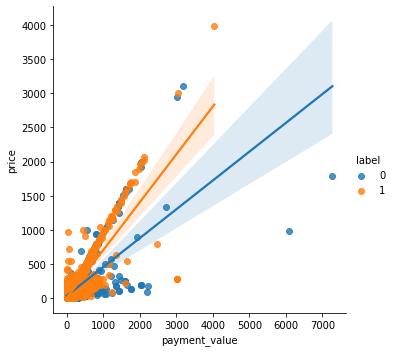


iterasi ke- 32
kombinasi pasangan i : price dan kombinasi pasangan j : product_name_lenght


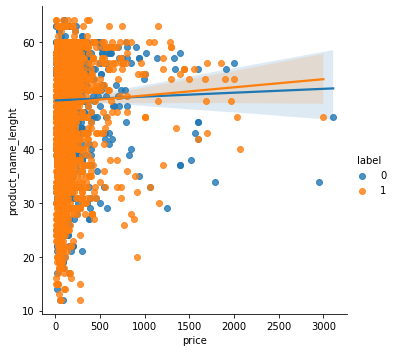


iterasi ke- 33
kombinasi pasangan i : price dan kombinasi pasangan j : product_description_lenght


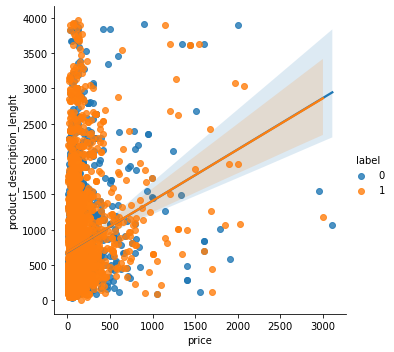


iterasi ke- 34
kombinasi pasangan i : price dan kombinasi pasangan j : product_photos_qty


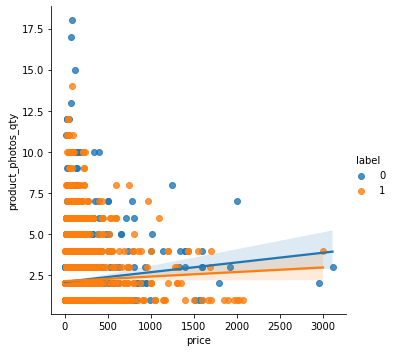


iterasi ke- 35
kombinasi pasangan i : price dan kombinasi pasangan j : product_weight_g


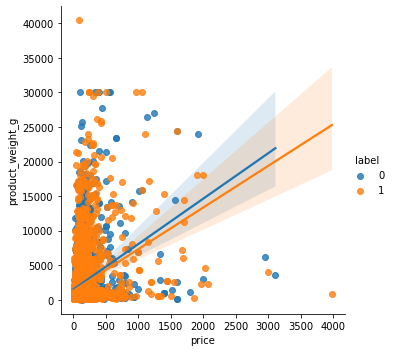


iterasi ke- 36
kombinasi pasangan i : price dan kombinasi pasangan j : product_length_cm


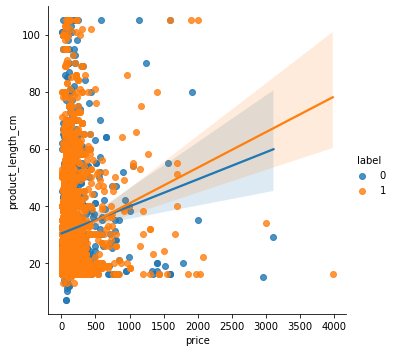


iterasi ke- 37
kombinasi pasangan i : price dan kombinasi pasangan j : product_height_cm


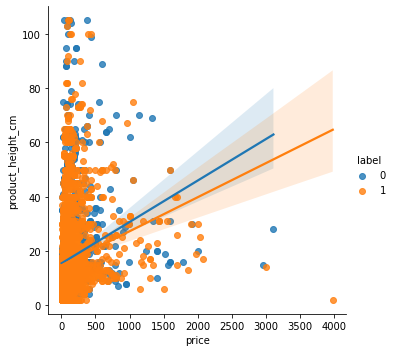


iterasi ke- 38
kombinasi pasangan i : price dan kombinasi pasangan j : product_width_cm


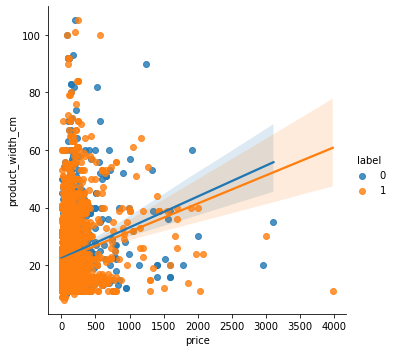


iterasi ke- 39
kombinasi pasangan i : price dan kombinasi pasangan j : seller_zip_code_prefix


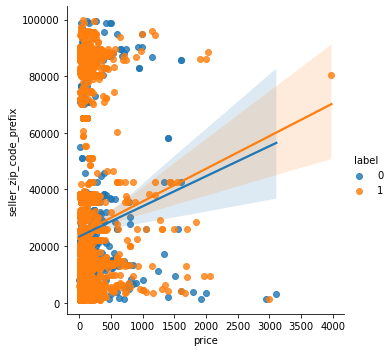


iterasi ke- 40
kombinasi pasangan i : freight_value dan kombinasi pasangan j : payment_sequential


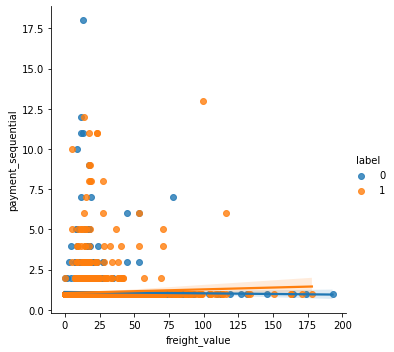


iterasi ke- 41
kombinasi pasangan i : freight_value dan kombinasi pasangan j : payment_installments


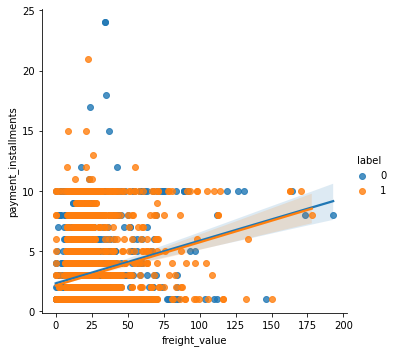


iterasi ke- 42
kombinasi pasangan i : freight_value dan kombinasi pasangan j : payment_value


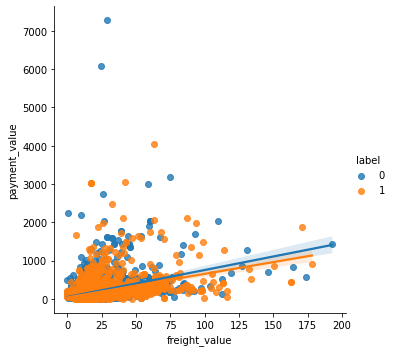


iterasi ke- 43
kombinasi pasangan i : freight_value dan kombinasi pasangan j : product_name_lenght


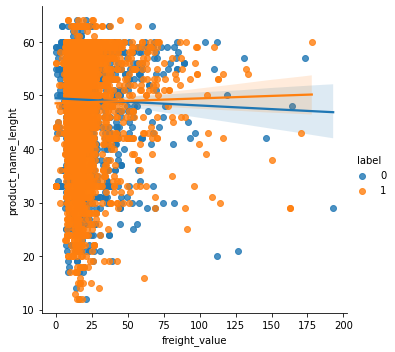


iterasi ke- 44
kombinasi pasangan i : freight_value dan kombinasi pasangan j : product_description_lenght


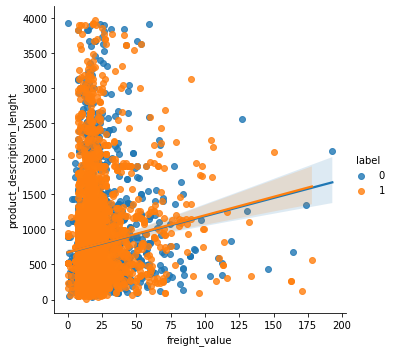


iterasi ke- 45
kombinasi pasangan i : freight_value dan kombinasi pasangan j : product_photos_qty


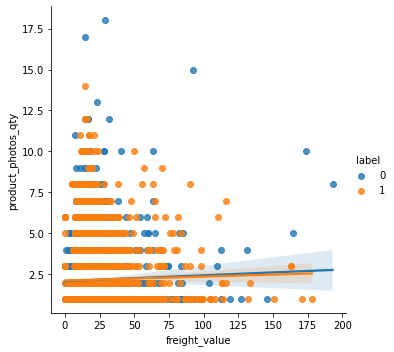


iterasi ke- 46
kombinasi pasangan i : freight_value dan kombinasi pasangan j : product_weight_g


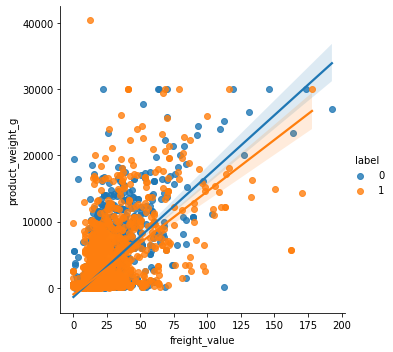


iterasi ke- 47
kombinasi pasangan i : freight_value dan kombinasi pasangan j : product_length_cm


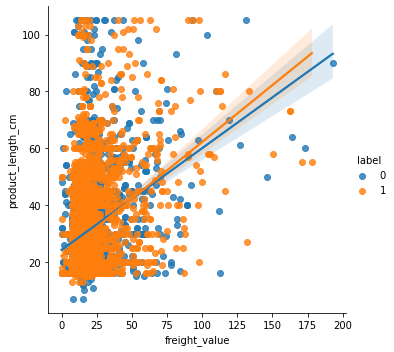


iterasi ke- 48
kombinasi pasangan i : freight_value dan kombinasi pasangan j : product_height_cm


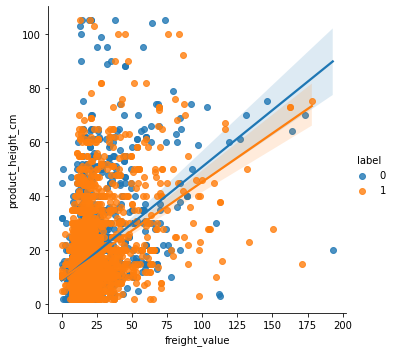


iterasi ke- 49
kombinasi pasangan i : freight_value dan kombinasi pasangan j : product_width_cm


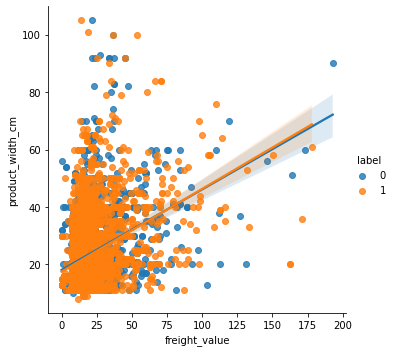


iterasi ke- 50
kombinasi pasangan i : freight_value dan kombinasi pasangan j : seller_zip_code_prefix


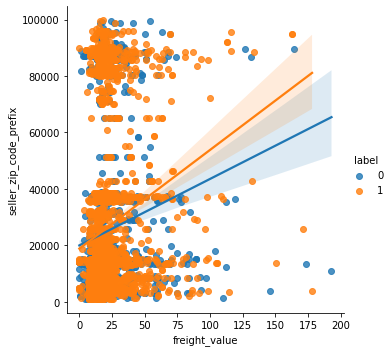


iterasi ke- 51
kombinasi pasangan i : payment_installments dan kombinasi pasangan j : payment_sequential


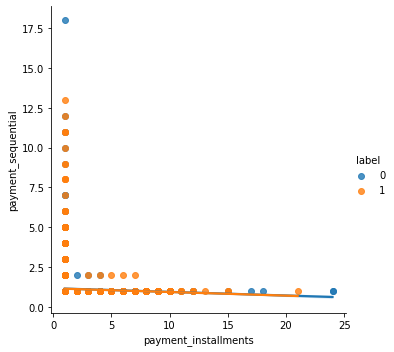


iterasi ke- 52
kombinasi pasangan i : payment_sequential dan kombinasi pasangan j : payment_value


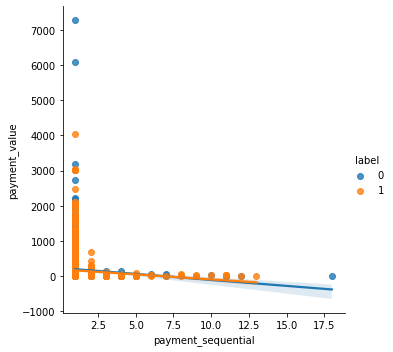


iterasi ke- 53
kombinasi pasangan i : payment_sequential dan kombinasi pasangan j : product_name_lenght


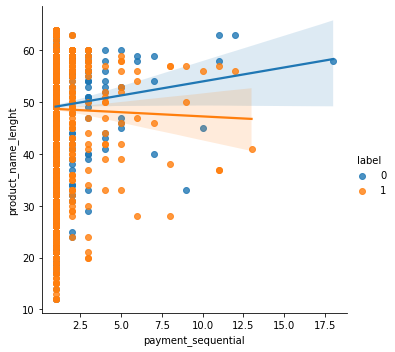


iterasi ke- 54
kombinasi pasangan i : payment_sequential dan kombinasi pasangan j : product_description_lenght


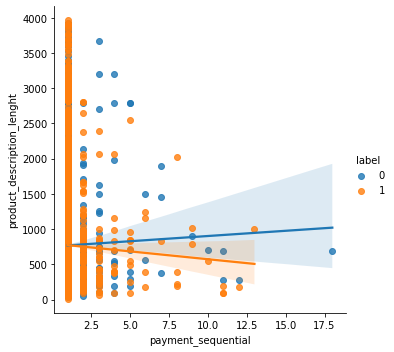


iterasi ke- 55
kombinasi pasangan i : payment_sequential dan kombinasi pasangan j : product_photos_qty


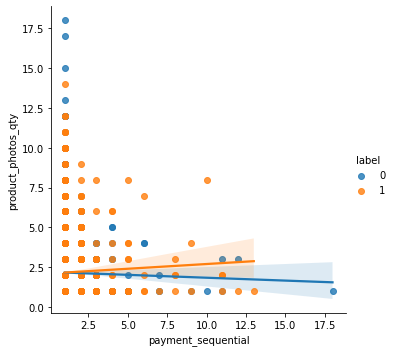


iterasi ke- 56
kombinasi pasangan i : payment_sequential dan kombinasi pasangan j : product_weight_g


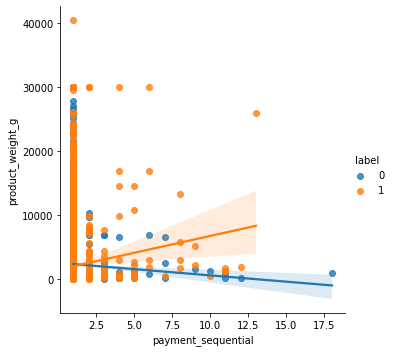


iterasi ke- 57
kombinasi pasangan i : payment_sequential dan kombinasi pasangan j : product_length_cm


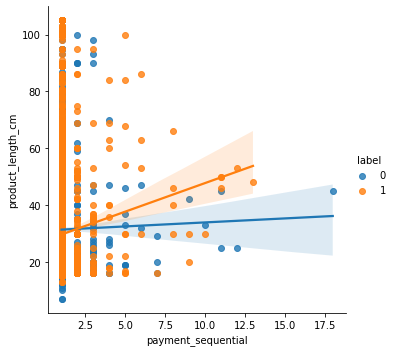


iterasi ke- 58
kombinasi pasangan i : payment_sequential dan kombinasi pasangan j : product_height_cm


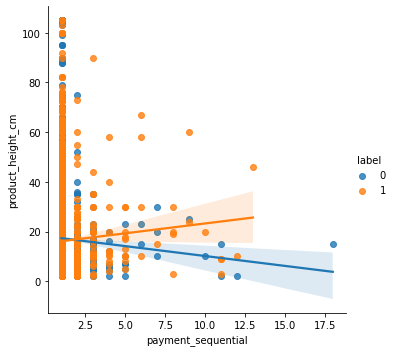


iterasi ke- 59
kombinasi pasangan i : payment_sequential dan kombinasi pasangan j : product_width_cm


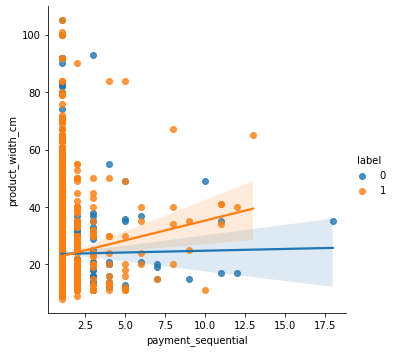


iterasi ke- 60
kombinasi pasangan i : payment_sequential dan kombinasi pasangan j : seller_zip_code_prefix


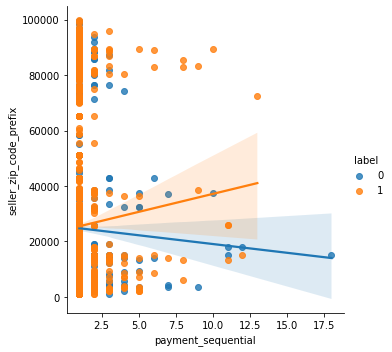


iterasi ke- 61
kombinasi pasangan i : payment_installments dan kombinasi pasangan j : payment_value


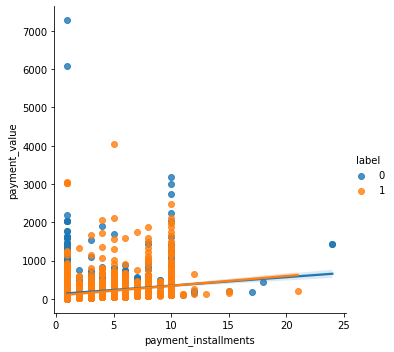


iterasi ke- 62
kombinasi pasangan i : payment_installments dan kombinasi pasangan j : product_name_lenght


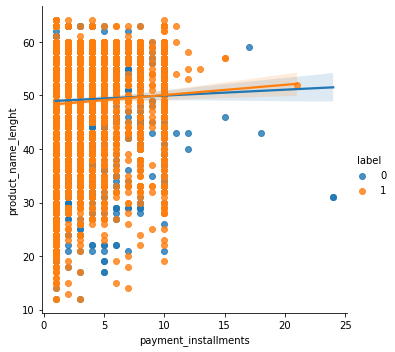


iterasi ke- 63
kombinasi pasangan i : payment_installments dan kombinasi pasangan j : product_description_lenght


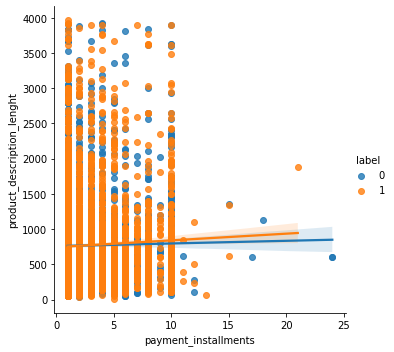


iterasi ke- 64
kombinasi pasangan i : payment_installments dan kombinasi pasangan j : product_photos_qty


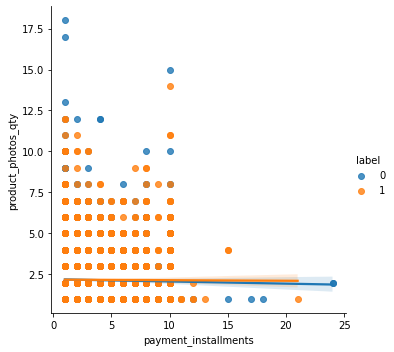


iterasi ke- 65
kombinasi pasangan i : payment_installments dan kombinasi pasangan j : product_weight_g


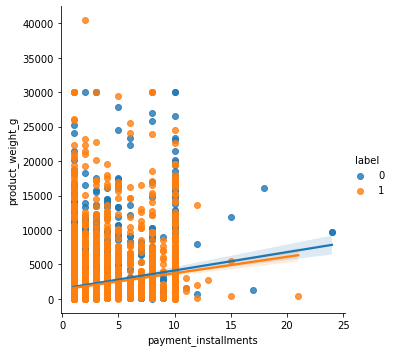


iterasi ke- 66
kombinasi pasangan i : payment_installments dan kombinasi pasangan j : product_length_cm


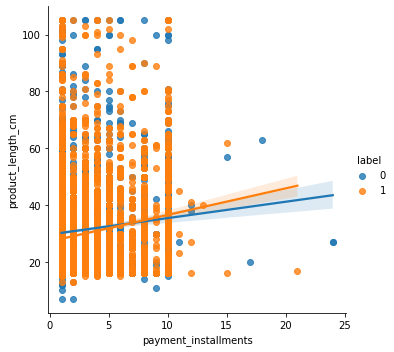


iterasi ke- 67
kombinasi pasangan i : payment_installments dan kombinasi pasangan j : product_height_cm


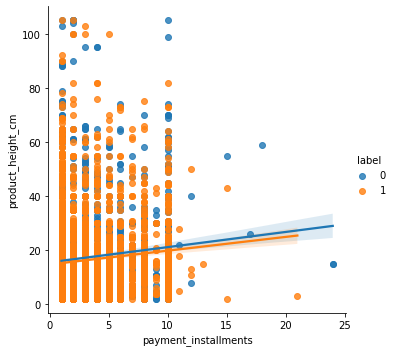


iterasi ke- 68
kombinasi pasangan i : payment_installments dan kombinasi pasangan j : product_width_cm


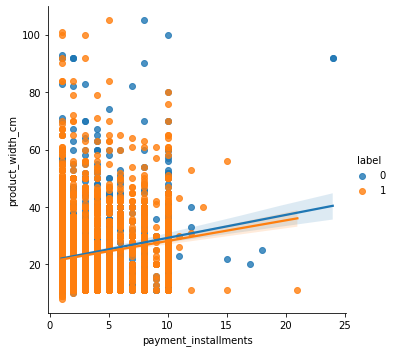


iterasi ke- 69
kombinasi pasangan i : payment_installments dan kombinasi pasangan j : seller_zip_code_prefix


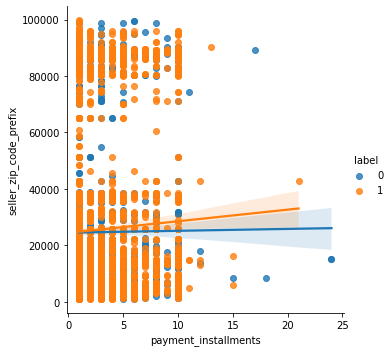


iterasi ke- 70
kombinasi pasangan i : payment_value dan kombinasi pasangan j : product_name_lenght


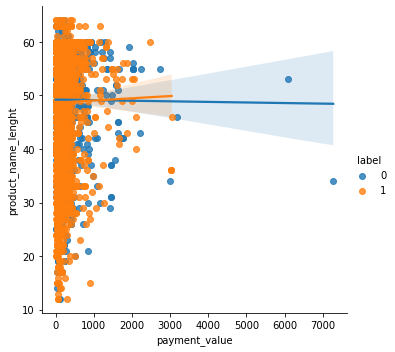


iterasi ke- 71
kombinasi pasangan i : payment_value dan kombinasi pasangan j : product_description_lenght


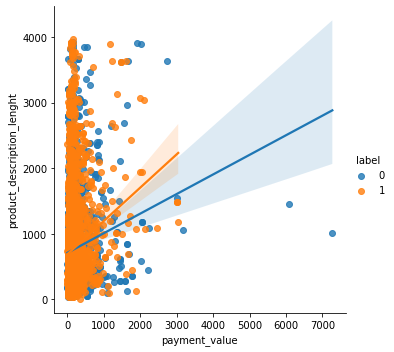


iterasi ke- 72
kombinasi pasangan i : payment_value dan kombinasi pasangan j : product_photos_qty


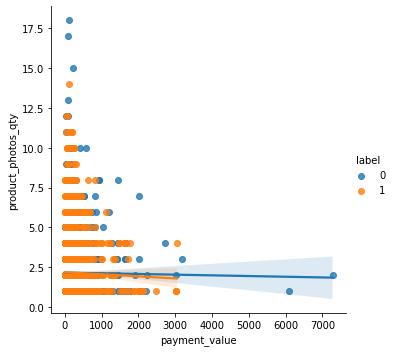


iterasi ke- 73
kombinasi pasangan i : payment_value dan kombinasi pasangan j : product_weight_g


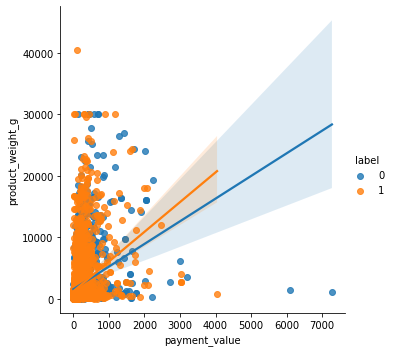


iterasi ke- 74
kombinasi pasangan i : payment_value dan kombinasi pasangan j : product_length_cm


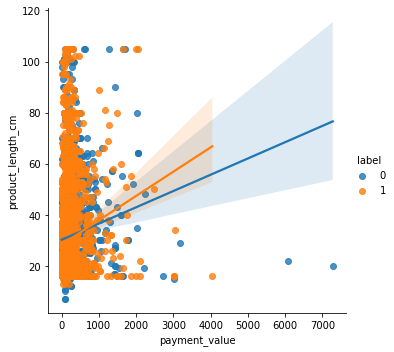


iterasi ke- 75
kombinasi pasangan i : payment_value dan kombinasi pasangan j : product_height_cm


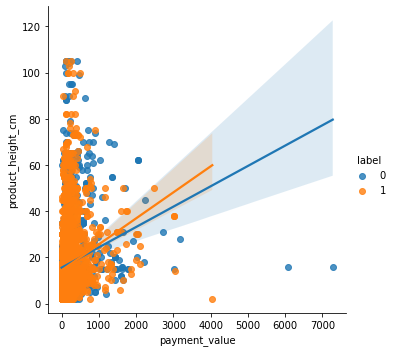


iterasi ke- 76
kombinasi pasangan i : payment_value dan kombinasi pasangan j : product_width_cm


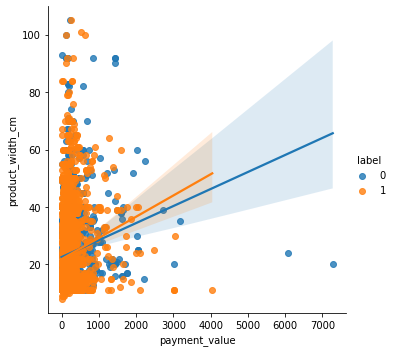


iterasi ke- 77
kombinasi pasangan i : payment_value dan kombinasi pasangan j : seller_zip_code_prefix


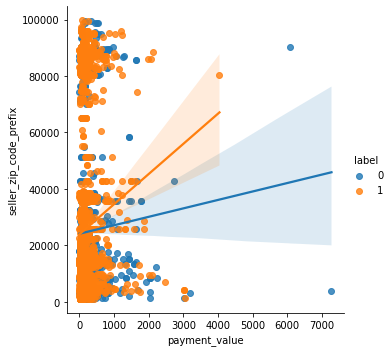


iterasi ke- 78
kombinasi pasangan i : product_description_lenght dan kombinasi pasangan j : product_name_lenght


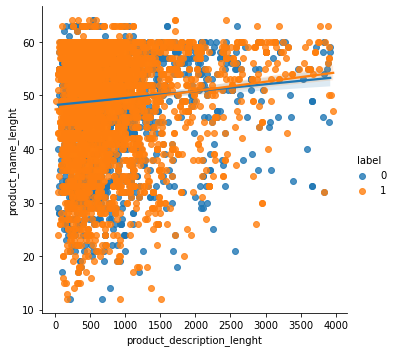


iterasi ke- 79
kombinasi pasangan i : product_name_lenght dan kombinasi pasangan j : product_photos_qty


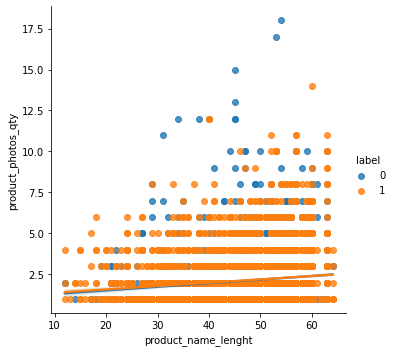


iterasi ke- 80
kombinasi pasangan i : product_name_lenght dan kombinasi pasangan j : product_weight_g


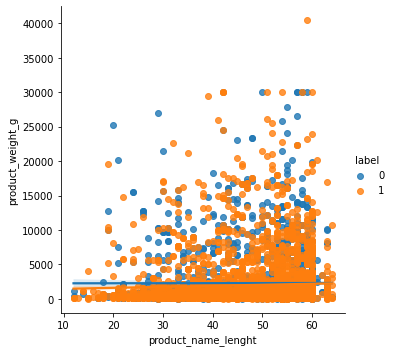


iterasi ke- 81
kombinasi pasangan i : product_length_cm dan kombinasi pasangan j : product_name_lenght


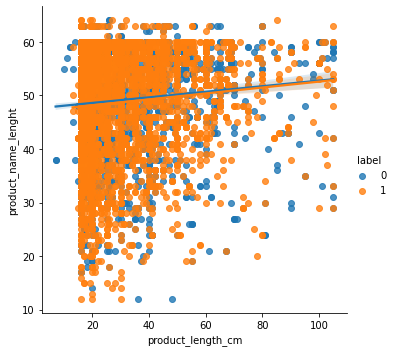


iterasi ke- 82
kombinasi pasangan i : product_height_cm dan kombinasi pasangan j : product_name_lenght


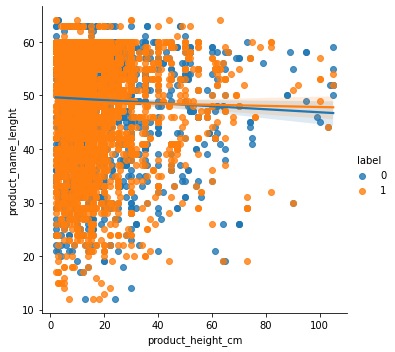


iterasi ke- 83
kombinasi pasangan i : product_name_lenght dan kombinasi pasangan j : product_width_cm


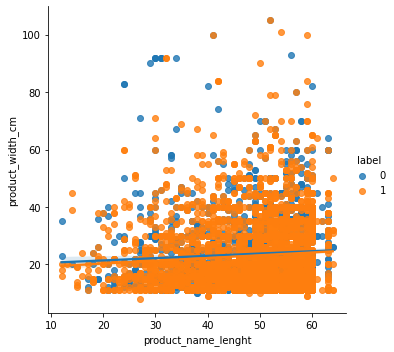


iterasi ke- 84
kombinasi pasangan i : product_name_lenght dan kombinasi pasangan j : seller_zip_code_prefix


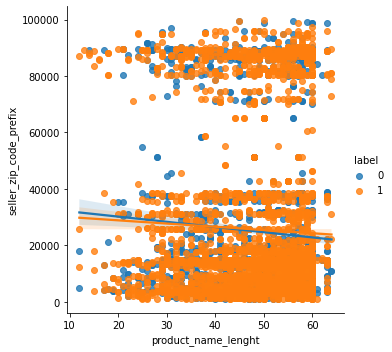


iterasi ke- 85
kombinasi pasangan i : product_description_lenght dan kombinasi pasangan j : product_photos_qty


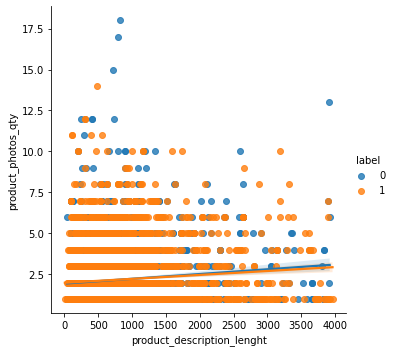


iterasi ke- 86
kombinasi pasangan i : product_description_lenght dan kombinasi pasangan j : product_weight_g


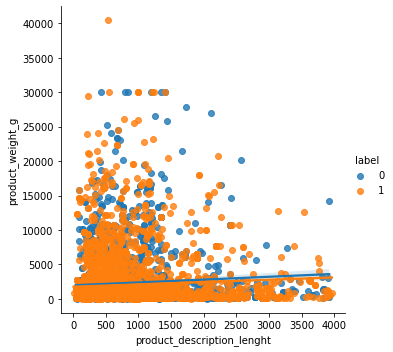


iterasi ke- 87
kombinasi pasangan i : product_description_lenght dan kombinasi pasangan j : product_length_cm


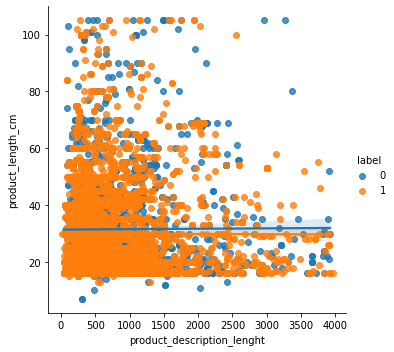


iterasi ke- 88
kombinasi pasangan i : product_description_lenght dan kombinasi pasangan j : product_height_cm


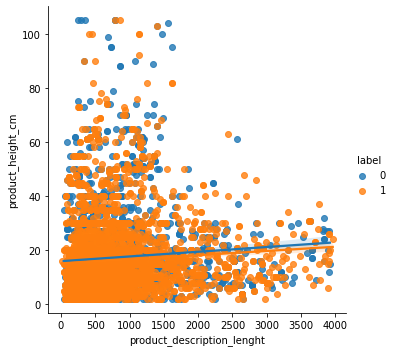


iterasi ke- 89
kombinasi pasangan i : product_description_lenght dan kombinasi pasangan j : product_width_cm


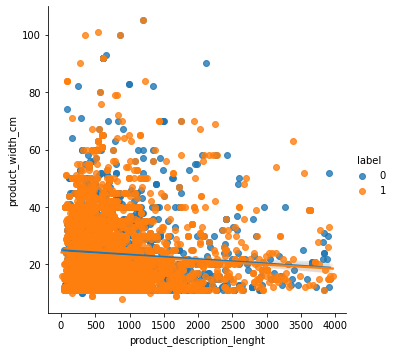


iterasi ke- 90
kombinasi pasangan i : product_description_lenght dan kombinasi pasangan j : seller_zip_code_prefix


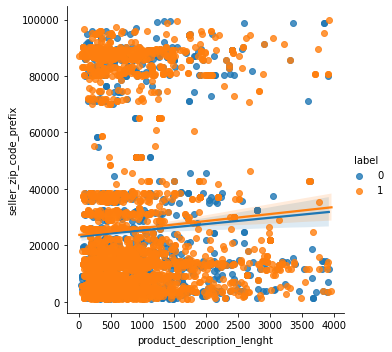


iterasi ke- 91
kombinasi pasangan i : product_photos_qty dan kombinasi pasangan j : product_weight_g


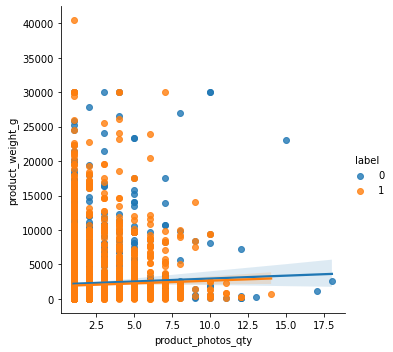


iterasi ke- 92
kombinasi pasangan i : product_length_cm dan kombinasi pasangan j : product_photos_qty


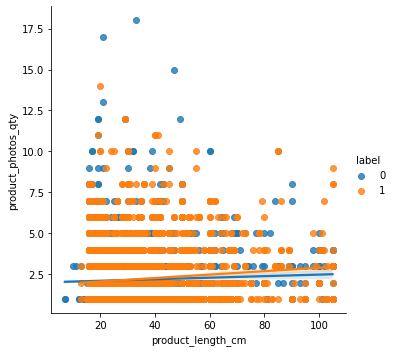


iterasi ke- 93
kombinasi pasangan i : product_height_cm dan kombinasi pasangan j : product_photos_qty


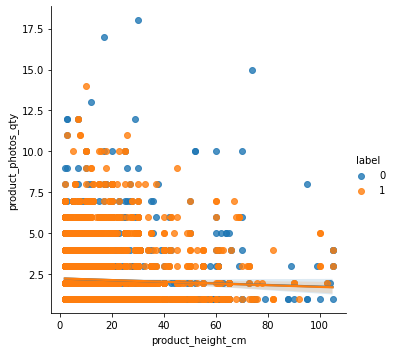


iterasi ke- 94
kombinasi pasangan i : product_photos_qty dan kombinasi pasangan j : product_width_cm


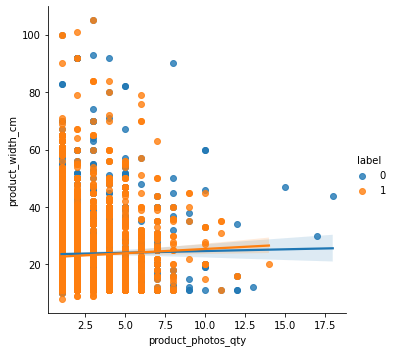


iterasi ke- 95
kombinasi pasangan i : product_photos_qty dan kombinasi pasangan j : seller_zip_code_prefix


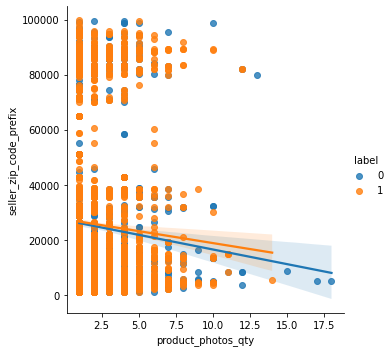


iterasi ke- 96
kombinasi pasangan i : product_length_cm dan kombinasi pasangan j : product_weight_g


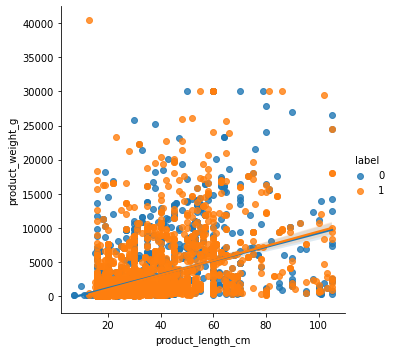


iterasi ke- 97
kombinasi pasangan i : product_height_cm dan kombinasi pasangan j : product_weight_g


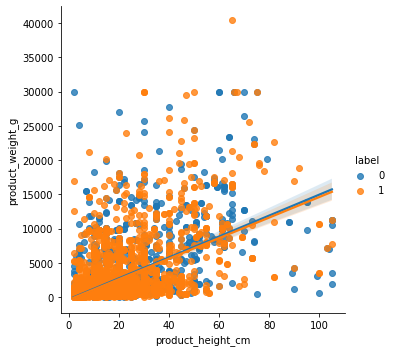


iterasi ke- 98
kombinasi pasangan i : product_weight_g dan kombinasi pasangan j : product_width_cm


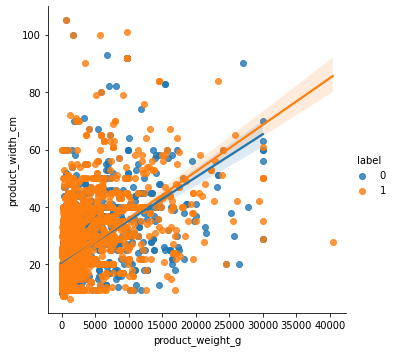


iterasi ke- 99
kombinasi pasangan i : product_weight_g dan kombinasi pasangan j : seller_zip_code_prefix


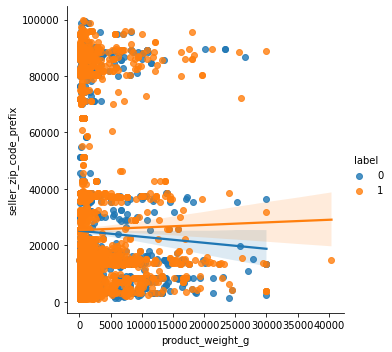


iterasi ke- 100
kombinasi pasangan i : product_height_cm dan kombinasi pasangan j : product_length_cm


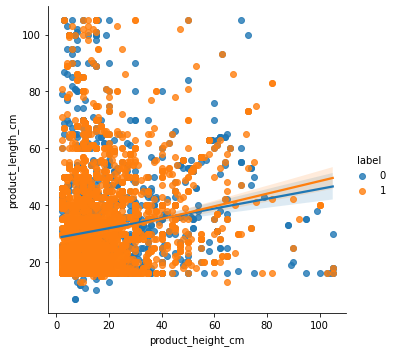


iterasi ke- 101
kombinasi pasangan i : product_length_cm dan kombinasi pasangan j : product_width_cm


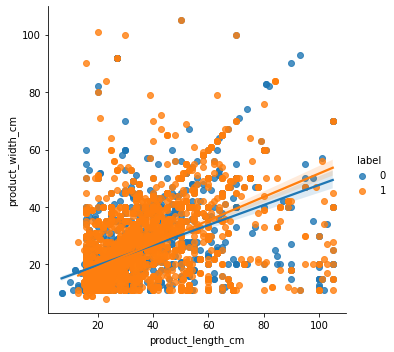


iterasi ke- 102
kombinasi pasangan i : product_length_cm dan kombinasi pasangan j : seller_zip_code_prefix


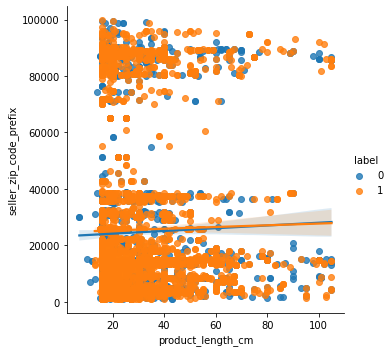


iterasi ke- 103
kombinasi pasangan i : product_height_cm dan kombinasi pasangan j : product_width_cm


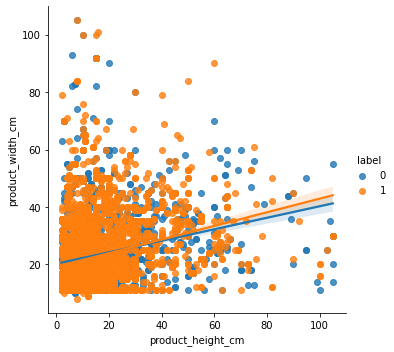


iterasi ke- 104
kombinasi pasangan i : product_height_cm dan kombinasi pasangan j : seller_zip_code_prefix


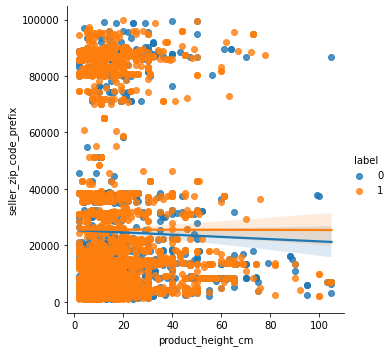


iterasi ke- 105
kombinasi pasangan i : product_width_cm dan kombinasi pasangan j : seller_zip_code_prefix


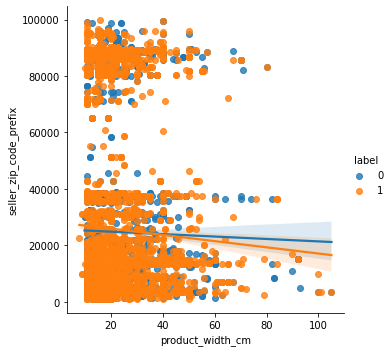

In [252]:
# Melakukan EDA Multivariat pada setiap pasangan kolom kontinu dataset 

# Membuat Loop
iter = 1
for i,j in list_pasangan:
  print('iterasi ke-',iter)
  print('kombinasi pasangan i :',i,'dan','kombinasi pasangan j :',j)
  sns.lmplot(data=df, x=i, y=j, hue='label')
  plt.show()
  
  iter+=1
  print()

EDA multivariat untuk pasangan kolom numerik dengan kolom 'label' menggunakan boxplot dan pointplot, 

kemudian dilakukan t-test (alpha = 5%) dengan hipotesis berikut:

H(0): mean variabel numerik kelompok label 1 = mean variabel numerik kelompok label 0

H(1): mean variabel numerik kelompok label 1 ≠ mean variabel numerik kelompok label 0



iterasi ke- 1
Hubungan label dengan kolom customer_zip_code_prefix


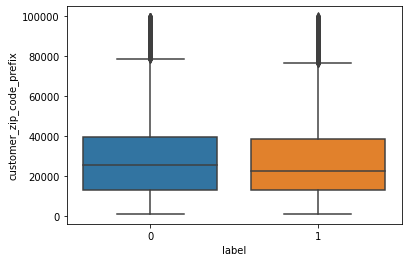

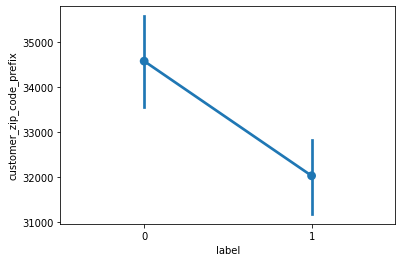

Nilai t-test : -3.81160638789736
Nilai pvalue t-test : 0.00013928379280561266
Dikarenakan nilai pvalue ttest < 0.05 maka terima H0
Kesimpulan : mean variabel numerik kelompok label 1 = mean variabel numerik kelompok label 0


iterasi ke- 2
Hubungan label dengan kolom order_item_id


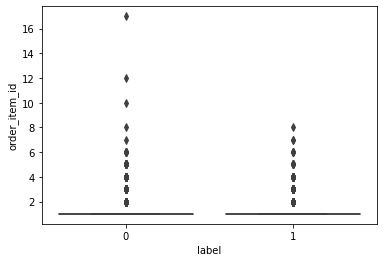

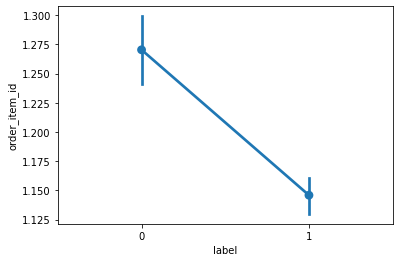

Nilai t-test : -7.736296434230382
Nilai pvalue t-test : 1.1715309158910518e-14
Dikarenakan nilai pvalue ttest < 0.05 maka terima H0
Kesimpulan : mean variabel numerik kelompok label 1 = mean variabel numerik kelompok label 0


iterasi ke- 3
Hubungan label dengan kolom price


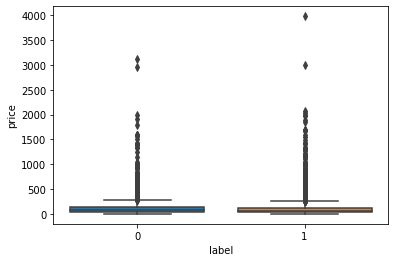

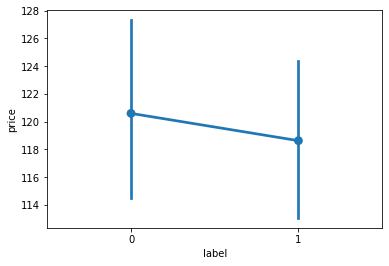

Nilai t-test : -0.4408445474272067
Nilai pvalue t-test : 0.6593395306051555
Dikarenakan nilai pvalue ttest > 0.05 maka tolak H0
Kesimpulan : mean variabel numerik kelompok label 1 ≠ mean variabel numerik kelompok label 0


iterasi ke- 4
Hubungan label dengan kolom freight_value


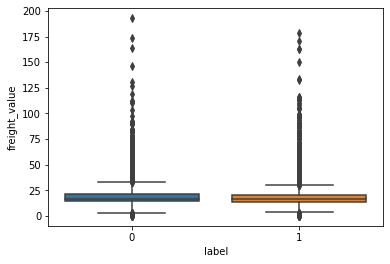

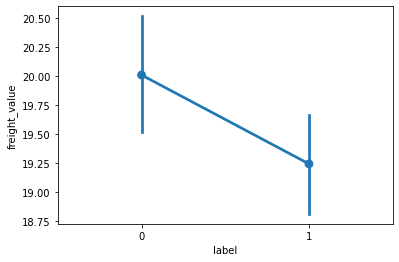

Nilai t-test : -2.26749766984526
Nilai pvalue t-test : 0.02339103295402878
Dikarenakan nilai pvalue ttest < 0.05 maka terima H0
Kesimpulan : mean variabel numerik kelompok label 1 = mean variabel numerik kelompok label 0


iterasi ke- 5
Hubungan label dengan kolom payment_sequential


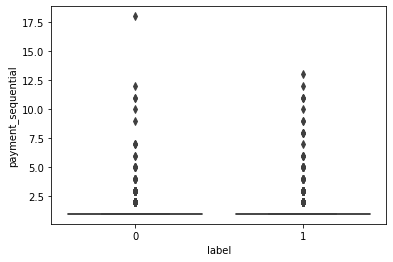

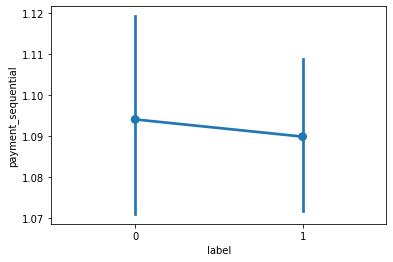

Nilai t-test : -0.26713150120809603
Nilai pvalue t-test : 0.7893760006579132
Dikarenakan nilai pvalue ttest > 0.05 maka tolak H0
Kesimpulan : mean variabel numerik kelompok label 1 ≠ mean variabel numerik kelompok label 0


iterasi ke- 6
Hubungan label dengan kolom payment_installments


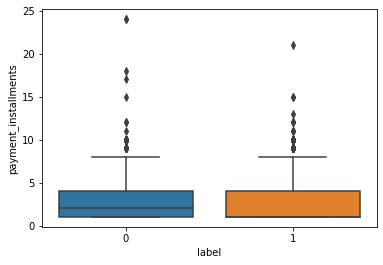

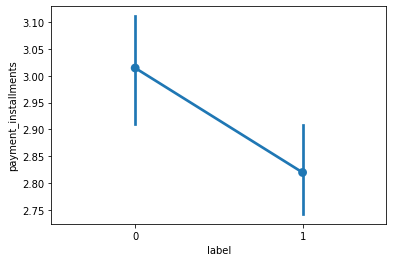

Nilai t-test : -2.9031812737310587
Nilai pvalue t-test : 0.003705786787333526
Dikarenakan nilai pvalue ttest < 0.05 maka terima H0
Kesimpulan : mean variabel numerik kelompok label 1 = mean variabel numerik kelompok label 0


iterasi ke- 7
Hubungan label dengan kolom payment_value


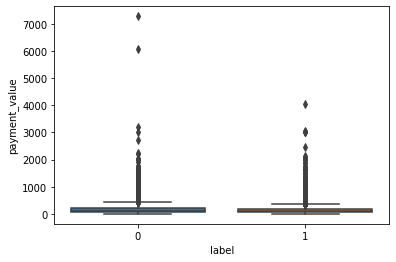

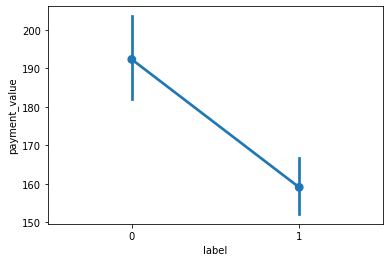

Nilai t-test : -5.243991026448904
Nilai pvalue t-test : 1.6187119648129895e-07
Dikarenakan nilai pvalue ttest < 0.05 maka terima H0
Kesimpulan : mean variabel numerik kelompok label 1 = mean variabel numerik kelompok label 0


iterasi ke- 8
Hubungan label dengan kolom product_name_lenght


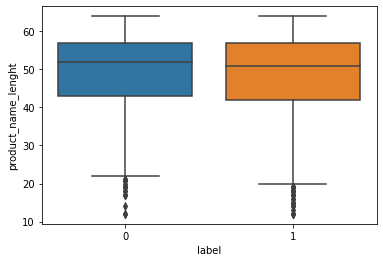

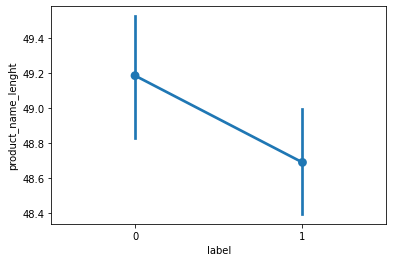

Nilai t-test : -2.030652580108291
Nilai pvalue t-test : 0.04232956226076688
Dikarenakan nilai pvalue ttest < 0.05 maka terima H0
Kesimpulan : mean variabel numerik kelompok label 1 = mean variabel numerik kelompok label 0


iterasi ke- 9
Hubungan label dengan kolom product_description_lenght


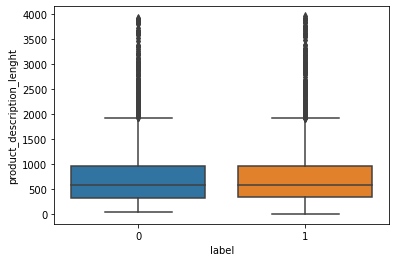

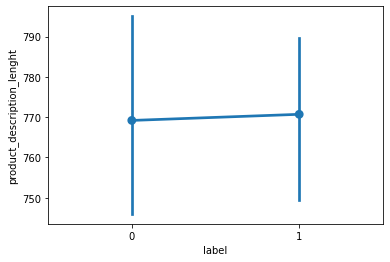

Nilai t-test : 0.09592491378423855
Nilai pvalue t-test : 0.9235830690735646
Dikarenakan nilai pvalue ttest > 0.05 maka tolak H0
Kesimpulan : mean variabel numerik kelompok label 1 ≠ mean variabel numerik kelompok label 0


iterasi ke- 10
Hubungan label dengan kolom product_photos_qty


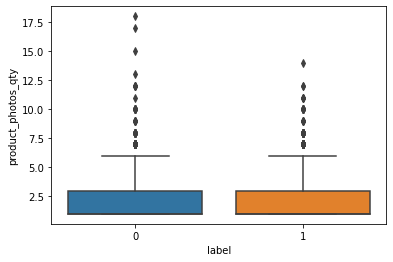

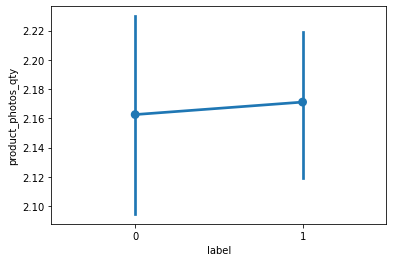

Nilai t-test : 0.20054644168109978
Nilai pvalue t-test : 0.8410593120340741
Dikarenakan nilai pvalue ttest > 0.05 maka tolak H0
Kesimpulan : mean variabel numerik kelompok label 1 ≠ mean variabel numerik kelompok label 0


iterasi ke- 11
Hubungan label dengan kolom product_weight_g


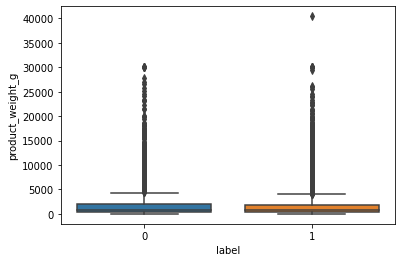

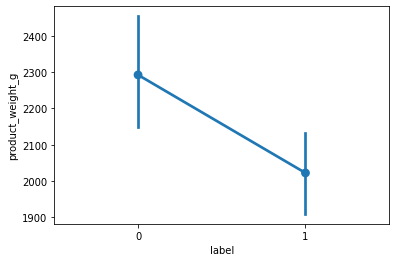

Nilai t-test : -2.9425366323340296
Nilai pvalue t-test : 0.0032663286389068417
Dikarenakan nilai pvalue ttest < 0.05 maka terima H0
Kesimpulan : mean variabel numerik kelompok label 1 = mean variabel numerik kelompok label 0


iterasi ke- 12
Hubungan label dengan kolom product_length_cm


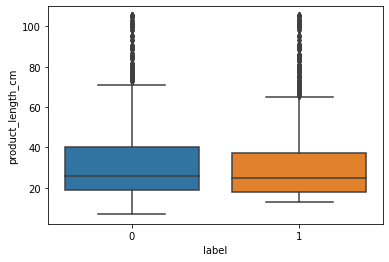

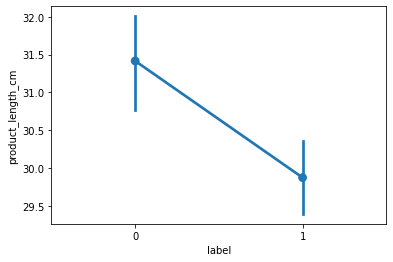

Nilai t-test : -3.8202927528449915
Nilai pvalue t-test : 0.00013447862641753985
Dikarenakan nilai pvalue ttest < 0.05 maka terima H0
Kesimpulan : mean variabel numerik kelompok label 1 = mean variabel numerik kelompok label 0


iterasi ke- 13
Hubungan label dengan kolom product_height_cm


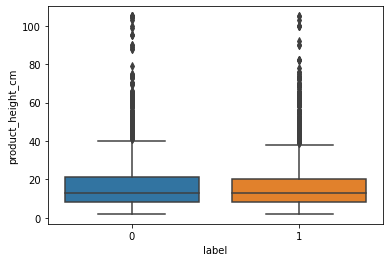

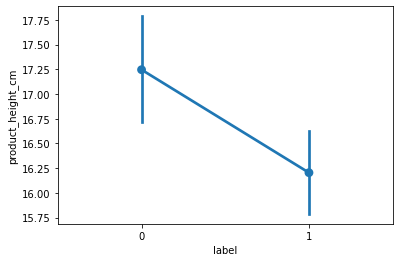

Nilai t-test : -3.113906117310348
Nilai pvalue t-test : 0.0018539400484800322
Dikarenakan nilai pvalue ttest < 0.05 maka terima H0
Kesimpulan : mean variabel numerik kelompok label 1 = mean variabel numerik kelompok label 0


iterasi ke- 14
Hubungan label dengan kolom product_width_cm


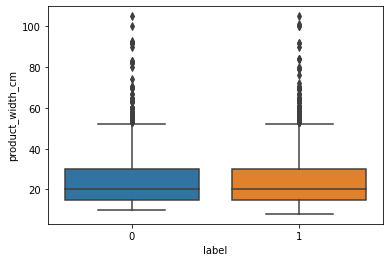

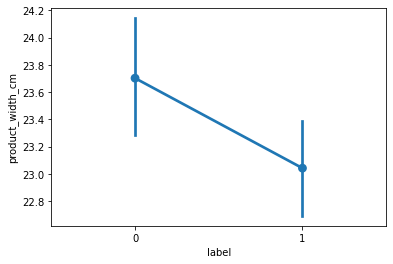

Nilai t-test : -2.2523806764806893
Nilai pvalue t-test : 0.024329929555050422
Dikarenakan nilai pvalue ttest < 0.05 maka terima H0
Kesimpulan : mean variabel numerik kelompok label 1 = mean variabel numerik kelompok label 0


iterasi ke- 15
Hubungan label dengan kolom seller_zip_code_prefix


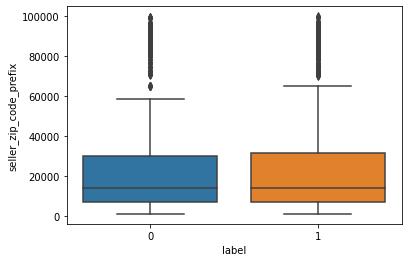

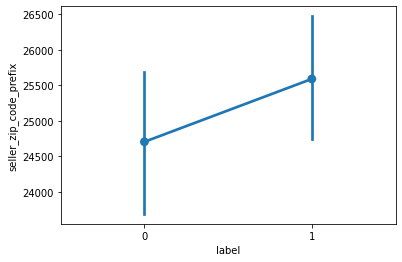

Nilai t-test : 1.2775955256438571
Nilai pvalue t-test : 0.20143561722394318
Dikarenakan nilai pvalue ttest > 0.05 maka tolak H0
Kesimpulan : mean variabel numerik kelompok label 1 ≠ mean variabel numerik kelompok label 0



In [253]:
# Melakukan EDA Multivariat pada setiap pasangan kolom kontinu dengan kolom label dataset 

# Membuat list nama kolom numerik
list_kontinu = list(df_num.columns)
list_kontinu.remove('label')

# Membuat loop
iter=1
for i in list_kontinu:
  print()
  print('iterasi ke-',iter)
  print('Hubungan label dengan kolom',i)
  
  sns.boxplot(data=df, x='label', y=i)
  plt.show()
  print()
  sns.pointplot(data=df, x='label', y=i,kind='point')
  plt.show()

  alp = 0.05
  group1 = df[(df['label']==1)][i]
  group0 = df[(df['label']==0)][i]
  ttest_coef,ttest_pval = ttest_ind(group1,group0,nan_policy='omit', alternative='two-sided')
  print('Nilai t-test :',ttest_coef)
  print('Nilai pvalue t-test :',ttest_pval)
  if ttest_pval < 0.05 :
    print('Dikarenakan nilai pvalue ttest < 0.05 maka terima H0')
    print('Kesimpulan : mean variabel numerik kelompok label 1 = mean variabel numerik kelompok label 0')
  else : 
    print('Dikarenakan nilai pvalue ttest > 0.05 maka tolak H0')
    print('Kesimpulan : mean variabel numerik kelompok label 1 ≠ mean variabel numerik kelompok label 0')

  iter+=1
  print()

EDA multivariat untuk pasangan kolom kategorikal dan kolom 'label' dengan countplot pada 'label' sebagai hue, kemudian stacked barplot yang menunjukkan proporsi value pada kolom 'label'.

iterasi ke- 1
Hubungan label dengan kolom customer_state


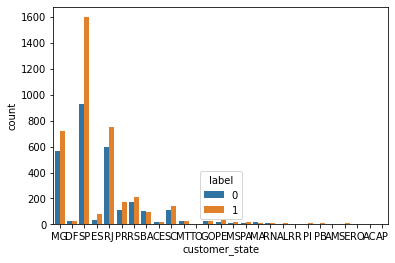

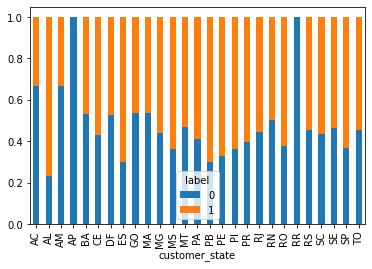


iterasi ke- 2
Hubungan label dengan kolom payment_type


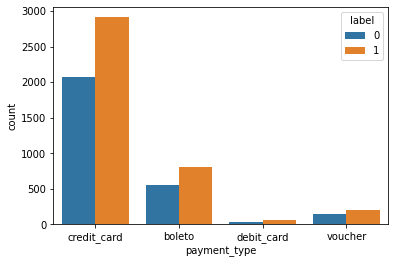

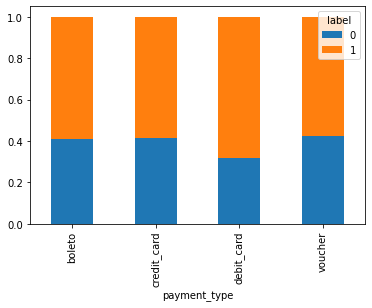


iterasi ke- 3
Hubungan label dengan kolom seller_state


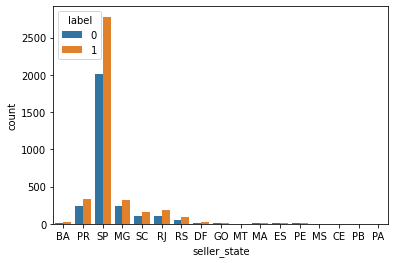

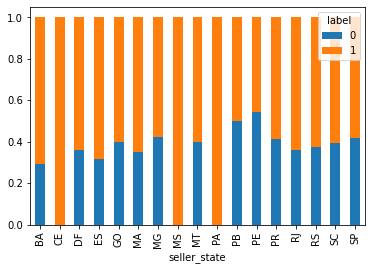


iterasi ke- 4
Hubungan label dengan kolom product_category_name_english


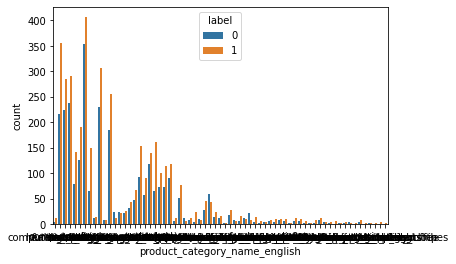

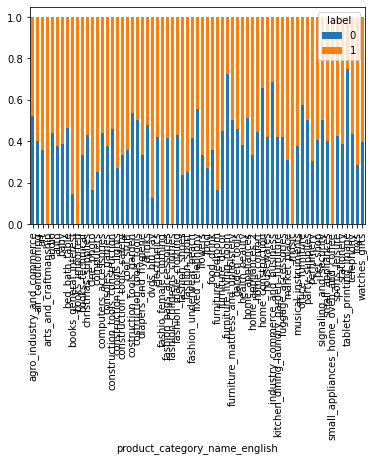

In [254]:
# Melakukan EDA Multivariat pada setiap pasangan kolom kategorikal dengan kolom label dataset 

# Membuat list nama kolom kategorikal
list_kategorikal = list(df_cat.columns)

iter = 1
# Membuat loop
for i in list_kategorikal:
  print('iterasi ke-',iter)
  print('Hubungan label dengan kolom',i)
  sns.countplot(data=df_cat, x=i, hue=df['label'])
  plt.show()
  pd.crosstab(df_cat[i], df['label'], normalize='index').plot(kind='bar', stacked=True)
  plt.show()
  iter+=1
  print()

In [255]:
# Insight

# Kisaran harga barang yang dijual berada dalam interval $2.2 - $3980 dengan rata-rata sebesar $119.43 (belum termasuk biaya pengiriman kapal)
# Rata-rata transaksi customer menghabiskan total sekitar $172.83 dengan rata-rata biaya pengiriman sebesar $19.55
# Pembayaran transaksi paling banyak digunakan adalah kartu kredit dengan jenis barang paling banyak dibeli adalah bed_bath_table 
# Customer yang berdomisili di negara AP dan RR belum pernah memberikan review bintang 5 ketika membeli barang
# Seller yang berdomisili di negara CE dan PA belum pernah mendapatkan review dibawah bintang 5

# **Data Preparation**

## Data Cleaning and Handling Missing Value

In [256]:
# Mengecek kembali informasi dan missing value data

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6814 entries, 0 to 6813
Data columns (total 26 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   customer_zip_code_prefix       6814 non-null   int64         
 1   customer_state                 6814 non-null   object        
 2   order_purchase_timestamp       6814 non-null   datetime64[ns]
 3   order_approved_at              6812 non-null   datetime64[ns]
 4   order_delivered_carrier_date   6814 non-null   datetime64[ns]
 5   order_delivered_customer_date  6814 non-null   datetime64[ns]
 6   order_estimated_delivery_date  6814 non-null   datetime64[ns]
 7   order_item_id                  6814 non-null   int64         
 8   shipping_limit_date            6814 non-null   datetime64[ns]
 9   price                          6814 non-null   float64       
 10  freight_value                  6814 non-null   float64       
 11  payment_sequentia

In [257]:
df.isna().sum()/len(df)

customer_zip_code_prefix         0.000000
customer_state                   0.000000
order_purchase_timestamp         0.000000
order_approved_at                0.000294
order_delivered_carrier_date     0.000000
order_delivered_customer_date    0.000000
order_estimated_delivery_date    0.000000
order_item_id                    0.000000
shipping_limit_date              0.000000
price                            0.000000
freight_value                    0.000000
payment_sequential               0.000000
payment_type                     0.000000
payment_installments             0.000000
payment_value                    0.000000
product_name_lenght              0.013942
product_description_lenght       0.013942
product_photos_qty               0.013942
product_weight_g                 0.000000
product_length_cm                0.000000
product_height_cm                0.000000
product_width_cm                 0.000000
seller_zip_code_prefix           0.000000
seller_state                     0

Metode penanganan missing value :

1. missing value ≤10% gunakan simple imputer yaitu median untuk kolom numerik dan modus untuk kolom kategorik <p>
2. missing value >10% dan ≤30%  gunakan KNNImputer atau <p>
3. missing value >30% drop kolom

Karena keseluruhan nilai missing value tidak melebihi 10%, maka tindakan yang dilakukan hanyalah menggunakan simple imputer. Tahapannya adalah dengan memisahkan data kontinu dan kategorikal dahulu, kemudian dilakukan onehotencoder dan diimpute.

In [258]:
df_cat.columns

Index(['customer_state', 'payment_type', 'seller_state',
       'product_category_name_english'],
      dtype='object')

In [259]:
# Mengubah feature kategorikal menjadi numerik dengan ordinal encoder 
oe = OrdinalEncoder(handle_unknown ='use_encoded_value',unknown_value=np.nan)
df_cat_oe = pd.DataFrame(oe.fit_transform(df_cat),columns = oe.feature_names_in_)
df_cat_oe

,customer_state,payment_type,seller_state,product_category_name_english
0,10.0,1.0,0.0,13.0
1,6.0,1.0,12.0,42.0
2,25.0,1.0,12.0,14.0
3,25.0,1.0,16.0,38.0
4,7.0,1.0,12.0,14.0
...,...,...,...,...
6809,25.0,1.0,16.0,6.0
6810,18.0,1.0,16.0,54.0
6811,10.0,1.0,16.0,64.0
6812,25.0,3.0,6.0,50.0


In [260]:
# Menyatukan kedua jenis tipe data emnajdi satu dataset

df_concat_imp = pd.concat([df_cat_oe, df_num], axis = 1)
df_concat_imp

,customer_state,payment_type,seller_state,product_category_name_english,customer_zip_code_prefix,order_item_id,price,freight_value,payment_sequential,payment_installments,payment_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_zip_code_prefix,label
0,10.0,1.0,0.0,13.0,36570,1,1437.00,42.51,1,8,1479.51,55.0,3611.0,4.0,2750,16,31,39,42738,0
1,6.0,1.0,12.0,42.0,72225,1,349.90,22.85,1,7,372.75,51.0,625.0,1.0,900,25,12,38,80310,0
2,25.0,1.0,12.0,14.0,13160,1,69.90,12.62,1,3,82.52,51.0,518.0,1.0,214,18,14,13,87047,0
3,25.0,1.0,16.0,38.0,15600,1,250.00,35.02,1,6,285.02,51.0,756.0,1.0,12250,45,35,45,3204,0
4,7.0,1.0,12.0,14.0,29360,1,75.90,25.81,1,3,101.71,45.0,267.0,1.0,167,16,12,13,87083,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6809,25.0,1.0,16.0,6.0,13806,1,17.80,8.64,1,1,52.88,30.0,245.0,3.0,350,60,2,20,13465,1
6810,18.0,1.0,16.0,54.0,22775,1,194.99,59.91,1,1,2039.20,55.0,1180.0,1.0,16167,64,62,25,8577,0
6811,10.0,1.0,16.0,64.0,30140,2,19.90,25.00,1,10,102.67,30.0,305.0,1.0,100,19,3,11,8250,0
6812,25.0,3.0,6.0,50.0,8615,1,102.90,17.97,2,1,100.00,45.0,702.0,1.0,1400,33,10,49,37564,1


In [261]:
# Memasukan nilai null kedalam dataset dengan kondisi yang telah didefinisikan
# Impute fitur : order_approved_at, product_name_lenght, product_description_lenght, product_photos_qty,product_category_name_english

# impute mode : product_category_name_english
# impute median : product_name_lenght, product_description_lenght, product_photos_qty
# untuk order approve at karena berbentuk datetime dibiarkan nanti 

# Menggunakan imputer mode
df_modus = df_concat_imp[['product_category_name_english']]
Mod_imp = SimpleImputer(strategy='most_frequent')
Mod_imp_fit = pd.DataFrame(Mod_imp.fit_transform(df_modus), columns = Mod_imp.feature_names_in_)
df_concat_imp[['product_category_name_english']] = Mod_imp_fit

# Menggunakan imputer median
df_mean = df_concat_imp[['product_name_lenght', 'product_description_lenght','product_photos_qty']]
Mean_imp = SimpleImputer(strategy='median')
Mean_imp_fit = pd.DataFrame(Mean_imp.fit_transform(df_mean), columns = Mean_imp.feature_names_in_)
df_concat_imp[['product_name_lenght', 'product_description_lenght','product_photos_qty']] = Mean_imp_fit


In [262]:
# Melakukan inverse numerik terhadap data kategorikal

df_concat_imp[oe.feature_names_in_] = oe.inverse_transform(df_concat_imp[oe.feature_names_in_])
df_concat_imp

,customer_state,payment_type,seller_state,product_category_name_english,customer_zip_code_prefix,order_item_id,price,freight_value,payment_sequential,payment_installments,payment_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_zip_code_prefix,label
0,MG,credit_card,BA,computers,36570,1,1437.00,42.51,1,8,1479.51,55.0,3611.0,4.0,2750,16,31,39,42738,0
1,DF,credit_card,PR,health_beauty,72225,1,349.90,22.85,1,7,372.75,51.0,625.0,1.0,900,25,12,38,80310,0
2,SP,credit_card,PR,computers_accessories,13160,1,69.90,12.62,1,3,82.52,51.0,518.0,1.0,214,18,14,13,87047,0
3,SP,credit_card,SP,furniture_decor,15600,1,250.00,35.02,1,6,285.02,51.0,756.0,1.0,12250,45,35,45,3204,0
4,ES,credit_card,PR,computers_accessories,29360,1,75.90,25.81,1,3,101.71,45.0,267.0,1.0,167,16,12,13,87083,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6809,SP,credit_card,SP,baby,13806,1,17.80,8.64,1,1,52.88,30.0,245.0,3.0,350,60,2,20,13465,1
6810,RJ,credit_card,SP,office_furniture,22775,1,194.99,59.91,1,1,2039.20,55.0,1180.0,1.0,16167,64,62,25,8577,0
6811,MG,credit_card,SP,telephony,30140,2,19.90,25.00,1,10,102.67,30.0,305.0,1.0,100,19,3,11,8250,0
6812,SP,voucher,MG,luggage_accessories,8615,1,102.90,17.97,2,1,100.00,45.0,702.0,1.0,1400,33,10,49,37564,1


# **Feature Engineering**

## 1. Feature Synthesis

In [263]:
# Berdasarkan fitur waktu/datetime, maka dapat diperoleh 5 fitur baru sebagai berikut :

df['system_approve_time'] = (df.order_approved_at - df.order_purchase_timestamp) / pd.Timedelta(days=1)
df['seller_response_time'] = (df.order_delivered_carrier_date - df.order_approved_at) / pd.Timedelta(days=1)
df['delivery_time'] = (df.order_delivered_customer_date - df.order_delivered_carrier_date) / pd.Timedelta(days=1)
df['delivery_on_time'] = df.apply(lambda x : 1 if x['order_estimated_delivery_date'] > x['order_delivered_customer_date'] else 0,axis=1)
df['shipping_date_on_time'] = df.apply(lambda x : 1 if x['shipping_limit_date'] > x['order_delivered_carrier_date'] else 0,axis=1)

In [264]:
'''
system_approve_time === (float) waktu sistem konfirmasi pesanan dalam satuan hari
seller_response_time === (float) waktu sseller mengirimkan barang ke kapal dalam satuan hari
delivery_time === (float) waktu pengiriman barang hingga ke konsumen dalam satuan hari
delivery_on_time === (int)  ketepatan waktu pengiriman atau tidak (0,1) [0=telat, 1=tepat]
missed_shipping_date === (int) keterlambatan pengiriman barang ke kapal atau tidak (0,1) [0=telat, 1=tepat]
'''

'\nsystem_approve_time === (float) waktu sistem konfirmasi pesanan dalam satuan hari\nseller_response_time === (float) waktu sseller mengirimkan barang ke kapal dalam satuan hari\ndelivery_time === (float) waktu pengiriman barang hingga ke konsumen dalam satuan hari\ndelivery_on_time === (int)  ketepatan waktu pengiriman atau tidak (0,1) [0=telat, 1=tepat]\nmissed_shipping_date === (int) keterlambatan pengiriman barang ke kapal atau tidak (0,1) [0=telat, 1=tepat]\n'

In [265]:
# Terdapat missing value pada fitur order_approved_at, sehingga fitur yang memiliki rumus fitur tersebut memiliki missing value
# Melakukan impute pada missing value : system_approve_time , seller_response_time

df_mean1 = df[['system_approve_time', 'seller_response_time']]
Mean_imp1 = SimpleImputer(strategy='median')
Mean_imp_fit = pd.DataFrame(Mean_imp1.fit_transform(df_mean1), columns = Mean_imp1.feature_names_in_)
df[['system_approve_time', 'seller_response_time']] = Mean_imp_fit

## 2. Feature Synthesis EDA

In [266]:
# Mengambil fitur yang telah dibuat dalam dataframe baru

df_syn = df.iloc[:,25:31]
df_syn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6814 entries, 0 to 6813
Data columns (total 6 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   label                  6814 non-null   int64  
 1   system_approve_time    6814 non-null   float64
 2   seller_response_time   6814 non-null   float64
 3   delivery_time          6814 non-null   float64
 4   delivery_on_time       6814 non-null   int64  
 5   shipping_date_on_time  6814 non-null   int64  
dtypes: float64(3), int64(3)
memory usage: 319.5 KB


EDA univariat setiap kolom numerik dengan bentuk : <p>
    a. histogram dan boxplot untuk tiap kolom<p>
    b. metrik statistik dasar untuk tiap kolom: mean, std, min, q1, q2, q3, iqr, max<p>
    c. nilai upper whisker (nilai maximum tanpa outlier) dan lower whisker (nilai minimum tanpa outlier) dari boxplot tiap kolom<p>
    d. medeteksi outlier (<q1-1.5*iqr | >q3+1.5*iqr); menghitung count dan list dari outlier tiap kolom<p>
    e. menghitung metrik skew dan lakukan skewtest untuk tiap kolom<p>


Iterasi ke- 1
Kolom :  system_approve_time


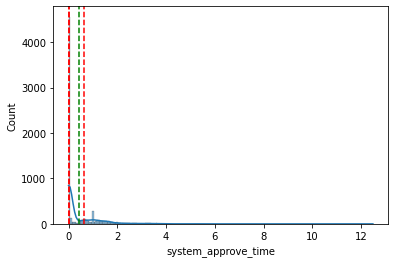

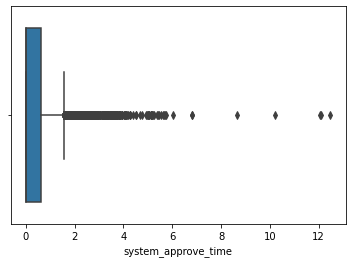


Skew Value :  3.8111719916868205
Skew Test Value :  SkewtestResult(statistic=61.90073772817371, pvalue=0.0)
count    6814.000000
mean        0.426034
std         0.841594
min         0.000000
25%         0.009100
50%         0.014282
75%         0.626143
max        12.479907
Name: system_approve_time, dtype: float64

nilai max di luar outlier = 1.5516319444444444
nilai min di luar outlier = 0.0
jumlah outlier:569
outlier:
[3.096226851851852, 2.0351157407407405, 2.408310185185185, 3.3125115740740743, 1.620648148148148, 1.7226967592592592, 3.602685185185185, 5.114629629629629, 2.3535069444444443, 3.640324074074074, 1.7383796296296297, 3.3914930555555554, 1.6525694444444445, 2.0069328703703704, 1.7478819444444444, 2.0047569444444444, 4.282094907407408, 1.755763888888889, 2.419039351851852, 3.0268402777777776, 1.6342824074074074, 2.392511574074074, 2.0323379629629628, 3.299675925925926, 1.6846875, 2.411226851851852, 2.250601851851852, 1.7189814814814814, 2.530173611111111, 3.7220486111111

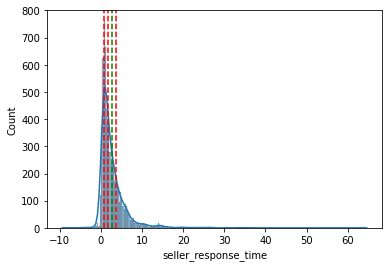

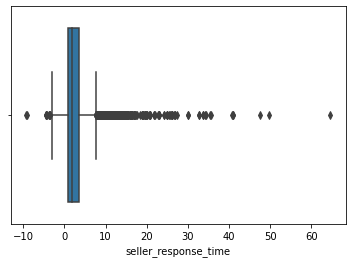


Skew Value :  4.656650460577611
Skew Test Value :  SkewtestResult(statistic=67.32698124166676, pvalue=0.0)
count    6814.000000
mean        2.847325
std         3.592405
min        -9.341262
25%         0.881091
50%         1.815880
75%         3.606172
max        64.570208
Name: seller_response_time, dtype: float64

nilai max di luar outlier = 7.693113425925926
nilai min di luar outlier = -2.9961342592592595
jumlah outlier:423
outlier:
[9.705347222222223, 10.983981481481482, 9.287696759259259, 9.535474537037038, 22.90076388888889, 16.0403125, 13.67258101851852, 10.21005787037037, 8.57, 18.99017361111111, 27.352453703703702, 10.62835648148148, 10.544224537037037, 10.926851851851852, 26.552905092592592, 16.558645833333333, 8.961458333333333, 7.931006944444444, 12.259803240740741, 40.88418981481482, 14.033067129629629, 12.818715277777779, 13.29644675925926, 7.819583333333333, 20.867835648148148, 8.044039351851852, 10.636759259259259, 8.584861111111111, 17.163391203703704, 12.81472222222

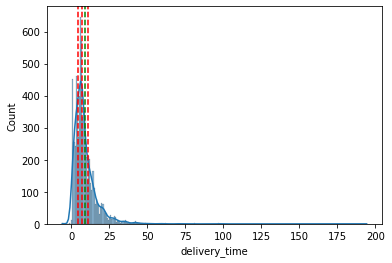

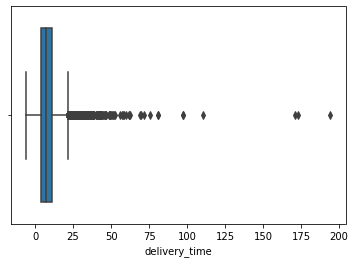


Skew Value :  5.9169716808801445
Skew Test Value :  SkewtestResult(statistic=73.85638429199608, pvalue=0.0)
count    6814.000000
mean        8.876480
std         8.481104
min        -6.009954
25%         4.108194
50%         6.984242
75%        11.082031
max       194.213009
Name: delivery_time, dtype: float64

nilai max di luar outlier = 21.46792824074074
nilai min di luar outlier = -6.009953703703704
jumlah outlier:389
outlier:
[23.031168981481482, 31.185092592592593, 29.581261574074073, 23.075590277777778, 37.91293981481481, 62.478356481481484, 22.845914351851853, 28.13741898148148, 28.14953703703704, 27.63579861111111, 25.964895833333333, 27.264155092592592, 27.321527777777778, 28.356458333333332, 25.64875, 52.854988425925924, 28.016018518518518, 44.896342592592596, 24.045324074074074, 34.05582175925926, 26.090659722222224, 25.988645833333333, 26.05849537037037, 29.034502314814816, 35.12519675925926, 23.83096064814815, 22.0934375, 36.103125, 44.05431712962963, 28.937002314814816, 

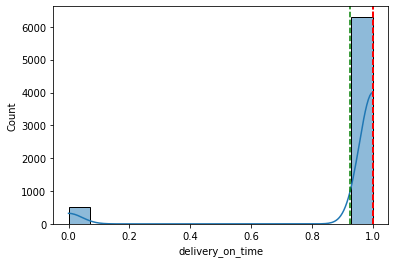

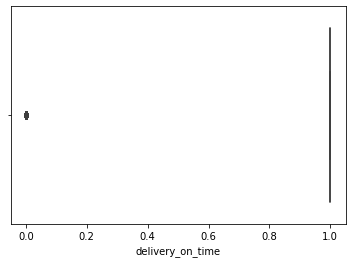


Skew Value :  -3.247555813422519
Skew Test Value :  SkewtestResult(statistic=-57.60030383971915, pvalue=0.0)
count    6814.000000
mean        0.925741
std         0.262211
min         0.000000
25%         1.000000
50%         1.000000
75%         1.000000
max         1.000000
Name: delivery_on_time, dtype: float64

nilai max di luar outlier = 1
nilai min di luar outlier = 1
jumlah outlier:506
outlier:
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

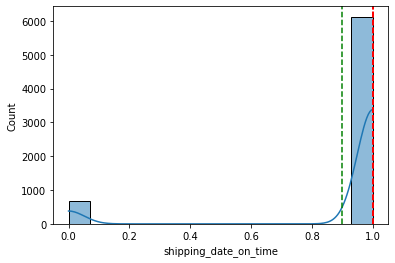

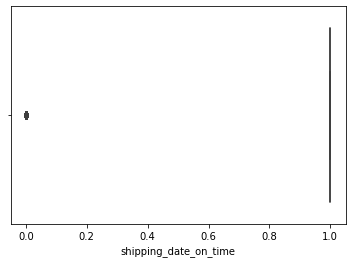


Skew Value :  -2.6461642062366986
Skew Test Value :  SkewtestResult(statistic=-52.15890239544139, pvalue=0.0)
count    6814.000000
mean        0.898885
std         0.301504
min         0.000000
25%         1.000000
50%         1.000000
75%         1.000000
max         1.000000
Name: shipping_date_on_time, dtype: float64

nilai max di luar outlier = 1
nilai min di luar outlier = 1
jumlah outlier:689
outlier:
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [267]:
# Melakukan EDA Univariat pada setiap kolom numerik dataset

# Membuat list nama kolom numerik
list_syn = list(df_syn.columns)
list_syn.remove('label')

# Membuat loop
iter = 1
for i in list_syn:
  print()
  print('Iterasi ke-',iter)
  print('Kolom : ',i)
  sns.histplot(df_syn[i],kde=True)
  plt.axvline(np.mean(df_syn[i]),c='green',linestyle='--')
  plt.axvline(np.percentile(df_syn[i],25),c='red',linestyle='--')
  plt.axvline(np.percentile(df_syn[i],50),c='red',linestyle='--')
  plt.axvline(np.percentile(df_syn[i],75),c='red',linestyle='--')
  plt.show()
  sns.boxplot(data=df_syn, x=df_syn[i])
  plt.show()

  print()
  print('Skew Value : ',skew(df_syn[i]))
  print('Skew Test Value : ',skewtest(df_syn[i]))
  print(df_syn[i].describe())
  
  print()
  Q1 = np.percentile(df_syn[i],25)
  Q2 = np.percentile(df_syn[i],50)
  Q3 = np.percentile(df_syn[i],75)
  IQR = Q3-Q1

  upper_f = Q3 + 1.5 * IQR
  lower_f = Q1 - 1.5 * IQR

  upper_w = np.max(df_syn[df_syn[i] <= upper_f][i])
  lower_w = np.min(df_syn[df_syn[i] >= lower_f][i])
  outlier = list(df_syn[(df_syn[i] < lower_w) | (df_syn[i] > upper_f)][i])

  print('nilai max di luar outlier = {}'.format(upper_w))
  print('nilai min di luar outlier = {}'.format(lower_w))
  print('jumlah outlier:{}'.format(len(outlier)))
  print('outlier:')
  print(outlier)
  iter+=1
  print()

EDA multivariat untuk tiap pasangan kolom numerik-numerik dengan lmplot antar kolom numerik dengan kolom 'label' sebagai hue

In [268]:
# Membuat list pasangan nama kolom numerikal

list_pasangan = []
for i in list_syn:
  for j in list_syn:
    list_temp = sorted([i,j])
    if list_temp not in list_pasangan and i != j :
        list_pasangan.append(list_temp)

len(list_pasangan)

10

iterasi ke- 1
kombinasi pasangan i : seller_response_time dan kombinasi pasangan j : system_approve_time


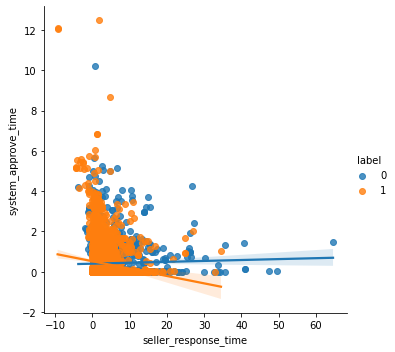


iterasi ke- 2
kombinasi pasangan i : delivery_time dan kombinasi pasangan j : system_approve_time


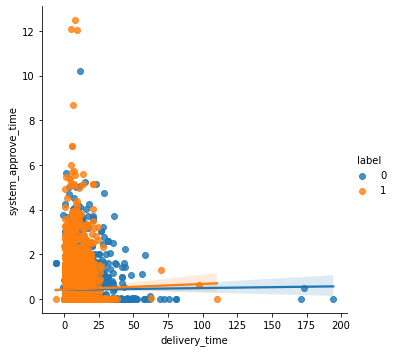


iterasi ke- 3
kombinasi pasangan i : delivery_on_time dan kombinasi pasangan j : system_approve_time


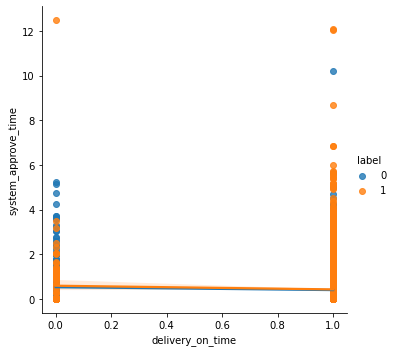


iterasi ke- 4
kombinasi pasangan i : shipping_date_on_time dan kombinasi pasangan j : system_approve_time


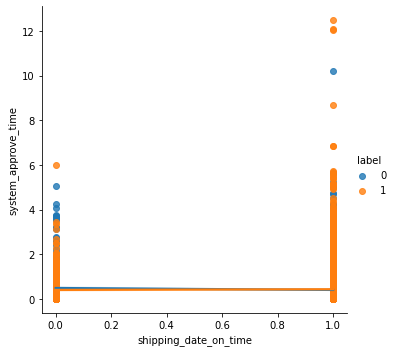


iterasi ke- 5
kombinasi pasangan i : delivery_time dan kombinasi pasangan j : seller_response_time


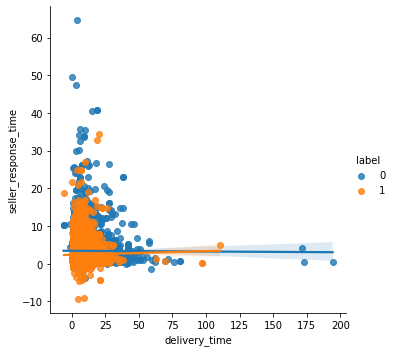


iterasi ke- 6
kombinasi pasangan i : delivery_on_time dan kombinasi pasangan j : seller_response_time


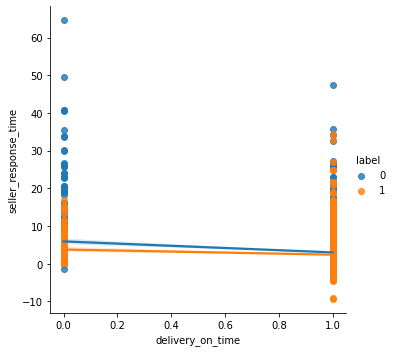


iterasi ke- 7
kombinasi pasangan i : seller_response_time dan kombinasi pasangan j : shipping_date_on_time


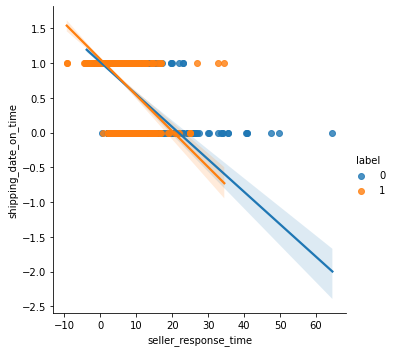


iterasi ke- 8
kombinasi pasangan i : delivery_on_time dan kombinasi pasangan j : delivery_time


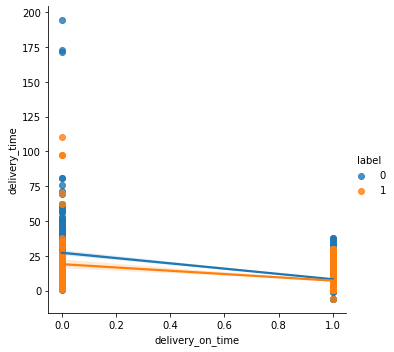


iterasi ke- 9
kombinasi pasangan i : delivery_time dan kombinasi pasangan j : shipping_date_on_time


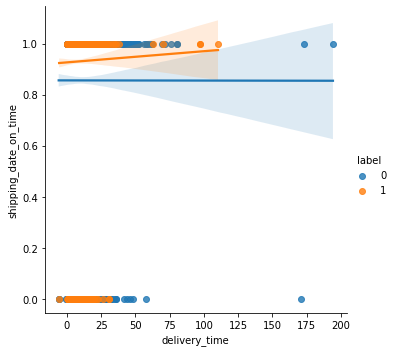


iterasi ke- 10
kombinasi pasangan i : delivery_on_time dan kombinasi pasangan j : shipping_date_on_time


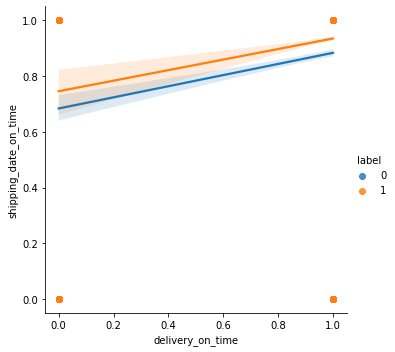

In [269]:
# Melakukan EDA Multivariat pada setiap pasangan kolom kontinu dataset 

# Membuat Loop
iter = 1
for i,j in list_pasangan:
  print('iterasi ke-',iter)
  print('kombinasi pasangan i :',i,'dan','kombinasi pasangan j :',j)
  sns.lmplot(data=df_syn, x=i, y=j, hue='label')
  plt.show()
  
  iter+=1
  print()

EDA multivariat untuk pasangan kolom numerik dengan kolom 'label' menggunakan boxplot dan pointplot, 

kemudian dilakukan t-test (alpha = 5%) dengan hipotesis berikut:

H(0): mean variabel numerik kelompok label 1 = mean variabel numerik kelompok label 0

H(1): mean variabel numerik kelompok label 1 ≠ mean variabel numerik kelompok label 0



iterasi ke- 1
Hubungan Label dengan kolom system_approve_time


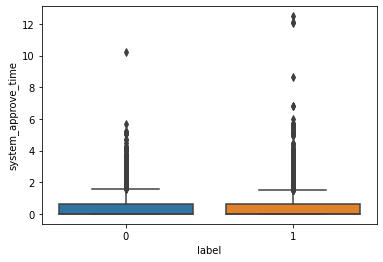

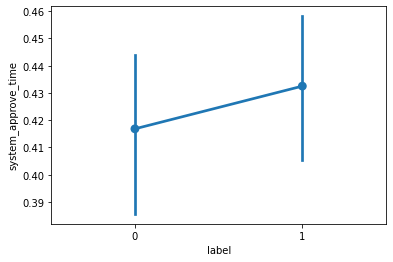

Nilai t-test : 0.7567947483164352
Nilai pvalue t-test : 0.44919901294238784
Dikarenakan nilai pvalue ttest > 0.05 maka tolak H0
Kesimpulan : mean variabel numerik kelompok label 1 ≠ mean variabel numerik kelompok label 0


iterasi ke- 2
Hubungan Label dengan kolom seller_response_time


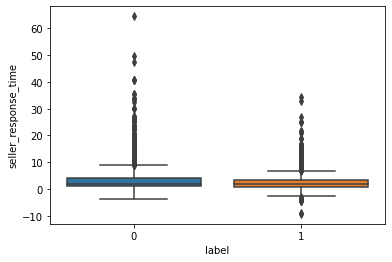

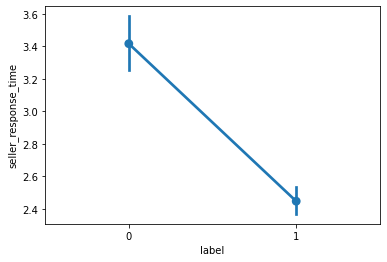

Nilai t-test : -11.076714797069869
Nilai pvalue t-test : 2.834219113665963e-28
Dikarenakan nilai pvalue ttest < 0.05 maka terima H0
Kesimpulan : mean variabel numerik kelompok label 1 = mean variabel numerik kelompok label 0


iterasi ke- 3
Hubungan Label dengan kolom delivery_time


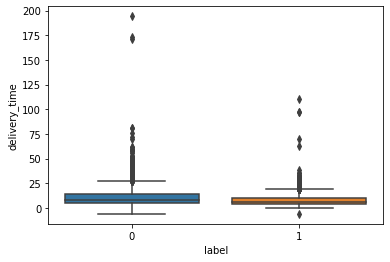

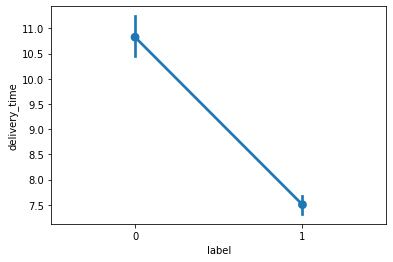

Nilai t-test : -16.22184616545585
Nilai pvalue t-test : 4.291095764188261e-58
Dikarenakan nilai pvalue ttest < 0.05 maka terima H0
Kesimpulan : mean variabel numerik kelompok label 1 = mean variabel numerik kelompok label 0


iterasi ke- 4
Hubungan Label dengan kolom delivery_on_time


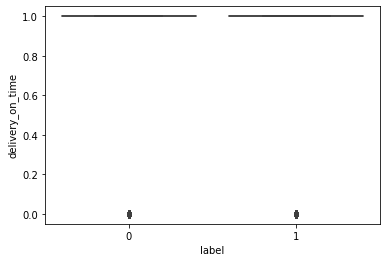

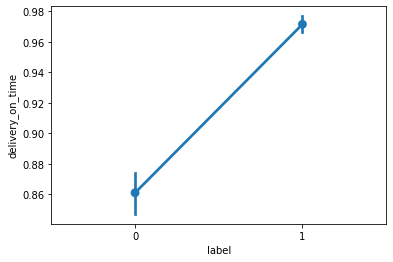

Nilai t-test : 17.524287442061173
Nilai pvalue t-test : 2.7534345646212295e-67
Dikarenakan nilai pvalue ttest < 0.05 maka terima H0
Kesimpulan : mean variabel numerik kelompok label 1 = mean variabel numerik kelompok label 0


iterasi ke- 5
Hubungan Label dengan kolom shipping_date_on_time


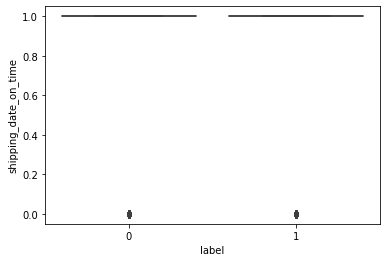

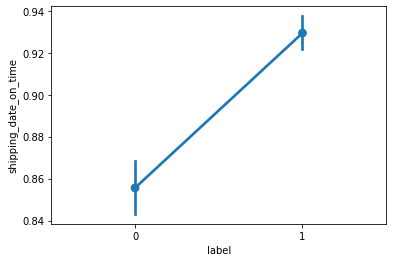

Nilai t-test : 10.030903028308273
Nilai pvalue t-test : 1.6225844551881744e-23
Dikarenakan nilai pvalue ttest < 0.05 maka terima H0
Kesimpulan : mean variabel numerik kelompok label 1 = mean variabel numerik kelompok label 0



In [270]:
# Melakukan EDA Multivariat pada setiap pasangan kolom kontinu dengan kolom label dataset 

# Membuat loop
iter=1
for i in list_syn:
  print()
  print('iterasi ke-',iter)
  print('Hubungan Label dengan kolom',i)
  
  sns.boxplot(data=df_syn, x='label', y=i)
  plt.show()
  print()
  sns.pointplot(data=df_syn, x='label', y=i,kind='point')
  plt.show()

  alp = 0.05
  group1 = df[(df_syn['label']==1)][i]
  group0 = df[(df_syn['label']==0)][i]
  ttest_coef,ttest_pval = ttest_ind(group1,group0,nan_policy='omit', alternative='two-sided')
  print('Nilai t-test :',ttest_coef)
  print('Nilai pvalue t-test :',ttest_pval)
  if ttest_pval < 0.05 :
    print('Dikarenakan nilai pvalue ttest < 0.05 maka terima H0')
    print('Kesimpulan : mean variabel numerik kelompok label 1 = mean variabel numerik kelompok label 0')
  else : 
    print('Dikarenakan nilai pvalue ttest > 0.05 maka tolak H0')
    print('Kesimpulan : mean variabel numerik kelompok label 1 ≠ mean variabel numerik kelompok label 0')

  iter+=1
  print()

In [271]:
# Insight tambahan

# Pesanan rata-rata (median) diverifikasi sistem cukup cepat, yakni 0.014 hari atau sekitar 20 menit; namun terdapat proses verifikasi terlama yakni 12 hari.
# Respon penjual dalam mengirimkan barang ke kurir pengiriman kapal rata-rata membutuhkan waktu hampir 3 hari, dengan lama waktu pengiriman dari kapal sekitar 9 hari.

## 3. Feature Transformation

In [272]:
# Menyiapkan dan menyatukan fitur yang akan digunakan

df_syn = df_syn.drop(['label'],axis=1)
df_concat_final = pd.concat([df_concat_imp, df_syn], axis = 1)
df_concat_final

,customer_state,payment_type,seller_state,product_category_name_english,customer_zip_code_prefix,order_item_id,price,freight_value,payment_sequential,payment_installments,payment_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_zip_code_prefix,label,system_approve_time,seller_response_time,delivery_time,delivery_on_time,shipping_date_on_time
0,MG,credit_card,BA,computers,36570,1,1437.00,42.51,1,8,1479.51,55.0,3611.0,4.0,2750,16,31,39,42738,0,0.048738,4.275509,5.840046,1,1
1,DF,credit_card,PR,health_beauty,72225,1,349.90,22.85,1,7,372.75,51.0,625.0,1.0,900,25,12,38,80310,0,0.012106,0.388796,14.862674,1,1
2,SP,credit_card,PR,computers_accessories,13160,1,69.90,12.62,1,3,82.52,51.0,518.0,1.0,214,18,14,13,87047,0,0.015602,3.785648,16.023785,1,1
3,SP,credit_card,SP,furniture_decor,15600,1,250.00,35.02,1,6,285.02,51.0,756.0,1.0,12250,45,35,45,3204,0,0.996528,1.440069,3.179525,1,1
4,ES,credit_card,PR,computers_accessories,29360,1,75.90,25.81,1,3,101.71,45.0,267.0,1.0,167,16,12,13,87083,1,0.009838,1.530984,14.256794,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6809,SP,credit_card,SP,baby,13806,1,17.80,8.64,1,1,52.88,30.0,245.0,3.0,350,60,2,20,13465,1,0.010069,1.134248,2.359676,1,1
6810,RJ,credit_card,SP,office_furniture,22775,1,194.99,59.91,1,1,2039.20,55.0,1180.0,1.0,16167,64,62,25,8577,0,2.959745,13.910544,2.254375,1,1
6811,MG,credit_card,SP,telephony,30140,2,19.90,25.00,1,10,102.67,30.0,305.0,1.0,100,19,3,11,8250,0,0.013449,3.997338,7.333322,1,1
6812,SP,voucher,MG,luggage_accessories,8615,1,102.90,17.97,2,1,100.00,45.0,702.0,1.0,1400,33,10,49,37564,1,0.012998,0.030729,12.236019,1,1


In [273]:
# Melihat perbandingan rasio label pada negara pembeli dan penjual
# Membuat dataset kedua label secara terpisah

df_no = df_concat_final[(df_concat_imp['label']==0)]
df_yes = df_concat_final[(df_concat_imp['label']==1)]

In [274]:
# Melihat perbandingan rasio label pada negara asal pembeli

st_cons_n = df_no.groupby('customer_state').agg({'label':'count'})
st_cons_y = df_yes.groupby('customer_state').agg({'label':'count'})

df_st_cons_n = pd.DataFrame(data=st_cons_n).rename(columns={'label':'label_0'}).sort_values(by='label_0',ascending=False).reset_index()
df_st_cons_y = pd.DataFrame(data=st_cons_y).rename(columns={'label':'label_1'}).sort_values(by='label_1',ascending=False).reset_index()

state_consumer = df_st_cons_y.merge(df_st_cons_n,left_on = 'customer_state', right_on = 'customer_state',how = 'right')
state_consumer['Ratio'] = state_consumer.apply(lambda x : x['label_1']/(x['label_0']+x['label_1']),axis=1)
state_consumer = state_consumer.sort_values(by='Ratio',ascending=True).reset_index(drop=True)
list_rank_cust = []
i=1
while i < (state_consumer.shape[0])+1:
  rank = i
  list_rank_cust.append(rank)
  i+=1
state_consumer['Rank'] = list_rank_cust
state_consumer

,customer_state,label_1,label_0,Ratio,Rank
0,AC,1.0,2,0.333333,1
1,AM,1.0,2,0.333333,2
2,GO,25.0,29,0.462963,3
3,MA,13.0,15,0.464286,4
4,BA,94.0,107,0.467662,5
5,DF,26.0,29,0.472727,6
6,RN,9.0,9,0.500000,7
7,MT,26.0,23,0.530612,8
8,SE,7.0,6,0.538462,9
9,TO,6.0,5,0.545455,10


In [275]:
# Melihat perbandingan rasio label pada negara asal penjual

st_sell_n = df_no.groupby('seller_state').agg({'label':'count'})
st_sell_y = df_yes.groupby('seller_state').agg({'label':'count'})

df_st_sell_n = pd.DataFrame(data=st_sell_n).rename(columns={'label':'label_0'}).sort_values(by='label_0',ascending=False).reset_index()
df_st_sell_y = pd.DataFrame(data=st_sell_y).rename(columns={'label':'label_1'}).sort_values(by='label_1',ascending=False).reset_index()

state_seller = df_st_sell_y.merge(df_st_sell_n,left_on = 'seller_state', right_on = 'seller_state',how = 'left')
state_seller['Ratio'] = state_seller.apply(lambda x : x['label_1']/(x['label_0']+x['label_1']),axis=1)
state_seller = state_seller.sort_values(by='Ratio',ascending=True).reset_index(drop=True)
list_rank_sell = []
i=1
while i < (state_seller.shape[0])+1:
  rank = i
  list_rank_sell.append(rank)
  i+=1
state_seller['Rank'] = list_rank_sell
state_seller

,seller_state,label_1,label_0,Ratio,Rank
0,PE,11,13.0,0.458333,1
1,PB,2,2.0,0.500000,2
2,MG,327,241.0,0.575704,3
3,SP,2778,2009.0,0.580322,4
4,PR,334,236.0,0.585965,5
5,GO,18,12.0,0.600000,6
6,MT,3,2.0,0.600000,7
7,SC,162,106.0,0.604478,8
8,RS,86,51.0,0.627737,9
9,DF,30,17.0,0.638298,10


In [276]:
# Menyimpan data ranking kedalam dict

df_st_cons =  state_consumer.loc[:,['customer_state','Rank']]
df_st_sell =  state_seller.loc[:,['seller_state','Rank']]
dict_st_cons = dict(df_st_cons.values)
dict_st_sell = dict(df_st_sell.values)

In [277]:
# Mentransformasi negara asal penjual dan pembeli

df_concat_final['customer_state'] = df_concat_final['customer_state'].map(dict_st_cons)
df_concat_final['seller_state'] = df_concat_final['seller_state'].map(dict_st_sell)

In [278]:
# Tampilan Hasil akhir dataset final sebelum dilakukan pemisahan train test split

df_concat_final

,customer_state,payment_type,seller_state,product_category_name_english,customer_zip_code_prefix,order_item_id,price,freight_value,payment_sequential,payment_installments,payment_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_zip_code_prefix,label,system_approve_time,seller_response_time,delivery_time,delivery_on_time,shipping_date_on_time
0,13,credit_card,14,computers,36570,1,1437.00,42.51,1,8,1479.51,55.0,3611.0,4.0,2750,16,31,39,42738,0,0.048738,4.275509,5.840046,1,1
1,6,credit_card,5,health_beauty,72225,1,349.90,22.85,1,7,372.75,51.0,625.0,1.0,900,25,12,38,80310,0,0.012106,0.388796,14.862674,1,1
2,19,credit_card,5,computers_accessories,13160,1,69.90,12.62,1,3,82.52,51.0,518.0,1.0,214,18,14,13,87047,0,0.015602,3.785648,16.023785,1,1
3,19,credit_card,4,furniture_decor,15600,1,250.00,35.02,1,6,285.02,51.0,756.0,1.0,12250,45,35,45,3204,0,0.996528,1.440069,3.179525,1,1
4,23,credit_card,5,computers_accessories,29360,1,75.90,25.81,1,3,101.71,45.0,267.0,1.0,167,16,12,13,87083,1,0.009838,1.530984,14.256794,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6809,19,credit_card,4,baby,13806,1,17.80,8.64,1,1,52.88,30.0,245.0,3.0,350,60,2,20,13465,1,0.010069,1.134248,2.359676,1,1
6810,12,credit_card,4,office_furniture,22775,1,194.99,59.91,1,1,2039.20,55.0,1180.0,1.0,16167,64,62,25,8577,0,2.959745,13.910544,2.254375,1,1
6811,13,credit_card,4,telephony,30140,2,19.90,25.00,1,10,102.67,30.0,305.0,1.0,100,19,3,11,8250,0,0.013449,3.997338,7.333322,1,1
6812,19,voucher,3,luggage_accessories,8615,1,102.90,17.97,2,1,100.00,45.0,702.0,1.0,1400,33,10,49,37564,1,0.012998,0.030729,12.236019,1,1


In [279]:
# Informasi atribut dataset final ebelum dilakukan pemisahan train test split

df_concat_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6814 entries, 0 to 6813
Data columns (total 25 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   customer_state                 6814 non-null   int64  
 1   payment_type                   6814 non-null   object 
 2   seller_state                   6814 non-null   int64  
 3   product_category_name_english  6814 non-null   object 
 4   customer_zip_code_prefix       6814 non-null   int64  
 5   order_item_id                  6814 non-null   int64  
 6   price                          6814 non-null   float64
 7   freight_value                  6814 non-null   float64
 8   payment_sequential             6814 non-null   int64  
 9   payment_installments           6814 non-null   int64  
 10  payment_value                  6814 non-null   float64
 11  product_name_lenght            6814 non-null   float64
 12  product_description_lenght     6814 non-null   f

In [280]:
# Melakukan pemisahan variabel X dan Y

X = df_concat_final.drop(['label'],axis=1)
Y = df_concat_final['label']

In [281]:
# Melihat rasio label 0 dan 1

Y.value_counts(normalize=True)

1    0.58644
0    0.41356
Name: label, dtype: float64

In [282]:
# Melakukan pemisahan train test split

X_train,X_test,y_train,y_test = train_test_split(X,Y,test_size=0.2,stratify=Y,random_state=42)

In [283]:
# Melihat ukuran dataset dari train test

print('X train :',X_train.shape)
print('y train :',y_train.shape)
print('X test :',X_test.shape)
print('y test :',y_test.shape)

X train : (5451, 24)
y train : (5451,)
X test : (1363, 24)
y test : (1363,)


In [284]:
# Data Train

In [285]:
# Memishakan data kategorikal dan kontinu

X_train_num = X_train.select_dtypes('number')
X_train_cat = X_train.select_dtypes('object')

In [286]:
# Melakukan scaling

rs = RobustScaler()
X_train_num_sc = pd.DataFrame(rs.fit_transform(X_train_num),columns =rs.get_feature_names_out(X_train_num.columns))
X_train_num_sc

,customer_state,seller_state,customer_zip_code_prefix,order_item_id,price,freight_value,payment_sequential,payment_installments,payment_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_zip_code_prefix,system_approve_time,seller_response_time,delivery_time,delivery_on_time,shipping_date_on_time
0,0.857143,0.0,-0.396408,0.0,-0.368382,0.177408,0.0,0.333333,-0.399577,0.357143,0.176101,0.5,0.225806,1.190476,-0.083333,-0.533333,2.776585,-0.013974,0.033084,0.126031,0.0,0.0
1,0.571429,0.0,2.201890,0.0,-0.591517,-0.307692,0.0,-0.333333,-0.586253,-0.428571,-0.801887,1.0,-0.290323,-0.190476,-0.250000,-0.133333,-0.442893,2.695338,-0.473044,-0.246569,0.0,0.0
2,0.571429,0.0,2.333190,2.0,0.444901,0.207900,0.0,1.333333,0.864074,-1.214286,-0.229560,0.0,0.168387,-0.047619,0.833333,0.133333,0.165520,0.001733,-0.371241,-0.121265,0.0,0.0
3,0.142857,0.0,2.513863,4.0,-0.452689,0.000000,0.0,-0.333333,1.355780,0.000000,-0.470126,1.0,-0.354839,-0.428571,-0.250000,-0.600000,-0.403647,0.960678,-0.394586,-0.437026,0.0,0.0
4,0.000000,6.0,0.454371,0.0,0.188296,-0.127512,0.0,-0.333333,-0.016476,0.357143,0.270440,0.0,-0.225806,-0.428571,0.666667,-0.333333,2.403398,0.045370,-0.279404,0.239063,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5446,0.000000,0.0,0.544570,0.0,0.262078,0.964657,0.0,-0.333333,0.096059,0.357143,-0.290881,1.5,-0.032258,-0.142857,-0.083333,0.866667,0.094488,0.935503,2.845011,0.422124,0.0,0.0
5447,-0.142857,0.0,-0.044668,0.0,0.851489,1.331947,0.0,2.333333,0.539319,0.571429,0.955975,0.0,1.709677,-0.428571,-0.916667,-0.600000,0.144177,-0.007625,-0.122205,0.026622,0.0,0.0
5448,-0.142857,-1.0,0.012000,1.0,-0.666982,-0.307692,0.0,1.666667,-0.251521,0.000000,0.000000,0.0,-0.290323,-0.238095,-0.583333,0.400000,0.713179,0.049419,-0.099606,0.563876,0.0,0.0
5449,0.857143,0.0,-0.892623,0.0,0.042101,0.838531,1.0,-0.333333,-0.444394,0.500000,-0.602201,0.5,4.677419,1.666667,0.583333,0.600000,-0.032698,0.091177,-0.303964,-0.398971,0.0,0.0


In [287]:
# Melakukan encoder

ohe = OneHotEncoder(handle_unknown='ignore')
X_train_cat_enc = pd.DataFrame(ohe.fit_transform(X_train_cat).toarray(),columns =ohe.get_feature_names_out(X_train_cat.columns))
X_train_cat_enc

,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher,product_category_name_english_agro_industry_and_commerce,product_category_name_english_air_conditioning,product_category_name_english_art,product_category_name_english_arts_and_craftmanship,product_category_name_english_audio,product_category_name_english_auto,product_category_name_english_baby,product_category_name_english_bed_bath_table,product_category_name_english_books_general_interest,product_category_name_english_books_imported,product_category_name_english_books_technical,product_category_name_english_christmas_supplies,product_category_name_english_cine_photo,product_category_name_english_computers,product_category_name_english_computers_accessories,product_category_name_english_consoles_games,product_category_name_english_construction_tools_construction,product_category_name_english_construction_tools_lights,product_category_name_english_construction_tools_safety,product_category_name_english_cool_stuff,product_category_name_english_costruction_tools_garden,product_category_name_english_costruction_tools_tools,product_category_name_english_diapers_and_hygiene,product_category_name_english_drinks,product_category_name_english_dvds_blu_ray,product_category_name_english_electronics,product_category_name_english_fashio_female_clothing,product_category_name_english_fashion_bags_accessories,product_category_name_english_fashion_childrens_clothes,product_category_name_english_fashion_male_clothing,product_category_name_english_fashion_shoes,product_category_name_english_fashion_sport,product_category_name_english_fashion_underwear_beach,product_category_name_english_fixed_telephony,product_category_name_english_flowers,product_category_name_english_food,product_category_name_english_food_drink,product_category_name_english_furniture_bedroom,product_category_name_english_furniture_decor,product_category_name_english_furniture_living_room,product_category_name_english_furniture_mattress_and_upholstery,product_category_name_english_garden_tools,product_category_name_english_health_beauty,product_category_name_english_home_appliances,product_category_name_english_home_appliances_2,product_category_name_english_home_confort,product_category_name_english_home_construction,product_category_name_english_housewares,product_category_name_english_industry_commerce_and_business,product_category_name_english_kitchen_dining_laundry_garden_furniture,product_category_name_english_luggage_accessories,product_category_name_english_market_place,product_category_name_english_music,product_category_name_english_musical_instruments,product_category_name_english_office_furniture,product_category_name_english_party_supplies,product_category_name_english_perfumery,product_category_name_english_pet_shop,product_category_name_english_signaling_and_security,product_category_name_english_small_appliances,product_category_name_english_small_appliances_home_oven_and_coffee,product_category_name_english_sports_leisure,product_category_name_english_stationery,product_category_name_english_tablets_printing_image,product_category_name_english_telephony,product_category_name_english_toys,product_category_name_english_watches_gifts
0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

In [288]:
# Menggabungkan kedua jenis data menjadi satu

X_train_concat = pd.concat([X_train_num_sc, X_train_cat_enc], axis = 1)
X_train_concat

,customer_state,seller_state,customer_zip_code_prefix,order_item_id,price,freight_value,payment_sequential,payment_installments,payment_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_zip_code_prefix,system_approve_time,seller_response_time,delivery_time,delivery_on_time,shipping_date_on_time,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher,product_category_name_english_agro_industry_and_commerce,product_category_name_english_air_conditioning,product_category_name_english_art,product_category_name_english_arts_and_craftmanship,product_category_name_english_audio,product_category_name_english_auto,product_category_name_english_baby,product_category_name_english_bed_bath_table,product_category_name_english_books_general_interest,product_category_name_english_books_imported,product_category_name_english_books_technical,product_category_name_english_christmas_supplies,product_category_name_english_cine_photo,product_category_name_english_computers,product_category_name_english_computers_accessories,product_category_name_english_consoles_games,product_category_name_english_construction_tools_construction,product_category_name_english_construction_tools_lights,product_category_name_english_construction_tools_safety,product_category_name_english_cool_stuff,product_category_name_english_costruction_tools_garden,product_category_name_english_costruction_tools_tools,product_category_name_english_diapers_and_hygiene,product_category_name_english_drinks,product_category_name_english_dvds_blu_ray,product_category_name_english_electronics,product_category_name_english_fashio_female_clothing,product_category_name_english_fashion_bags_accessories,product_category_name_english_fashion_childrens_clothes,product_category_name_english_fashion_male_clothing,product_category_name_english_fashion_shoes,product_category_name_english_fashion_sport,product_category_name_english_fashion_underwear_beach,product_category_name_english_fixed_telephony,product_category_name_english_flowers,product_category_name_english_food,product_category_name_english_food_drink,product_category_name_english_furniture_bedroom,product_category_name_english_furniture_decor,product_category_name_english_furniture_living_room,product_category_name_english_furniture_mattress_and_upholstery,product_category_name_english_garden_tools,product_category_name_english_health_beauty,product_category_name_english_home_appliances,product_category_name_english_home_appliances_2,product_category_name_english_home_confort,product_category_name_english_home_construction,product_category_name_english_housewares,product_category_name_english_industry_commerce_and_business,product_category_name_english_kitchen_dining_laundry_garden_furniture,product_category_name_english_luggage_accessories,product_category_name_english_market_place,product_category_name_english_music,product_category_name_english_musical_instruments,product_category_name_english_office_furniture,product_category_name_english_party_supplies,product_category_name_english_perfumery,product_category_name_english_pet_shop,product_category_name_english_signaling_and_security,product_category_name_english_small_appliances,product_category_name_english_small_appliances_home_oven_and_coffee,product_category_name_english_sports_leisure,product_category_name_english_stationery,product_category_name_english_tablets_printing_image,product_category_name_english_telephony,product_category_name_english_toys,product_category_name_english_watches_gifts
0,0.857143,0.0,-0.396408,0.0,-0.368382,0.177408,0.0,0.333333,-0.399577,0.357143,0.176101,0.5,0.225806,1.190476,-0.083333,-0.533333,2.776585,-0.013974,0.033084,0.126031,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

## 4. Feature Selection

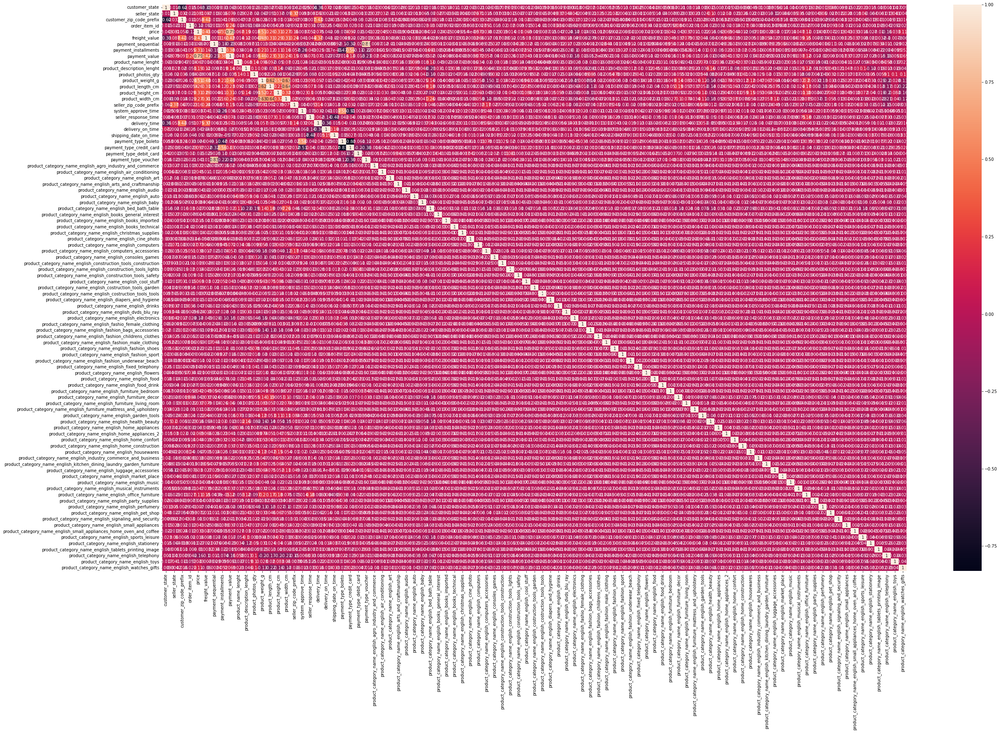

In [289]:
# Melihat korelasi antar variabel

ax, fig = plt.subplots(figsize=[40,25])
corr = X_train_concat.corr(method='spearman')
sns.heatmap(corr,annot=True)

In [290]:
# Menentukan feature apa saja yang akan dipakai

fitur = X_train_concat.columns
alpha = 0.05
list_drop = []
list_keep = []
for i in range(len(fitur)):
  for j in range(i+1,len(fitur)):
    cor, pval = spearmanr(X_train_concat[fitur[i]], X_train_concat[fitur[j]])
    if pval < alpha and (abs(cor)) >= 0.7:
      list_drop.append(fitur[i])
    else:
      list_keep.append(fitur[i])

In [291]:
# Melihat list feature yang didrop

list_drop

['price', 'payment_sequential', 'payment_type_boleto']

In [292]:
# Memisahkan feature yang digunakan dalam model

X_train_no_select = X_train_concat.copy()
X_train_concat.drop(list_drop, axis=1, inplace=True)
X_train_concat

,customer_state,seller_state,customer_zip_code_prefix,order_item_id,freight_value,payment_installments,payment_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_zip_code_prefix,system_approve_time,seller_response_time,delivery_time,delivery_on_time,shipping_date_on_time,payment_type_credit_card,payment_type_debit_card,payment_type_voucher,product_category_name_english_agro_industry_and_commerce,product_category_name_english_air_conditioning,product_category_name_english_art,product_category_name_english_arts_and_craftmanship,product_category_name_english_audio,product_category_name_english_auto,product_category_name_english_baby,product_category_name_english_bed_bath_table,product_category_name_english_books_general_interest,product_category_name_english_books_imported,product_category_name_english_books_technical,product_category_name_english_christmas_supplies,product_category_name_english_cine_photo,product_category_name_english_computers,product_category_name_english_computers_accessories,product_category_name_english_consoles_games,product_category_name_english_construction_tools_construction,product_category_name_english_construction_tools_lights,product_category_name_english_construction_tools_safety,product_category_name_english_cool_stuff,product_category_name_english_costruction_tools_garden,product_category_name_english_costruction_tools_tools,product_category_name_english_diapers_and_hygiene,product_category_name_english_drinks,product_category_name_english_dvds_blu_ray,product_category_name_english_electronics,product_category_name_english_fashio_female_clothing,product_category_name_english_fashion_bags_accessories,product_category_name_english_fashion_childrens_clothes,product_category_name_english_fashion_male_clothing,product_category_name_english_fashion_shoes,product_category_name_english_fashion_sport,product_category_name_english_fashion_underwear_beach,product_category_name_english_fixed_telephony,product_category_name_english_flowers,product_category_name_english_food,product_category_name_english_food_drink,product_category_name_english_furniture_bedroom,product_category_name_english_furniture_decor,product_category_name_english_furniture_living_room,product_category_name_english_furniture_mattress_and_upholstery,product_category_name_english_garden_tools,product_category_name_english_health_beauty,product_category_name_english_home_appliances,product_category_name_english_home_appliances_2,product_category_name_english_home_confort,product_category_name_english_home_construction,product_category_name_english_housewares,product_category_name_english_industry_commerce_and_business,product_category_name_english_kitchen_dining_laundry_garden_furniture,product_category_name_english_luggage_accessories,product_category_name_english_market_place,product_category_name_english_music,product_category_name_english_musical_instruments,product_category_name_english_office_furniture,product_category_name_english_party_supplies,product_category_name_english_perfumery,product_category_name_english_pet_shop,product_category_name_english_signaling_and_security,product_category_name_english_small_appliances,product_category_name_english_small_appliances_home_oven_and_coffee,product_category_name_english_sports_leisure,product_category_name_english_stationery,product_category_name_english_tablets_printing_image,product_category_name_english_telephony,product_category_name_english_toys,product_category_name_english_watches_gifts
0,0.857143,0.0,-0.396408,0.0,0.177408,0.333333,-0.399577,0.357143,0.176101,0.5,0.225806,1.190476,-0.083333,-0.533333,2.776585,-0.013974,0.033084,0.126031,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.

In [293]:
# Menggunakan KBest untuk memilih feature yang digunakan dengan mutual info classifier

np.random.seed(42)
random.seed(42)
kbest =SelectKBest(score_func=mutual_info_classif,k=15)
kbest.fit(X_train_concat,y_train)

SelectKBest(k=15, score_func=<function mutual_info_classif at 0x7f386cc6e050>)

In [294]:
# Melihat feature yang digunakan dengan Kbest dan mutual info classifier

final_fitur = X_train_concat.columns[kbest.get_support()]
final_fitur

Index(['customer_zip_code_prefix', 'freight_value', 'payment_value',
       'product_description_lenght', 'product_weight_g',
       'seller_zip_code_prefix', 'system_approve_time', 'seller_response_time',
       'delivery_time', 'payment_type_debit_card',
       'product_category_name_english_diapers_and_hygiene',
       'product_category_name_english_kitchen_dining_laundry_garden_furniture',
       'product_category_name_english_musical_instruments',
       'product_category_name_english_sports_leisure',
       'product_category_name_english_watches_gifts'],
      dtype='object')

In [295]:
# Membuat dataframe feature yang digunakan dengan Kbest dan mutual info classifier

X_train_final = X_train_concat.loc[:,final_fitur]
X_train_final

,customer_zip_code_prefix,freight_value,payment_value,product_description_lenght,product_weight_g,seller_zip_code_prefix,system_approve_time,seller_response_time,delivery_time,payment_type_debit_card,product_category_name_english_diapers_and_hygiene,product_category_name_english_kitchen_dining_laundry_garden_furniture,product_category_name_english_musical_instruments,product_category_name_english_sports_leisure,product_category_name_english_watches_gifts
0,-0.396408,0.177408,-0.399577,0.176101,0.225806,2.776585,-0.013974,0.033084,0.126031,0.0,0.0,0.0,0.0,0.0,0.0
1,2.201890,-0.307692,-0.586253,-0.801887,-0.290323,-0.442893,2.695338,-0.473044,-0.246569,0.0,0.0,0.0,0.0,0.0,0.0
2,2.333190,0.207900,0.864074,-0.229560,0.168387,0.165520,0.001733,-0.371241,-0.121265,0.0,0.0,0.0,0.0,0.0,0.0
3,2.513863,0.000000,1.355780,-0.470126,-0.354839,-0.403647,0.960678,-0.394586,-0.437026,0.0,0.0,0.0,0.0,0.0,0.0
4,0.454371,-0.127512,-0.016476,0.270440,-0.225806,2.403398,0.045370,-0.279404,0.239063,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5446,0.544570,0.964657,0.096059,-0.290881,-0.032258,0.094488,0.935503,2.845011,0.422124,0.0,0.0,0.0,0.0,0.0,0.0
5447,-0.044668,1.331947,0.539319,0.955975,1.709677,0.144177,-0.007625,-0.122205,0.026622,0.0,0.0,0.0,0.0,0.0,0.0
5448,0.012000,-0.307692,-0.251521,0.000000,-0.290323,0.713179,0.049419,-0.099606,0.563876,0.0,0.0,0.0,0.0,0.0,0.0
5449,-0.892623,0.838531,-0.444394,-0.602201,4.677419,-0.032698,0.091177,-0.303964,-0.398971,0.0,0.0,0.0,0.0,0.0,0.0


In [296]:
# Data Test

In [297]:
# Memisahkan data kategorikal dan kontinu data test

X_test_num = X_test.select_dtypes('number')
X_test_cat = X_test.select_dtypes('object')

In [298]:
# Melakukan scaling

X_test_num_sc = pd.DataFrame(rs.transform(X_test_num),columns =rs.get_feature_names_out(X_test_num.columns))
X_test_num_sc

,customer_state,seller_state,customer_zip_code_prefix,order_item_id,price,freight_value,payment_sequential,payment_installments,payment_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_zip_code_prefix,system_approve_time,seller_response_time,delivery_time,delivery_on_time,shipping_date_on_time
0,-0.142857,0.0,-0.113848,0.0,0.472582,0.314622,0.0,-0.333333,0.211767,0.785714,0.169811,2.0,0.870968,0.285714,3.000000,0.733333,-0.408827,-0.016418,2.467705,-0.099221,0.0,0.0
1,0.857143,0.0,-0.408408,0.0,-0.211557,-0.615385,0.0,-0.333333,-0.330197,0.285714,1.031447,2.0,-0.258065,-0.142857,-0.416667,-0.066667,-0.028885,-0.006841,0.032747,-0.667906,0.0,0.0
2,0.571429,0.0,2.446606,0.0,-0.569414,-0.169092,0.0,-0.333333,-0.562824,0.357143,-0.342767,1.5,-0.333548,-0.285714,-0.583333,-0.400000,-0.028885,1.730428,-0.605798,0.137292,0.0,0.0
3,0.571429,0.0,2.290521,0.0,-0.052731,-0.139986,0.0,-0.333333,-0.190228,-0.428571,-0.155660,0.5,0.387097,0.238095,0.583333,0.000000,-0.448280,0.135817,2.008963,-0.082904,0.0,-1.0
4,0.857143,0.0,-0.479784,0.0,0.463109,-0.392238,0.0,1.000000,0.166421,-1.357143,-0.103774,1.0,-0.107097,-0.428571,-0.166667,-0.466667,0.001202,0.012971,0.026804,0.040743,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1358,1.142857,0.0,2.179929,0.0,-0.273655,0.177408,0.0,2.000000,0.171787,0.000000,0.762579,0.0,0.096774,-0.428571,-0.250000,-0.266667,0.035682,0.004196,-0.225025,0.713343,0.0,0.0
1359,0.000000,0.0,0.454371,0.0,0.356805,1.003465,1.0,-0.333333,-0.270642,0.071429,3.484277,1.0,0.709677,-0.285714,0.250000,-0.200000,-0.258226,0.006877,-0.535851,-0.543808,0.0,0.0
1360,0.857143,0.0,-0.408408,0.0,-0.636880,-1.171171,0.0,-0.333333,-0.665911,0.500000,1.875786,0.0,-0.403226,0.000000,0.083333,-0.133333,-0.096146,-0.006385,1.472551,-0.336146,0.0,0.0
1361,0.857143,0.0,-0.808973,0.0,-0.158931,0.232848,0.0,-0.333333,-0.559725,-2.142857,-0.404088,0.0,0.032258,0.428571,0.333333,0.133333,0.002901,1.563343,-0.279657,-0.141219,0.0,0.0


In [299]:
# Melakukan encoder

X_test_cat_enc = pd.DataFrame(ohe.transform(X_test_cat).toarray(),columns =ohe.get_feature_names_out(X_test_cat.columns))
X_test_cat_enc

,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher,product_category_name_english_agro_industry_and_commerce,product_category_name_english_air_conditioning,product_category_name_english_art,product_category_name_english_arts_and_craftmanship,product_category_name_english_audio,product_category_name_english_auto,product_category_name_english_baby,product_category_name_english_bed_bath_table,product_category_name_english_books_general_interest,product_category_name_english_books_imported,product_category_name_english_books_technical,product_category_name_english_christmas_supplies,product_category_name_english_cine_photo,product_category_name_english_computers,product_category_name_english_computers_accessories,product_category_name_english_consoles_games,product_category_name_english_construction_tools_construction,product_category_name_english_construction_tools_lights,product_category_name_english_construction_tools_safety,product_category_name_english_cool_stuff,product_category_name_english_costruction_tools_garden,product_category_name_english_costruction_tools_tools,product_category_name_english_diapers_and_hygiene,product_category_name_english_drinks,product_category_name_english_dvds_blu_ray,product_category_name_english_electronics,product_category_name_english_fashio_female_clothing,product_category_name_english_fashion_bags_accessories,product_category_name_english_fashion_childrens_clothes,product_category_name_english_fashion_male_clothing,product_category_name_english_fashion_shoes,product_category_name_english_fashion_sport,product_category_name_english_fashion_underwear_beach,product_category_name_english_fixed_telephony,product_category_name_english_flowers,product_category_name_english_food,product_category_name_english_food_drink,product_category_name_english_furniture_bedroom,product_category_name_english_furniture_decor,product_category_name_english_furniture_living_room,product_category_name_english_furniture_mattress_and_upholstery,product_category_name_english_garden_tools,product_category_name_english_health_beauty,product_category_name_english_home_appliances,product_category_name_english_home_appliances_2,product_category_name_english_home_confort,product_category_name_english_home_construction,product_category_name_english_housewares,product_category_name_english_industry_commerce_and_business,product_category_name_english_kitchen_dining_laundry_garden_furniture,product_category_name_english_luggage_accessories,product_category_name_english_market_place,product_category_name_english_music,product_category_name_english_musical_instruments,product_category_name_english_office_furniture,product_category_name_english_party_supplies,product_category_name_english_perfumery,product_category_name_english_pet_shop,product_category_name_english_signaling_and_security,product_category_name_english_small_appliances,product_category_name_english_small_appliances_home_oven_and_coffee,product_category_name_english_sports_leisure,product_category_name_english_stationery,product_category_name_english_tablets_printing_image,product_category_name_english_telephony,product_category_name_english_toys,product_category_name_english_watches_gifts
0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

In [300]:
# Menggabungkan kedua jenis data menjadi satu

X_test_concat = pd.concat([X_test_num_sc, X_test_cat_enc], axis = 1)
X_test_concat

,customer_state,seller_state,customer_zip_code_prefix,order_item_id,price,freight_value,payment_sequential,payment_installments,payment_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_zip_code_prefix,system_approve_time,seller_response_time,delivery_time,delivery_on_time,shipping_date_on_time,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher,product_category_name_english_agro_industry_and_commerce,product_category_name_english_air_conditioning,product_category_name_english_art,product_category_name_english_arts_and_craftmanship,product_category_name_english_audio,product_category_name_english_auto,product_category_name_english_baby,product_category_name_english_bed_bath_table,product_category_name_english_books_general_interest,product_category_name_english_books_imported,product_category_name_english_books_technical,product_category_name_english_christmas_supplies,product_category_name_english_cine_photo,product_category_name_english_computers,product_category_name_english_computers_accessories,product_category_name_english_consoles_games,product_category_name_english_construction_tools_construction,product_category_name_english_construction_tools_lights,product_category_name_english_construction_tools_safety,product_category_name_english_cool_stuff,product_category_name_english_costruction_tools_garden,product_category_name_english_costruction_tools_tools,product_category_name_english_diapers_and_hygiene,product_category_name_english_drinks,product_category_name_english_dvds_blu_ray,product_category_name_english_electronics,product_category_name_english_fashio_female_clothing,product_category_name_english_fashion_bags_accessories,product_category_name_english_fashion_childrens_clothes,product_category_name_english_fashion_male_clothing,product_category_name_english_fashion_shoes,product_category_name_english_fashion_sport,product_category_name_english_fashion_underwear_beach,product_category_name_english_fixed_telephony,product_category_name_english_flowers,product_category_name_english_food,product_category_name_english_food_drink,product_category_name_english_furniture_bedroom,product_category_name_english_furniture_decor,product_category_name_english_furniture_living_room,product_category_name_english_furniture_mattress_and_upholstery,product_category_name_english_garden_tools,product_category_name_english_health_beauty,product_category_name_english_home_appliances,product_category_name_english_home_appliances_2,product_category_name_english_home_confort,product_category_name_english_home_construction,product_category_name_english_housewares,product_category_name_english_industry_commerce_and_business,product_category_name_english_kitchen_dining_laundry_garden_furniture,product_category_name_english_luggage_accessories,product_category_name_english_market_place,product_category_name_english_music,product_category_name_english_musical_instruments,product_category_name_english_office_furniture,product_category_name_english_party_supplies,product_category_name_english_perfumery,product_category_name_english_pet_shop,product_category_name_english_signaling_and_security,product_category_name_english_small_appliances,product_category_name_english_small_appliances_home_oven_and_coffee,product_category_name_english_sports_leisure,product_category_name_english_stationery,product_category_name_english_tablets_printing_image,product_category_name_english_telephony,product_category_name_english_toys,product_category_name_english_watches_gifts
0,-0.142857,0.0,-0.113848,0.0,0.472582,0.314622,0.0,-0.333333,0.211767,0.785714,0.169811,2.0,0.870968,0.285714,3.000000,0.733333,-0.408827,-0.016418,2.467705,-0.099221,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0

In [301]:
# Membuat dataframe feature yang digunakan dengan Kbest dan mutual info classifier pada data test

X_test_final = X_test_concat.loc[:,final_fitur]
X_test_final

,customer_zip_code_prefix,freight_value,payment_value,product_description_lenght,product_weight_g,seller_zip_code_prefix,system_approve_time,seller_response_time,delivery_time,payment_type_debit_card,product_category_name_english_diapers_and_hygiene,product_category_name_english_kitchen_dining_laundry_garden_furniture,product_category_name_english_musical_instruments,product_category_name_english_sports_leisure,product_category_name_english_watches_gifts
0,-0.113848,0.314622,0.211767,0.169811,0.870968,-0.408827,-0.016418,2.467705,-0.099221,1.0,0.0,0.0,0.0,0.0,0.0
1,-0.408408,-0.615385,-0.330197,1.031447,-0.258065,-0.028885,-0.006841,0.032747,-0.667906,0.0,0.0,0.0,0.0,0.0,0.0
2,2.446606,-0.169092,-0.562824,-0.342767,-0.333548,-0.028885,1.730428,-0.605798,0.137292,0.0,0.0,0.0,0.0,1.0,0.0
3,2.290521,-0.139986,-0.190228,-0.155660,0.387097,-0.448280,0.135817,2.008963,-0.082904,0.0,0.0,0.0,0.0,0.0,0.0
4,-0.479784,-0.392238,0.166421,-0.103774,-0.107097,0.001202,0.012971,0.026804,0.040743,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1358,2.179929,0.177408,0.171787,0.762579,0.096774,0.035682,0.004196,-0.225025,0.713343,0.0,0.0,0.0,0.0,0.0,0.0
1359,0.454371,1.003465,-0.270642,3.484277,0.709677,-0.258226,0.006877,-0.535851,-0.543808,0.0,0.0,0.0,0.0,0.0,0.0
1360,-0.408408,-1.171171,-0.665911,1.875786,-0.403226,-0.096146,-0.006385,1.472551,-0.336146,0.0,0.0,0.0,0.0,0.0,0.0
1361,-0.808973,0.232848,-0.559725,-0.404088,0.032258,0.002901,1.563343,-0.279657,-0.141219,0.0,0.0,0.0,0.0,0.0,0.0


In [302]:
# Melihat ukuran data train dan test final

print('X train final :',X_train_final.shape)
print('y train final :',y_train.shape)
print('X test final :',X_test_final.shape)
print('y test final :',y_test.shape)

X train final : (5451, 15)
y train final : (5451,)
X test final : (1363, 15)
y test final : (1363,)


# **Modelling**

In [303]:
# Mendeklarasikan fungsi yang dibutuhkan

def classif(estimator, x, y):
    y_pred = estimator.predict(x)
    print(classification_report(y, y_pred, labels=[1,0]))

def list_metrcis_model(model,y_test, y_pred):
    from sklearn import metrics
    report = metrics.classification_report(y_test, y_pred, output_dict=True)
    df_classification_report = pd.DataFrame(report)
    df_classification = df_classification_report.iloc[0:3,0:3]
    preci = df_classification.iloc[0,1]
    reca = df_classification.iloc[1,1]
    tnr = df_classification.iloc[1,0]
    fpr = 1-tnr
    npv = df_classification.iloc[0,0]
    f1 = df_classification.iloc[2,1]
    acc = df_classification.iloc[0,2]
    output_list = [model,preci,reca,tnr,fpr,npv,f1,acc]
    return output_list

In [304]:
# Mendeklarasikan model-model klasifikasi

log = LogisticRegression(random_state=42)
dt = DecisionTreeClassifier(random_state=42)
rf = RandomForestClassifier(random_state=42)
ada = AdaBoostClassifier(random_state=42)
xg = XGBClassifier(random_state=42)
svc = SVC(random_state=42)

In [305]:
# Melakukan fitting

log.fit(X_train_final, y_train)
y_train_pred_log = log.predict(X_train_final)
y_test_pred_log = log.predict(X_test_final)

dt.fit(X_train_final, y_train)
y_train_pred_dt = dt.predict(X_train_final)
y_test_pred_dt = dt.predict(X_test_final)

rf.fit(X_train_final, y_train)
y_train_pred_rf = rf.predict(X_train_final)
y_test_pred_rf = rf.predict(X_test_final)

ada.fit(X_train_final, y_train)
y_train_pred_ada = ada.predict(X_train_final)
y_test_pred_ada = ada.predict(X_test_final)

xg.fit(X_train_final, y_train)
y_train_pred_xg = xg.predict(X_train_final)
y_test_pred_xg = xg.predict(X_test_final)

svc.fit(X_train_final, y_train)
y_train_pred_SVC = svc.predict(X_train_final)
y_test_pred_SVC = svc.predict(X_test_final)

In [306]:
# Membuat list metrics dan membuat dataframe tiap model

train_metric_log = list_metrcis_model('Log_train',y_train,y_train_pred_log)
test_metric_log = list_metrcis_model('Log_test',y_test,y_test_pred_log)
df_log_train = pd.DataFrame(train_metric_log).T
df_log_test = pd.DataFrame(test_metric_log).T
df_log_train.columns=['model','precision','recall','TNR','FPR','NPV','f1_score','accuracy']
df_log_test.columns=['model','precision','recall','TNR','FPR','NPV','f1_score','accuracy']

train_metric_dt = list_metrcis_model('DT_train',y_train,y_train_pred_dt)
test_metric_dt = list_metrcis_model('DT_test',y_test,y_test_pred_dt)
df_dt_train = pd.DataFrame(train_metric_dt).T
df_dt_test = pd.DataFrame(test_metric_dt).T
df_dt_train.columns=['model','precision','recall','TNR','FPR','NPV','f1_score','accuracy']
df_dt_test.columns=['model','precision','recall','TNR','FPR','NPV','f1_score','accuracy']

train_metric_rf = list_metrcis_model('RF_train',y_train,y_train_pred_rf)
test_metric_rf = list_metrcis_model('RF_test',y_test,y_test_pred_rf)
df_rf_train = pd.DataFrame(train_metric_rf).T
df_rf_test = pd.DataFrame(test_metric_rf).T
df_rf_train.columns=['model','precision','recall','TNR','FPR','NPV','f1_score','accuracy']
df_rf_test.columns=['model','precision','recall','TNR','FPR','NPV','f1_score','accuracy']

train_metric_ada = list_metrcis_model('ada_train',y_train,y_train_pred_ada)
test_metric_ada = list_metrcis_model('ada_test',y_test,y_test_pred_ada)
df_ada_train = pd.DataFrame(train_metric_ada).T
df_ada_test = pd.DataFrame(test_metric_ada).T
df_ada_train.columns=['model','precision','recall','TNR','FPR','NPV','f1_score','accuracy']
df_ada_test.columns=['model','precision','recall','TNR','FPR','NPV','f1_score','accuracy']

train_metric_xg = list_metrcis_model('xg_train',y_train,y_train_pred_xg)
test_metric_xg = list_metrcis_model('xg_test',y_test,y_test_pred_xg)
df_xg_train = pd.DataFrame(train_metric_xg).T
df_xg_test = pd.DataFrame(test_metric_xg).T
df_xg_train.columns=['model','precision','recall','TNR','FPR','NPV','f1_score','accuracy']
df_xg_test.columns=['model','precision','recall','TNR','FPR','NPV','f1_score','accuracy']

train_metric_svc = list_metrcis_model('svc_train',y_train,y_train_pred_SVC)
test_metric_svc = list_metrcis_model('svc_test',y_test,y_test_pred_SVC)
df_svc_train = pd.DataFrame(train_metric_svc).T
df_svc_test = pd.DataFrame(test_metric_svc).T
df_svc_train.columns=['model','precision','recall','TNR','FPR','NPV','f1_score','accuracy']
df_svc_test.columns=['model','precision','recall','TNR','FPR','NPV','f1_score','accuracy']

## 1. Model Selection

In [307]:
# Memilih satu model terbaik untuk dilakukan tuning 
# Menyatukan keseluruhan model dataframe dan melihat hasil prediksi

df_classification_all = pd.concat([df_log_train,df_log_test,
                                   df_dt_train,df_dt_test,
                                   df_rf_train,df_rf_test,
                                   df_ada_train,df_ada_test,
                                   df_xg_train,df_xg_test,
                                   df_svc_train,df_svc_test]).reset_index()
df_classification_all = df_classification_all.drop(['index'],axis=1)
df_classification_all

,model,precision,recall,TNR,FPR,NPV,f1_score,accuracy
0,Log_train,0.636261,0.883641,0.283496,0.716504,0.632047,0.739819,0.63548
1,Log_test,0.626773,0.884856,0.253546,0.746454,0.608511,0.733783,0.623624
2,DT_train,1.0,0.999374,1.0,0.0,0.999113,0.999687,0.999633
3,DT_test,0.659383,0.642053,0.530142,0.469858,0.511111,0.650602,0.595745
4,RF_train,0.999687,0.999687,0.999556,0.000444,0.999556,0.999687,0.999633
5,RF_test,0.67,0.838548,0.414894,0.585106,0.644628,0.744858,0.663243
6,ada_train,0.646952,0.893025,0.308784,0.691216,0.67052,0.750329,0.65144
7,ada_test,0.625772,0.887359,0.248227,0.751773,0.608696,0.733954,0.622891
8,xg_train,0.671982,0.92274,0.361136,0.638864,0.767201,0.777646,0.690516
9,xg_test,0.639257,0.904881,0.276596,0.723404,0.672414,0.749223,0.644901


In [308]:
# Berdasarkan hasil perbandingan kesluruhan model klasifikasi default, akan dipilih satu model untuk dilakukan tunning optimasi
# Kriteria model : Recall, Precision, TNR > 0.7 

# Model default yang dipilih adalah model yang mendekati kriteria tersebut
# Berdasarkan hasil tersebut secara keseluruhan belum ada memenuhi, sehingga akan dilakukan tuning seluruhnya dengan urutan sebagai berikut:
# 1. XGBoost
# 2. AdaBoost
# 3. Decission Tree
# 4. Random Forest
# 5. Log
# 6. SVC

## 2. Model Tunning

In [309]:
# Mendefinisikan skoring untuk tunning (tnr)
# menggunakan make_scorer(recall_score,pos_label=0)

### XGBoost

In [310]:
# Melakukan hyperparameter tunning agar memenuhi kriteria

# Parameter : learning_rate, n_estimators, max_depth, gamma, reg_lambda, min_child_weight

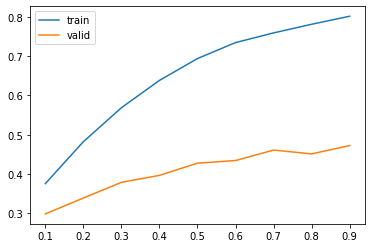

In [311]:
learning_rate = np.arange(0.1,1,0.1)
train = []
valid = []
a = []
for x in learning_rate:
    result = cross_validate(XGBClassifier(learning_rate=x,
                                          random_state=42),
                            X_train_final,
                            y_train,
                            cv=5,
                            scoring = make_scorer(recall_score,pos_label=0),
                            return_train_score= True)
    train.append(result['train_score'].mean())
    valid.append(result['test_score'].mean())
    a.append(x)
    
sns.lineplot(x = a, y=train, label='train')
sns.lineplot(x = a, y=valid, label='valid')
plt.show()

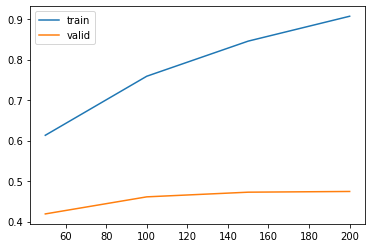

In [312]:
n_estimators = np.arange(50,250,50)
train = []
valid = []
a = []
for x in n_estimators:
    result = cross_validate(XGBClassifier(n_estimators=x,
                                          learning_rate=0.7,
                                          random_state=42),
                            X_train_final,
                            y_train,
                            cv=5,
                            scoring = make_scorer(recall_score,pos_label=0),
                            return_train_score= True)
    train.append(result['train_score'].mean())
    valid.append(result['test_score'].mean())
    a.append(x)
    
sns.lineplot(x = a, y=train, label='train')
sns.lineplot(x = a, y=valid, label='valid')
plt.show()

In [313]:
a[np.argmax(valid)]

200

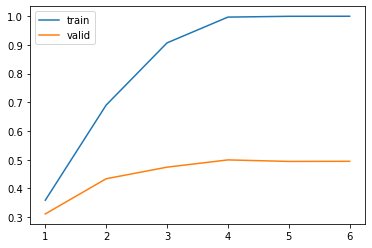

In [314]:
max_depth = np.arange(1,7,1)
train = []
valid = []
a = []
for x in max_depth:
    result = cross_validate(XGBClassifier(n_estimators=200,
                                          learning_rate=0.7,
                                          max_depth=x,
                                          random_state=42),
                            X_train_final,
                            y_train,
                            cv=5,
                            scoring = make_scorer(recall_score,pos_label=0),
                            return_train_score= True)
    train.append(result['train_score'].mean())
    valid.append(result['test_score'].mean())
    a.append(x)
    
sns.lineplot(x = a, y=train, label='train')
sns.lineplot(x = a, y=valid, label='valid')
plt.show()

In [315]:
a[np.argmax(valid)]

4

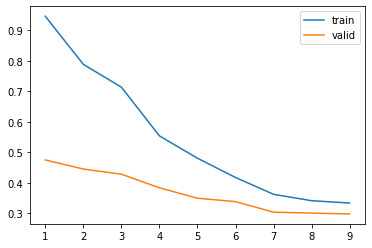

In [316]:
gamma = np.arange(1,10,1)
train = []
valid = []
a = []
for x in gamma:
    result = cross_validate(XGBClassifier(n_estimators=200,
                                          learning_rate=0.7,
                                          max_depth=4,
                                          gamma=x,
                                          random_state=42),
                            X_train_final,
                            y_train,
                            cv=5,
                            scoring = make_scorer(recall_score,pos_label=0),
                            return_train_score= True)
    train.append(result['train_score'].mean())
    valid.append(result['test_score'].mean())
    a.append(x)
    
sns.lineplot(x = a, y=train, label='train')
sns.lineplot(x = a, y=valid, label='valid')
plt.show()

In [317]:
a[np.argmax(valid)]

1

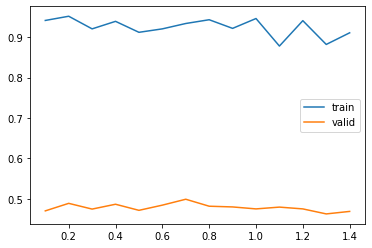

In [318]:
reg_lambda = np.arange(0.1,1.5,0.1)
train = []
valid = []
a = []
for x in reg_lambda:
    result = cross_validate(XGBClassifier(n_estimators=200,
                                          learning_rate=0.7,
                                          max_depth=4,
                                          gamma=1,
                                          reg_lambda=x,
                                          random_state=42),
                            X_train_final,
                            y_train,
                            cv=5,
                            scoring = make_scorer(recall_score,pos_label=0),
                            return_train_score= True)
    train.append(result['train_score'].mean())
    valid.append(result['test_score'].mean())
    a.append(x)
    
sns.lineplot(x = a, y=train, label='train')
sns.lineplot(x = a, y=valid, label='valid')
plt.show()

In [319]:
a[np.argmax(valid)]

0.7000000000000001

In [320]:
# Mendefiniskan dan fitting model xgboost optimum

xg_opt = XGBClassifier(n_estimators=200,
                   learning_rate=0.7,
                   max_depth=4,
                   gamma=1,
                   reg_lambda=0.7,
                   random_state=42)

xg_opt.fit(X_train_final, y_train)

y_train_pred_xg_opt = xg_opt.predict(X_train_final)
y_test_pred_xg_opt = xg_opt.predict(X_test_final)

In [321]:

# Melihat hasil fitting model xg default pada data train

print(classification_report(y_train, y_train_pred_xg_opt, labels=[1,0]))

              precision    recall  f1-score   support

           1       0.97      0.99      0.98      3197
           0       0.98      0.95      0.97      2254

    accuracy                           0.97      5451
   macro avg       0.97      0.97      0.97      5451
weighted avg       0.97      0.97      0.97      5451



In [322]:
# Melihat hasil fitting model xg default pada data test

print(classification_report(y_test, y_test_pred_xg_opt, labels=[1,0]))

              precision    recall  f1-score   support

           1       0.68      0.75      0.71       799
           0       0.58      0.49      0.53       564

    accuracy                           0.64      1363
   macro avg       0.63      0.62      0.62      1363
weighted avg       0.64      0.64      0.64      1363



### AdaBoost 

In [323]:
# Ada boost

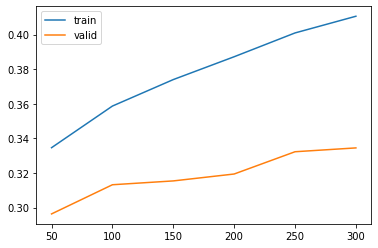

In [324]:
n_estimators = np.arange(50,350,50)
train = []
valid = []
a = []
for x in n_estimators:
    result = cross_validate(AdaBoostClassifier(n_estimators=x,
                                               random_state=42),
                            X_train_final,
                            y_train,
                            cv=5,
                            scoring = make_scorer(recall_score,pos_label=0),
                            return_train_score= True)
    train.append(result['train_score'].mean())
    valid.append(result['test_score'].mean())
    a.append(x)
    
sns.lineplot(x = a, y=train, label='train')
sns.lineplot(x = a, y=valid, label='valid')
plt.show()

In [325]:
a[np.argmax(valid)]

300

In [326]:
# Mendefiniskan dan fitting model xgboost optimum

ada_opt = AdaBoostClassifier(n_estimators=300,
                   random_state=42)

ada_opt.fit(X_train_final, y_train)

y_train_pred_ada_opt = ada_opt.predict(X_train_final)
y_test_pred_ada_opt = ada_opt.predict(X_test_final)

In [327]:
# Melihat hasil fitting model ada default pada data train

print(classification_report(y_train, y_train_pred_ada_opt, labels=[1,0]))

              precision    recall  f1-score   support

           1       0.67      0.88      0.76      3197
           0       0.70      0.40      0.51      2254

    accuracy                           0.68      5451
   macro avg       0.69      0.64      0.64      5451
weighted avg       0.69      0.68      0.66      5451



In [328]:
# Melihat hasil fitting model ada default pada data test

print(classification_report(y_test, y_test_pred_ada_opt, labels=[1,0]))

              precision    recall  f1-score   support

           1       0.63      0.85      0.72       799
           0       0.58      0.30      0.39       564

    accuracy                           0.62      1363
   macro avg       0.61      0.57      0.56      1363
weighted avg       0.61      0.62      0.59      1363



### Decission Tree 

In [329]:
# Decission Tree
# Melakukan hyperparameter tunning agar tidak terjadi overfit

# Parameter : max_features, max_depth, min_sample_split, min_sample_leaf, max_leaf_nodes

<function matplotlib.pyplot.show>

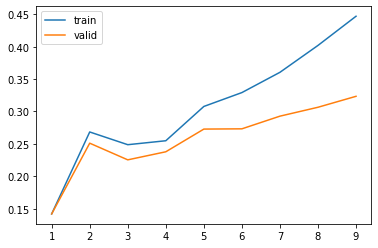

In [330]:
max_depth = np.arange(1,10,1)
train=[]
valid=[]
a=[]
for x in max_depth:
  result = cross_validate(DecisionTreeClassifier(max_depth=x,
                                                 random_state=42),
                        X_train_concat,
                        y_train,
                        cv=5,
                        scoring = make_scorer(recall_score,pos_label=0),
                        return_train_score = True)
  train.append(result['train_score'].mean())
  valid.append(result['test_score'].mean())
  a.append(x)
sns.lineplot(x=a, y=train, label='train')
sns.lineplot(x=a, y=valid, label='valid')
plt.show

<function matplotlib.pyplot.show>

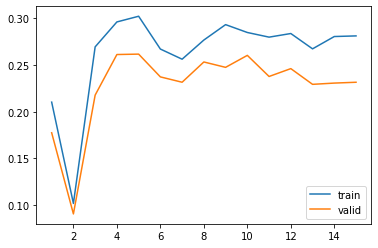

In [331]:
max_features = np.arange(1,16,1)
train=[]
valid=[]
a=[]
for x in max_features:
  result = cross_validate(DecisionTreeClassifier(max_features=x,
                                                 max_depth=5,
                                                 random_state=42),
                        X_train_final,
                        y_train,
                        cv=5,
                        scoring = make_scorer(recall_score,pos_label=0),
                        return_train_score = True)
  train.append(result['train_score'].mean())
  valid.append(result['test_score'].mean())
  a.append(x)
sns.lineplot(x=a, y=train, label='train')
sns.lineplot(x=a, y=valid, label='valid')
plt.show

In [332]:
a[np.argmax(valid)]

5

<function matplotlib.pyplot.show>

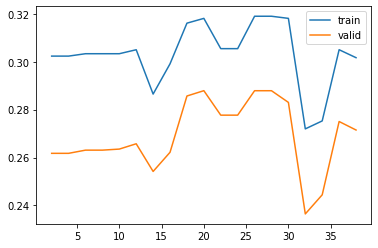

In [333]:
min_samples_split = np.arange(2,40,2)
train=[]
valid=[]
a=[]
for x in min_samples_split:
  result = cross_validate(DecisionTreeClassifier(max_features=5,
                                                 max_depth=5,
                                                 min_samples_split=x,
                                                 random_state=42),
                        X_train_final,
                        y_train,
                        cv=5,
                        scoring = make_scorer(recall_score,pos_label=0),
                        return_train_score = True)
  train.append(result['train_score'].mean())
  valid.append(result['test_score'].mean())
  a.append(x)
sns.lineplot(x=a, y=train, label='train')
sns.lineplot(x=a, y=valid, label='valid')
plt.show

In [334]:
a[np.argmax(valid)]

20

<function matplotlib.pyplot.show>

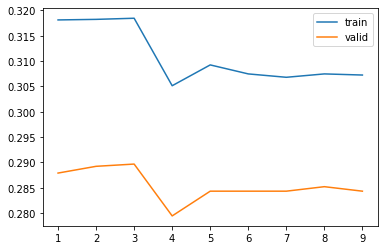

In [335]:
min_samples_leaf = np.arange(1,10,1)
train=[]
valid=[]
a=[]
for x in min_samples_leaf:
  result = cross_validate(DecisionTreeClassifier(max_features=5,
                                                 max_depth=5,
                                                 min_samples_split=20,
                                                 min_samples_leaf=x,
                                                 random_state=42),
                        X_train_final,
                        y_train,
                        cv=5,
                        scoring = make_scorer(recall_score,pos_label=0),
                        return_train_score = True)
  train.append(result['train_score'].mean())
  valid.append(result['test_score'].mean())
  a.append(x)
sns.lineplot(x=a, y=train, label='train')
sns.lineplot(x=a, y=valid, label='valid')
plt.show

In [336]:
a[np.argmax(valid)]

3

<function matplotlib.pyplot.show>

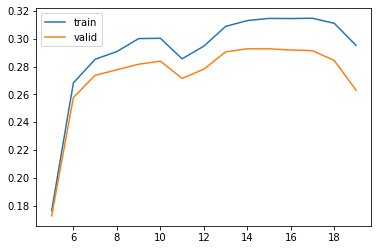

In [337]:
max_leaf_nodes = np.arange(5,20,1)
train=[]
valid=[]
a=[]
for x in max_leaf_nodes:
  result = cross_validate(DecisionTreeClassifier(max_features=5,
                                                 max_depth=5,
                                                 min_samples_split=20,
                                                 min_samples_leaf=3,
                                                 max_leaf_nodes=x,
                                                 random_state=42),
                        X_train_final,
                        y_train,
                        cv=5,
                        scoring = make_scorer(recall_score,pos_label=0),
                        return_train_score = True)
  train.append(result['train_score'].mean())
  valid.append(result['test_score'].mean())
  a.append(x)
sns.lineplot(x=a, y=train, label='train')
sns.lineplot(x=a, y=valid, label='valid')
plt.show

In [338]:
a[np.argmax(valid)]

14

In [339]:
# Berdasarkan hasil tunning didapatkan parameter sebagai berikut:
# max_features=15,max_depth=10,min_samples_split=4,min_samples_leaf=5,max_leaf_nodes=8,random_state=42

# Mendeklarasi model dt optimal dan melakukan fitting

dt_opt = DecisionTreeClassifier(max_features=5,
                                max_depth=5,
                                min_samples_split=20,
                                min_samples_leaf=3,
                                max_leaf_nodes=14,
                                random_state=42)

dt_opt.fit(X_train_final, y_train)
y_train_pred_dt_opt = dt_opt.predict(X_train_final)
y_test_pred_dt_opt = dt_opt.predict(X_test_final)

In [340]:
# Melihat hasil fitting model ada default pada data train

print(classification_report(y_train, y_train_pred_dt_opt, labels=[1,0]))

              precision    recall  f1-score   support

           1       0.65      0.85      0.74      3197
           0       0.62      0.34      0.44      2254

    accuracy                           0.64      5451
   macro avg       0.63      0.60      0.59      5451
weighted avg       0.64      0.64      0.61      5451



In [341]:
# Melihat hasil fitting model ada default pada data test

print(classification_report(y_test, y_test_pred_dt_opt, labels=[1,0]))

              precision    recall  f1-score   support

           1       0.63      0.85      0.72       799
           0       0.58      0.30      0.39       564

    accuracy                           0.62      1363
   macro avg       0.60      0.57      0.56      1363
weighted avg       0.61      0.62      0.59      1363



### Random Forest 

In [342]:
# Random Forest
# Melakukan hyperparameter tunning agar tidak terjadi overfit

# Parameter : max_depths, n_estimators, max_samples, max_features, min_sample_split, min_sample_leaf, max_leaf_nodes

<function matplotlib.pyplot.show>

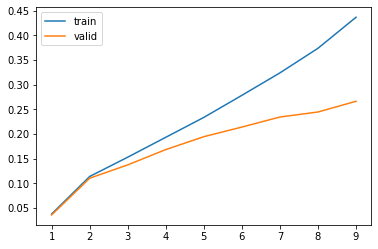

In [343]:
max_depth = np.arange(1,10,1)
train=[]
valid=[]
a=[]
for x in max_depth:
  result = cross_validate(RandomForestClassifier(max_depth=x,
                                                 random_state=42),
                        X_train_final,
                        y_train,
                        cv=5,
                        scoring = make_scorer(recall_score,pos_label=0),
                        return_train_score = True)
  train.append(result['train_score'].mean())
  valid.append(result['test_score'].mean())
  a.append(x)
sns.lineplot(x=a, y=train, label='train')
sns.lineplot(x=a, y=valid, label='valid')
plt.show

<function matplotlib.pyplot.show>

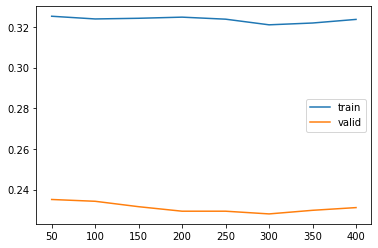

In [344]:
n_estimators = np.arange(50,450,50)
train=[]
valid=[]
a=[]
for x in n_estimators:
  result = cross_validate(RandomForestClassifier(n_estimators=x,
                                                 max_depth=7,
                                                 random_state=42),
                        X_train_final,
                        y_train,
                        cv=5,
                        scoring = make_scorer(recall_score,pos_label=0),
                        return_train_score = True)
  train.append(result['train_score'].mean())
  valid.append(result['test_score'].mean())
  a.append(x)
sns.lineplot(x=a, y=train, label='train')
sns.lineplot(x=a, y=valid, label='valid')
plt.show

In [345]:
a[np.argmax(valid)]

50

<function matplotlib.pyplot.show>

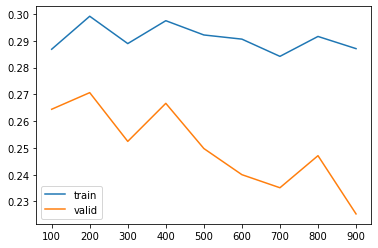

In [346]:
max_samples = np.arange(100,1000,100)
train=[]
valid=[]
a=[]
for x in max_samples:
  result = cross_validate(RandomForestClassifier(n_estimators=50,
                                                 max_samples=x,
                                                 max_depth=7,
                                                 random_state=42),
                        X_train_final,
                        y_train,
                        cv=5,
                        scoring = make_scorer(recall_score,pos_label=0),
                        return_train_score = True)
  train.append(result['train_score'].mean())
  valid.append(result['test_score'].mean())
  a.append(x)
sns.lineplot(x=a, y=train, label='train')
sns.lineplot(x=a, y=valid, label='valid')
plt.show

In [347]:
a[np.argmax(valid)]

200

<function matplotlib.pyplot.show>

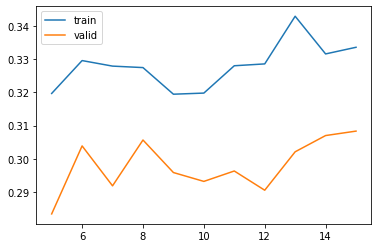

In [348]:
max_features = np.arange(5,16,1)
train=[]
valid=[]
a=[]
for x in max_features:
  result = cross_validate(RandomForestClassifier(n_estimators=50,
                                                 max_samples=200,
                                                 max_depth=7,
                                                 max_features=x,
                                                 random_state=42),
                        X_train_final,
                        y_train,
                        cv=5,
                        scoring = make_scorer(recall_score,pos_label=0),
                        return_train_score = True)
  train.append(result['train_score'].mean())
  valid.append(result['test_score'].mean())
  a.append(x)
sns.lineplot(x=a, y=train, label='train')
sns.lineplot(x=a, y=valid, label='valid')
plt.show

In [349]:
a[np.argmax(valid)]

15

<function matplotlib.pyplot.show>

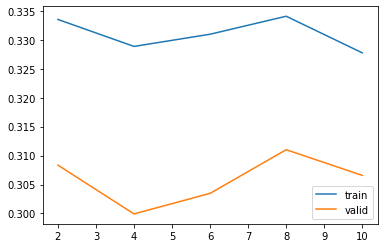

In [350]:
min_sample_split = np.arange(2,12,2)
train=[]
valid=[]
a=[]
for x in min_sample_split:
  result = cross_validate(RandomForestClassifier(n_estimators=50,
                                                 max_samples=200,
                                                 max_features=15,
                                                 max_depth=7,
                                                 min_samples_split=x,
                                                 random_state=42),
                        X_train_final,
                        y_train,
                        cv=5,
                        scoring = make_scorer(recall_score,pos_label=0),
                        return_train_score = True)
  train.append(result['train_score'].mean())
  valid.append(result['test_score'].mean())
  a.append(x)
sns.lineplot(x=a, y=train, label='train')
sns.lineplot(x=a, y=valid, label='valid')
plt.show

In [351]:
a[np.argmax(valid)]

8

<function matplotlib.pyplot.show>

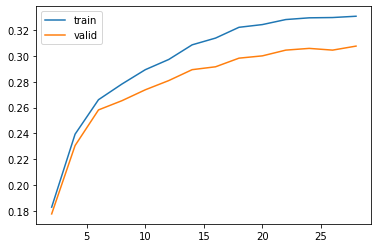

In [352]:
max_leaf_nodes = np.arange(2,30,2)
train=[]
valid=[]
a=[]
for x in max_leaf_nodes:
  result = cross_validate(RandomForestClassifier(n_estimators=50,
                                                 max_samples=200,
                                                 max_features=15,
                                                 max_depth=7,
                                                 min_samples_split=8,
                                                 max_leaf_nodes=x,
                                                 random_state=42),
                        X_train_final,
                        y_train,
                        cv=5,
                        scoring = make_scorer(recall_score,pos_label=0),
                        return_train_score = True)
  train.append(result['train_score'].mean())
  valid.append(result['test_score'].mean())
  a.append(x)
sns.lineplot(x=a, y=train, label='train')
sns.lineplot(x=a, y=valid, label='valid')
plt.show

In [353]:
# Max leaf node tidak dibatasi, dibiarkan default

<function matplotlib.pyplot.show>

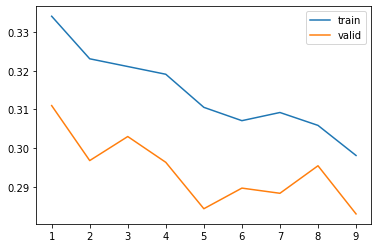

In [354]:
min_sample_leaf = np.arange(1,10,1)
train=[]
valid=[]
a=[]
for x in min_sample_leaf:
  result = cross_validate(RandomForestClassifier(n_estimators=50,
                                                 max_samples=200,
                                                 max_features=15,
                                                 max_depth=7,
                                                 min_samples_split=8,
                                                 min_samples_leaf=x,
                                                 random_state=42),
                        X_train_final,
                        y_train,
                        cv=5,
                        scoring = make_scorer(recall_score,pos_label=0),
                        return_train_score = True)
  train.append(result['train_score'].mean())
  valid.append(result['test_score'].mean())
  a.append(x)
sns.lineplot(x=a, y=train, label='train')
sns.lineplot(x=a, y=valid, label='valid')
plt.show


In [355]:
# Berdasarkan hasil tunning didapatkan parameter sebagai berikut:
# n_estimators=30, max_samples=1000, max_features=20, max_depth=6, min_samples_leaf=8, max_leaf_nodes=3,random_state=42

# Mendeklarasi model dt optimal dan melakukan fitting

rf_opt = RandomForestClassifier(n_estimators=50,
                                max_samples=200,
                                max_features=15,
                                max_depth=7,
                                min_samples_split=8,
                                min_samples_leaf=1,
                                random_state=42)

rf_opt.fit(X_train_final, y_train)
y_train_pred_rf_opt = rf_opt.predict(X_train_final)
y_test_pred_rf_opt = rf_opt.predict(X_test_final)

In [356]:
# Melihat hasil fitting model ada default pada data train

print(classification_report(y_train, y_train_pred_rf_opt, labels=[1,0]))

              precision    recall  f1-score   support

           1       0.65      0.86      0.74      3197
           0       0.63      0.33      0.44      2254

    accuracy                           0.64      5451
   macro avg       0.64      0.60      0.59      5451
weighted avg       0.64      0.64      0.62      5451



In [357]:
# Melihat hasil fitting model ada default pada data test

print(classification_report(y_test, y_test_pred_rf_opt, labels=[1,0]))

              precision    recall  f1-score   support

           1       0.64      0.86      0.73       799
           0       0.61      0.30      0.40       564

    accuracy                           0.63      1363
   macro avg       0.62      0.58      0.57      1363
weighted avg       0.62      0.63      0.59      1363



### Logistic

In [358]:
# Menentukan parameter terbaik untuk logreg dengan gscv
# hyperparam yang dituning : solver dan penalty

logreg_tune = LogisticRegression(random_state=42)
param_grid = {'penalty': ['l1','l2','elasticnet','none'],'solver':['liblinear','saga']}
gscv_log = GridSearchCV(logreg_tune, param_grid=param_grid, cv=5)
gscv_fitlog = gscv_log.fit(X_train_final, y_train)

In [359]:
gscv_fitlog.best_params_

{'penalty': 'none', 'solver': 'saga'}

In [360]:
gscv_fitlog.cv_results_

{'mean_fit_time': array([0.01432199, 0.19770684, 0.02402716, 0.16947756, 0.00131111,
        0.00111642, 0.00112972, 0.16691985]),
 'mean_score_time': array([0.00271649, 0.00266318, 0.00481257, 0.00260105, 0.        ,
        0.        , 0.        , 0.00266733]),
 'mean_test_score': array([0.63144628, 0.63107964, 0.63107931, 0.63181325,        nan,
               nan,        nan, 0.63199657]),
 'param_penalty': masked_array(data=['l1', 'l1', 'l2', 'l2', 'elasticnet', 'elasticnet',
                    'none', 'none'],
              mask=[False, False, False, False, False, False, False, False],
        fill_value='?',
             dtype=object),
 'param_solver': masked_array(data=['liblinear', 'saga', 'liblinear', 'saga', 'liblinear',
                    'saga', 'liblinear', 'saga'],
              mask=[False, False, False, False, False, False, False, False],
        fill_value='?',
             dtype=object),
 'params': [{'penalty': 'l1', 'solver': 'liblinear'},
  {'penalty': 'l1', 'sol

In [361]:
# Mendeklarasikan model dan melakukan prediksi

logreg_opt = LogisticRegression(random_state=42,solver='saga',penalty='none')
logreg_opt.fit(X_train_final, y_train)

y_train_pred_log_opt = logreg_opt.predict(X_train_final)
y_test_pred_log_opt = logreg_opt.predict(X_test_final)

In [362]:
# Melihat hasil fitting model ada default pada data train

print(classification_report(y_train, y_train_pred_log_opt, labels=[1,0]))

              precision    recall  f1-score   support

           1       0.64      0.88      0.74      3197
           0       0.63      0.28      0.39      2254

    accuracy                           0.64      5451
   macro avg       0.63      0.58      0.57      5451
weighted avg       0.63      0.64      0.60      5451



In [363]:
# Melihat hasil fitting model ada default pada data test

print(classification_report(y_test, y_test_pred_log_opt, labels=[1,0]))

              precision    recall  f1-score   support

           1       0.63      0.88      0.73       799
           0       0.61      0.26      0.36       564

    accuracy                           0.62      1363
   macro avg       0.62      0.57      0.55      1363
weighted avg       0.62      0.62      0.58      1363



In [364]:
# Melakukan penentuan nilai threshold dengan ROC AUC curve
# Menentukan y_predict_probability dari setiap data X_train dan X_test 

y_pred_prob_1 = logreg_opt.predict_proba(X_train_final)
y_pred_prob_2 = logreg_opt.predict_proba(X_test_final)

y_pred_prob_train_normal = y_pred_prob_1[:,1]
y_pred_prob_test_normal = y_pred_prob_2[:,1]

In [365]:
# Menentukan nilai fpr, recall, dan treshold 
fpr, recall, thre = roc_curve(y_train, y_pred_prob_train_normal)

# Menentukan nilai precission, recall, dan treshold 
prec, rec, thres = precision_recall_curve(y_train, y_pred_prob_train_normal)

Text(0, 0.5, 'recall')

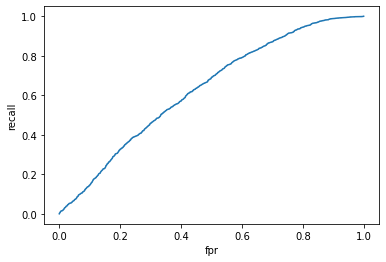

In [366]:
# Menampilkan grafik fpr dan recall 

sns.lineplot(x = fpr, y = recall)
plt.xlabel('fpr')
plt.ylabel('recall')

In [367]:
# Menampilkan nilai ROC AUC dan nilai treshold 

print('Nilai ROC AUC :',roc_auc_score(y_train, y_pred_prob_train_normal))
print('Nilai treshold :',np.argmax(recall*(1-fpr)))

Nilai ROC AUC : 0.6303931508548803
Nilai treshold : 1382


In [368]:
# Menampilkan nilai threshold, recall, dan fpr berdasarkan nilai threshold optimal 

print('Nilai thre :',thre[1382])
print('Nilai recall :',recall[1382])
print('Nilai fpr :',fpr[1382])

Nilai thre : 0.6097968894200366
Nilai recall : 0.6174538629965592
Nilai fpr : 0.42990239574090505


In [369]:
# Melihat hasil fitting model ada default pada data train

print(classification_report(y_train, y_pred_prob_train_normal>thre[1382], labels=[1,0]))

              precision    recall  f1-score   support

           1       0.67      0.62      0.64      3197
           0       0.51      0.57      0.54      2254

    accuracy                           0.60      5451
   macro avg       0.59      0.59      0.59      5451
weighted avg       0.60      0.60      0.60      5451



In [370]:
# Melihat hasil fitting model ada default pada data test

print(classification_report(y_test, y_pred_prob_test_normal>thre[1382], labels=[1,0]))

              precision    recall  f1-score   support

           1       0.65      0.61      0.63       799
           0       0.49      0.54      0.51       564

    accuracy                           0.58      1363
   macro avg       0.57      0.57      0.57      1363
weighted avg       0.59      0.58      0.58      1363



In [371]:
# Melihat nilai precission dan recall dari data

print('precission :',prec[-1],' recall :',rec[-1])

precission : 1.0  recall : 0.0


Text(0, 0.5, 'precision (red) | recall (blue)')

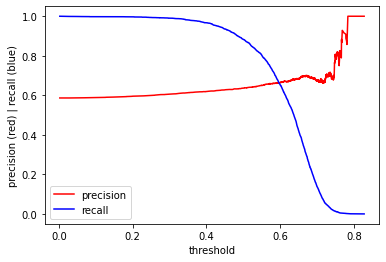

In [372]:
# Melihat plotting precission recall curve

sns.lineplot(thres, prec[:-1], color = 'red', label='precision')
sns.lineplot(thres, rec[:-1], color = 'blue', label='recall')
plt.legend()
plt.xlabel('threshold')
plt.ylabel('precision (red) | recall (blue)')

In [373]:
# Melihat nilai threshold
print('Threshold :',np.argmax(prec*rec))

Threshold : 258


In [374]:
# Melihat hasil fitting model ada default pada data train

print(classification_report(y_train, y_pred_prob_train_normal>thres[258], labels=[1,0]))

              precision    recall  f1-score   support

           1       0.61      0.99      0.75      3197
           0       0.85      0.11      0.19      2254

    accuracy                           0.62      5451
   macro avg       0.73      0.55      0.47      5451
weighted avg       0.71      0.62      0.52      5451



In [375]:
# Melihat hasil fitting model ada default pada data test

print(classification_report(y_test, y_pred_prob_test_normal>thres[258], labels=[1,0]))

              precision    recall  f1-score   support

           1       0.61      0.99      0.75       799
           0       0.87      0.10      0.18       564

    accuracy                           0.62      1363
   macro avg       0.74      0.55      0.47      1363
weighted avg       0.72      0.62      0.52      1363



### SVC

In [377]:
# Menentukan parameter terbaik untuk SVC dengan gscv
# hyperparam yang dituning : kernel, C, gamma, degree dan coef0

svc_tune = SVC(random_state=42)
param_grid = {'kernel': ['rbf','poly','sigmoid']}

gscv_svc = GridSearchCV(svc_tune, param_grid=param_grid, cv=5)
gscv_fitsvc = gscv_svc.fit(X_train_final, y_train)

In [378]:
gscv_svc.best_params_

{'kernel': 'rbf'}

In [379]:
gscv_svc.cv_results_

{'mean_fit_time': array([1.35569062, 2.59198728, 0.76103277]),
 'mean_score_time': array([0.28619609, 0.13871698, 0.15222354]),
 'mean_test_score': array([0.63383059, 0.61511684, 0.54393562]),
 'param_kernel': masked_array(data=['rbf', 'poly', 'sigmoid'],
              mask=[False, False, False],
        fill_value='?',
             dtype=object),
 'params': [{'kernel': 'rbf'}, {'kernel': 'poly'}, {'kernel': 'sigmoid'}],
 'rank_test_score': array([1, 2, 3], dtype=int32),
 'split0_test_score': array([0.62328139, 0.6131989 , 0.55087076]),
 'split1_test_score': array([0.63027523, 0.60642202, 0.54220183]),
 'split2_test_score': array([0.6293578 , 0.61009174, 0.55045872]),
 'split3_test_score': array([0.65137615, 0.6293578 , 0.5412844 ]),
 'split4_test_score': array([0.63486239, 0.61651376, 0.53486239]),
 'std_fit_time': array([0.01858246, 0.32683146, 0.02466193]),
 'std_score_time': array([0.00665539, 0.00151869, 0.00848501]),
 'std_test_score': array([0.00951676, 0.00786494, 0.00604988])}

In [380]:
# Tuning model optimum SVC akan dilakukan pada model bentuk kernel rbf
# paremeter yang di tuning : C dan gamma

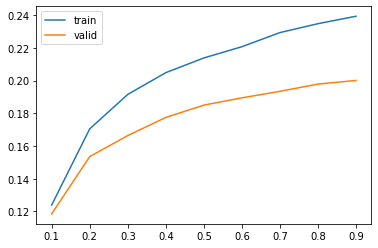

In [381]:
par = np.arange(0.1,1,0.1)
train=[]
valid=[]
a=[]

for x in par:
  result=cross_validate(SVC(C=x, kernel='rbf', random_state=42),
                          X_train_final,
                          y_train,
                          cv=5,
                          scoring = make_scorer(recall_score,pos_label=0),
                          return_train_score=True)
  train.append(result['train_score'].mean())
  valid.append(result['test_score'].mean())
  a.append(x)

sns.lineplot(x=a,y=train,label='train')
sns.lineplot(x=a,y=valid,label='valid')
plt.show()

In [382]:
a[np.argmax(valid)]

0.9

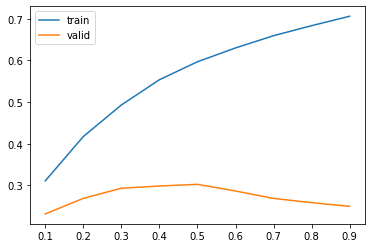

In [383]:
par = np.arange(0.1,1,0.1)
train=[]
valid=[]
a=[]

for x in par:
  result=cross_validate(SVC(C=0.9, gamma=x, kernel='rbf', random_state=42),
                          X_train_final,
                          y_train,
                          cv=5,
                          scoring = make_scorer(recall_score,pos_label=0),
                          return_train_score=True)
  train.append(result['train_score'].mean())
  valid.append(result['test_score'].mean())
  a.append(x)

sns.lineplot(x=a,y=train,label='train')
sns.lineplot(x=a,y=valid,label='valid')
plt.show()

In [384]:
a[np.argmax(valid)]

0.5

In [385]:
# Mendeklarasikan model dan melakukan prediksi

svc_opt = SVC(random_state=42,C=0.9,gamma=0.5)
svc_opt.fit(X_train_final, y_train)

y_train_pred_svc_opt = svc_opt.predict(X_train_final)
y_test_pred_svc_opt = svc_opt.predict(X_test_final)

In [386]:
# Melihat hasil fitting model ada default pada data train

print(classification_report(y_train, y_train_pred_svc_opt, labels=[1,0]))

              precision    recall  f1-score   support

           1       0.77      0.97      0.86      3197
           0       0.93      0.58      0.72      2254

    accuracy                           0.81      5451
   macro avg       0.85      0.78      0.79      5451
weighted avg       0.84      0.81      0.80      5451



In [387]:
# Melihat hasil fitting model ada default pada data test

print(classification_report(y_test, y_test_pred_svc_opt, labels=[1,0]))

              precision    recall  f1-score   support

           1       0.64      0.87      0.74       799
           0       0.63      0.31      0.41       564

    accuracy                           0.64      1363
   macro avg       0.63      0.59      0.58      1363
weighted avg       0.63      0.64      0.60      1363



## 3. Model Performance Report

In [388]:
# Membuat list metrics dan membuat dataframe tiap model optimal

train_metric_log_opt = list_metrcis_model('Log_opt_train', y_train,y_pred_prob_train_normal>thre[1382])
test_metric_log_opt = list_metrcis_model('Log_opt_test', y_test,y_pred_prob_test_normal>thre[1382])
df_log_opt_train = pd.DataFrame(train_metric_log_opt).T
df_log_opt_test = pd.DataFrame(test_metric_log_opt).T
df_log_opt_train.columns=['model','precision','recall','TNR','FPR','NPV','f1_score','accuracy']
df_log_opt_test.columns=['model','precision','recall','TNR','FPR','NPV','f1_score','accuracy']

train_metric_dt_opt = list_metrcis_model('DT_opt_train',y_train,y_train_pred_dt_opt)
test_metric_dt_opt = list_metrcis_model('DT_opt_test',y_test,y_test_pred_dt_opt)
df_dt_opt_train = pd.DataFrame(train_metric_dt_opt).T
df_dt_opt_test = pd.DataFrame(test_metric_dt_opt).T
df_dt_opt_train.columns=['model','precision','recall','TNR','FPR','NPV','f1_score','accuracy']
df_dt_opt_test.columns=['model','precision','recall','TNR','FPR','NPV','f1_score','accuracy']

train_metric_rf_opt = list_metrcis_model('RF_opt_train',y_train,y_train_pred_rf_opt)
test_metric_rf_opt = list_metrcis_model('RF_opt_test',y_test,y_test_pred_rf_opt)
df_rf_opt_train = pd.DataFrame(train_metric_rf_opt).T
df_rf_opt_test = pd.DataFrame(test_metric_rf_opt).T
df_rf_opt_train.columns=['model','precision','recall','TNR','FPR','NPV','f1_score','accuracy']
df_rf_opt_test.columns=['model','precision','recall','TNR','FPR','NPV','f1_score','accuracy']

train_metric_ada_opt = list_metrcis_model('ada_opt_train',y_train,y_train_pred_ada_opt)
test_metric_ada_opt = list_metrcis_model('ada_opt_test',y_test,y_test_pred_ada_opt)
df_ada_opt_train = pd.DataFrame(train_metric_ada_opt).T
df_ada_opt_test = pd.DataFrame(test_metric_ada_opt).T
df_ada_opt_train.columns=['model','precision','recall','TNR','FPR','NPV','f1_score','accuracy']
df_ada_opt_test.columns=['model','precision','recall','TNR','FPR','NPV','f1_score','accuracy']

train_metric_xg_opt = list_metrcis_model('xg_opt_train',y_train,y_train_pred_xg_opt)
test_metric_xg_opt = list_metrcis_model('xg_opt_test',y_test,y_test_pred_xg_opt)
df_xg_opt_train = pd.DataFrame(train_metric_xg_opt).T
df_xg_opt_test = pd.DataFrame(test_metric_xg_opt).T
df_xg_opt_train.columns=['model','precision','recall','TNR','FPR','NPV','f1_score','accuracy']
df_xg_opt_test.columns=['model','precision','recall','TNR','FPR','NPV','f1_score','accuracy']

train_metric_svc_opt = list_metrcis_model('svc_opt_train',y_train,y_train_pred_svc_opt)
test_metric_svc_opt = list_metrcis_model('svc_opt_test',y_test,y_test_pred_svc_opt)
df_svc_opt_train = pd.DataFrame(train_metric_svc_opt).T
df_svc_opt_test = pd.DataFrame(test_metric_svc_opt).T
df_svc_opt_train.columns=['model','precision','recall','TNR','FPR','NPV','f1_score','accuracy']
df_svc_opt_test.columns=['model','precision','recall','TNR','FPR','NPV','f1_score','accuracy']

In [389]:
# Memilih satu model terbaik untuk dilakukan tuning 
# Menyatukan keseluruhan model dataframe dan melihat hasil prediksi

df_classification_all_opt = pd.concat([df_log_opt_train,df_log_opt_test,
                                   df_dt_opt_train,df_dt_opt_test,
                                   df_rf_opt_train,df_rf_opt_test,
                                   df_ada_opt_train,df_ada_opt_test,
                                   df_xg_opt_train,df_xg_opt_test,
                                   df_svc_opt_train,df_svc_opt_test]).reset_index()
df_classification_all_opt = df_classification_all_opt.drop(['index'],axis=1)
df_classification_all_opt

,model,precision,recall,TNR,FPR,NPV,f1_score,accuracy
0,Log_opt_train,0.67052,0.616828,0.570098,0.429902,0.511952,0.642555,0.597505
1,Log_opt_test,0.65107,0.609512,0.537234,0.462766,0.492683,0.629606,0.579604
2,DT_opt_train,0.647157,0.850798,0.342059,0.657941,0.617788,0.735135,0.640433
3,DT_opt_test,0.630354,0.847309,0.296099,0.703901,0.577855,0.722904,0.619222
4,RF_opt_train,0.64797,0.863622,0.334516,0.665484,0.633613,0.740413,0.644836
5,RF_opt_test,0.63511,0.864831,0.296099,0.703901,0.607273,0.732379,0.629494
6,ada_opt_train,0.674731,0.881139,0.397516,0.602484,0.702194,0.764243,0.681159
7,ada_opt_test,0.631628,0.849812,0.297872,0.702128,0.583333,0.724653,0.621423
8,xg_opt_train,0.966013,0.986863,0.950754,0.049246,0.980778,0.976327,0.971932
9,xg_opt_test,0.675281,0.75219,0.487589,0.512411,0.581395,0.711664,0.6427


In [390]:
# membandingkan dengan hasil model optimal vs default
# model default
df_classification_all

,model,precision,recall,TNR,FPR,NPV,f1_score,accuracy
0,Log_train,0.636261,0.883641,0.283496,0.716504,0.632047,0.739819,0.63548
1,Log_test,0.626773,0.884856,0.253546,0.746454,0.608511,0.733783,0.623624
2,DT_train,1.0,0.999374,1.0,0.0,0.999113,0.999687,0.999633
3,DT_test,0.659383,0.642053,0.530142,0.469858,0.511111,0.650602,0.595745
4,RF_train,0.999687,0.999687,0.999556,0.000444,0.999556,0.999687,0.999633
5,RF_test,0.67,0.838548,0.414894,0.585106,0.644628,0.744858,0.663243
6,ada_train,0.646952,0.893025,0.308784,0.691216,0.67052,0.750329,0.65144
7,ada_test,0.625772,0.887359,0.248227,0.751773,0.608696,0.733954,0.622891
8,xg_train,0.671982,0.92274,0.361136,0.638864,0.767201,0.777646,0.690516
9,xg_test,0.639257,0.904881,0.276596,0.723404,0.672414,0.749223,0.644901


In [391]:
# Hasil metrics model optimum masih belum ada yang memenuhi seluruh kriteria model (recall,precission,TNR > 0.7)
# Jika diurutkan berdasarkan model optimum yang paling mendekati adalah :
# 1. XGBoost opt
# 2. Logistic opt
# 3. SVC opt kernel rbf
# 4. AdaBoost opt
# 5. Random Forest opt
# 6. Decission Tree opt

# **Model Evaluation**

## Backtesting

In [420]:
# Mempersiapkan backtesting

df_test = data2.drop(['customer_id',
                 'customer_unique_id',
                 'order_id',
                 'order_status',
                 'product_id',
                 'seller_id',
                 'geolocation_city',
                 'geolocation_state',
                 'geolocation_zip_code_prefix',
                 'geolocation_lat',
                 'geolocation_lng',
                 'customer_city',
                 'seller_city',
                 'product_category_name'],axis=1)

In [421]:
# Mengubah format tanggal menjadi datetime

df_test['order_purchase_timestamp'] = pd.to_datetime(df_test['order_purchase_timestamp'])
df_test['order_approved_at'] = pd.to_datetime(df_test['order_approved_at'])
df_test['order_delivered_carrier_date'] = pd.to_datetime(df_test['order_delivered_carrier_date'])
df_test['order_delivered_customer_date'] = pd.to_datetime(df_test['order_delivered_customer_date'])
df_test['order_estimated_delivery_date'] = pd.to_datetime(df_test['order_estimated_delivery_date'])
df_test['shipping_limit_date'] = pd.to_datetime(df_test['shipping_limit_date'])

In [422]:
# Mendeklarasikan 5 fitur baru sebagai berikut :

df_test['system_approve_time'] = (df_test.order_approved_at - df_test.order_purchase_timestamp) / pd.Timedelta(days=1)
df_test['seller_response_time'] = (df_test.order_delivered_carrier_date - df_test.order_approved_at) / pd.Timedelta(days=1)
df_test['delivery_time'] = (df_test.order_delivered_customer_date - df_test.order_delivered_carrier_date) / pd.Timedelta(days=1)
df_test['delivery_on_time'] = df_test.apply(lambda x : 1 if x['order_estimated_delivery_date'] > x['order_delivered_customer_date'] else 0,axis=1)
df_test['shipping_date_on_time'] = df_test.apply(lambda x : 1 if x['shipping_limit_date'] > x['order_delivered_carrier_date'] else 0,axis=1)

In [423]:
# Melihat dataset
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2921 entries, 0 to 2920
Data columns (total 30 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   customer_zip_code_prefix       2921 non-null   int64         
 1   customer_state                 2921 non-null   object        
 2   order_purchase_timestamp       2921 non-null   datetime64[ns]
 3   order_approved_at              2920 non-null   datetime64[ns]
 4   order_delivered_carrier_date   2921 non-null   datetime64[ns]
 5   order_delivered_customer_date  2921 non-null   datetime64[ns]
 6   order_estimated_delivery_date  2921 non-null   datetime64[ns]
 7   order_item_id                  2921 non-null   int64         
 8   shipping_limit_date            2921 non-null   datetime64[ns]
 9   price                          2921 non-null   float64       
 10  freight_value                  2921 non-null   float64       
 11  payment_sequentia

In [424]:
df_test.isna().sum()

customer_zip_code_prefix          0
customer_state                    0
order_purchase_timestamp          0
order_approved_at                 1
order_delivered_carrier_date      0
order_delivered_customer_date     0
order_estimated_delivery_date     0
order_item_id                     0
shipping_limit_date               0
price                             0
freight_value                     0
payment_sequential                0
payment_type                      0
payment_installments              0
payment_value                     0
product_name_lenght              44
product_description_lenght       44
product_photos_qty               44
product_weight_g                  0
product_length_cm                 0
product_height_cm                 0
product_width_cm                  0
seller_zip_code_prefix            0
seller_state                      0
product_category_name_english    44
system_approve_time               1
seller_response_time              1
delivery_time               

In [425]:
# Mentransformasi negara asal penjual dan pembeli menjadi kategorikal angka

df_test['customer_state'] = df_test['customer_state'].map(dict_st_cons)
df_test['seller_state'] = df_test['seller_state'].map(dict_st_sell)

In [426]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2921 entries, 0 to 2920
Data columns (total 30 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   customer_zip_code_prefix       2921 non-null   int64         
 1   customer_state                 2921 non-null   int64         
 2   order_purchase_timestamp       2921 non-null   datetime64[ns]
 3   order_approved_at              2920 non-null   datetime64[ns]
 4   order_delivered_carrier_date   2921 non-null   datetime64[ns]
 5   order_delivered_customer_date  2921 non-null   datetime64[ns]
 6   order_estimated_delivery_date  2921 non-null   datetime64[ns]
 7   order_item_id                  2921 non-null   int64         
 8   shipping_limit_date            2921 non-null   datetime64[ns]
 9   price                          2921 non-null   float64       
 10  freight_value                  2921 non-null   float64       
 11  payment_sequentia

In [427]:
df_test.isna().sum()

customer_zip_code_prefix          0
customer_state                    0
order_purchase_timestamp          0
order_approved_at                 1
order_delivered_carrier_date      0
order_delivered_customer_date     0
order_estimated_delivery_date     0
order_item_id                     0
shipping_limit_date               0
price                             0
freight_value                     0
payment_sequential                0
payment_type                      0
payment_installments              0
payment_value                     0
product_name_lenght              44
product_description_lenght       44
product_photos_qty               44
product_weight_g                  0
product_length_cm                 0
product_height_cm                 0
product_width_cm                  0
seller_zip_code_prefix            0
seller_state                      2
product_category_name_english    44
system_approve_time               1
seller_response_time              1
delivery_time               

In [428]:
# Mengisi missing value/imputasi

# impute mode : product_category_name_english
# impute median : product_name_lenght, product_description_lenght, product_photos_qty

# Menggunakan imputer mode
df_modus = df_test[['product_category_name_english']]
Mod_imp_fit = pd.DataFrame(Mod_imp.transform(df_modus), columns = Mod_imp.feature_names_in_)
df_test[['product_category_name_english']] = Mod_imp_fit
df_test['seller_state']= df_test['seller_state'].fillna(1)

# Menggunakan imputer median
df_mean = df_test[['product_name_lenght', 'product_description_lenght','product_photos_qty']]
Mean_imp_fit = pd.DataFrame(Mean_imp.transform(df_mean), columns = Mean_imp.feature_names_in_)
df_test[['product_name_lenght', 'product_description_lenght','product_photos_qty']] = Mean_imp_fit

# Melakukan impute pada missing value : system_approve_time , seller_response_time
df_mean1 = df_test[['system_approve_time', 'seller_response_time']]
Mean_imp_fit_new = pd.DataFrame(Mean_imp1.transform(df_mean1), columns = Mean_imp1.feature_names_in_)
df_test[['system_approve_time', 'seller_response_time']] = Mean_imp_fit_new

In [429]:
df_test.isna().sum()

customer_zip_code_prefix         0
customer_state                   0
order_purchase_timestamp         0
order_approved_at                1
order_delivered_carrier_date     0
order_delivered_customer_date    0
order_estimated_delivery_date    0
order_item_id                    0
shipping_limit_date              0
price                            0
freight_value                    0
payment_sequential               0
payment_type                     0
payment_installments             0
payment_value                    0
product_name_lenght              0
product_description_lenght       0
product_photos_qty               0
product_weight_g                 0
product_length_cm                0
product_height_cm                0
product_width_cm                 0
seller_zip_code_prefix           0
seller_state                     0
product_category_name_english    0
system_approve_time              0
seller_response_time             0
delivery_time                    0
delivery_on_time    

In [433]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2921 entries, 0 to 2920
Data columns (total 30 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   customer_zip_code_prefix       2921 non-null   int64         
 1   customer_state                 2921 non-null   int64         
 2   order_purchase_timestamp       2921 non-null   datetime64[ns]
 3   order_approved_at              2920 non-null   datetime64[ns]
 4   order_delivered_carrier_date   2921 non-null   datetime64[ns]
 5   order_delivered_customer_date  2921 non-null   datetime64[ns]
 6   order_estimated_delivery_date  2921 non-null   datetime64[ns]
 7   order_item_id                  2921 non-null   int64         
 8   shipping_limit_date            2921 non-null   datetime64[ns]
 9   price                          2921 non-null   float64       
 10  freight_value                  2921 non-null   float64       
 11  payment_sequentia

In [434]:
# Memisahkan data kontinu dan kategorikal

df_test_num = df_test.select_dtypes('number')
df_test_cat = df_test.select_dtypes('object')

In [471]:
df_test_num.columns

Index(['customer_zip_code_prefix', 'customer_state', 'order_item_id', 'price',
       'freight_value', 'payment_sequential', 'payment_installments',
       'payment_value', 'product_name_lenght', 'product_description_lenght',
       'product_photos_qty', 'product_weight_g', 'product_length_cm',
       'product_height_cm', 'product_width_cm', 'seller_zip_code_prefix',
       'seller_state', 'system_approve_time', 'seller_response_time',
       'delivery_time', 'delivery_on_time', 'shipping_date_on_time'],
      dtype='object')

In [475]:
X_train_num.columns

Index(['customer_state', 'seller_state', 'customer_zip_code_prefix',
       'order_item_id', 'price', 'freight_value', 'payment_sequential',
       'payment_installments', 'payment_value', 'product_name_lenght',
       'product_description_lenght', 'product_photos_qty', 'product_weight_g',
       'product_length_cm', 'product_height_cm', 'product_width_cm',
       'seller_zip_code_prefix', 'system_approve_time', 'seller_response_time',
       'delivery_time', 'delivery_on_time', 'shipping_date_on_time'],
      dtype='object')

In [478]:
df_test_num = df_test_num.reindex(columns=X_train_num.columns)
df_test_num.columns

Index(['customer_state', 'seller_state', 'customer_zip_code_prefix',
       'order_item_id', 'price', 'freight_value', 'payment_sequential',
       'payment_installments', 'payment_value', 'product_name_lenght',
       'product_description_lenght', 'product_photos_qty', 'product_weight_g',
       'product_length_cm', 'product_height_cm', 'product_width_cm',
       'seller_zip_code_prefix', 'system_approve_time', 'seller_response_time',
       'delivery_time', 'delivery_on_time', 'shipping_date_on_time'],
      dtype='object')

In [479]:
df_test_cat.columns

Index(['payment_type', 'product_category_name_english'], dtype='object')

In [480]:
# Melakukan encoder

df_test_cat_enc = pd.DataFrame(ohe.transform(df_test_cat).toarray(),columns =ohe.get_feature_names_out(df_test_cat.columns))
df_test_cat_enc

,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher,product_category_name_english_agro_industry_and_commerce,product_category_name_english_air_conditioning,product_category_name_english_art,product_category_name_english_arts_and_craftmanship,product_category_name_english_audio,product_category_name_english_auto,product_category_name_english_baby,product_category_name_english_bed_bath_table,product_category_name_english_books_general_interest,product_category_name_english_books_imported,product_category_name_english_books_technical,product_category_name_english_christmas_supplies,product_category_name_english_cine_photo,product_category_name_english_computers,product_category_name_english_computers_accessories,product_category_name_english_consoles_games,product_category_name_english_construction_tools_construction,product_category_name_english_construction_tools_lights,product_category_name_english_construction_tools_safety,product_category_name_english_cool_stuff,product_category_name_english_costruction_tools_garden,product_category_name_english_costruction_tools_tools,product_category_name_english_diapers_and_hygiene,product_category_name_english_drinks,product_category_name_english_dvds_blu_ray,product_category_name_english_electronics,product_category_name_english_fashio_female_clothing,product_category_name_english_fashion_bags_accessories,product_category_name_english_fashion_childrens_clothes,product_category_name_english_fashion_male_clothing,product_category_name_english_fashion_shoes,product_category_name_english_fashion_sport,product_category_name_english_fashion_underwear_beach,product_category_name_english_fixed_telephony,product_category_name_english_flowers,product_category_name_english_food,product_category_name_english_food_drink,product_category_name_english_furniture_bedroom,product_category_name_english_furniture_decor,product_category_name_english_furniture_living_room,product_category_name_english_furniture_mattress_and_upholstery,product_category_name_english_garden_tools,product_category_name_english_health_beauty,product_category_name_english_home_appliances,product_category_name_english_home_appliances_2,product_category_name_english_home_confort,product_category_name_english_home_construction,product_category_name_english_housewares,product_category_name_english_industry_commerce_and_business,product_category_name_english_kitchen_dining_laundry_garden_furniture,product_category_name_english_luggage_accessories,product_category_name_english_market_place,product_category_name_english_music,product_category_name_english_musical_instruments,product_category_name_english_office_furniture,product_category_name_english_party_supplies,product_category_name_english_perfumery,product_category_name_english_pet_shop,product_category_name_english_signaling_and_security,product_category_name_english_small_appliances,product_category_name_english_small_appliances_home_oven_and_coffee,product_category_name_english_sports_leisure,product_category_name_english_stationery,product_category_name_english_tablets_printing_image,product_category_name_english_telephony,product_category_name_english_toys,product_category_name_english_watches_gifts
0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

In [481]:
# Melakukan scaling

df_test_num_sc = pd.DataFrame(rs.transform(df_test_num),columns = df_test_num[rs.feature_names_in_].columns)
df_test_num_sc

,customer_state,seller_state,customer_zip_code_prefix,order_item_id,price,freight_value,payment_sequential,payment_installments,payment_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_zip_code_prefix,system_approve_time,seller_response_time,delivery_time,delivery_on_time,shipping_date_on_time
0,0.857143,0.0,-0.157183,0.0,0.957794,-0.148302,0.0,1.333333,0.534936,-2.285714,1.727987,0.0,0.451613,0.238095,-0.083333,-0.266667,-0.427642,0.606022,-0.492421,0.765152,0.0,0.0
1,0.857143,1.0,-0.496647,0.0,-0.631512,-0.169092,0.0,-0.333333,-0.607414,-2.500000,-0.389937,0.0,-0.319355,-0.380952,0.000000,-0.333333,2.790261,-0.009395,-0.272930,-0.301244,0.0,0.0
2,0.000000,0.0,0.243774,0.0,1.209346,-0.031878,0.0,0.333333,0.721914,0.000000,-0.485849,0.5,0.677419,-0.333333,2.666667,0.800000,-0.437257,-0.022657,1.180789,0.033844,0.0,0.0
3,0.857143,1.0,-0.404330,1.0,-0.579939,-0.532225,0.0,-0.333333,-0.345463,0.000000,-0.312893,0.0,-0.387097,-0.238095,0.000000,-0.133333,3.026482,-0.015178,-0.267544,-0.150483,0.0,0.0
4,-0.142857,0.0,-0.050316,0.0,-0.579939,-0.149688,0.0,-0.333333,-0.569323,-0.571429,-0.135220,3.5,-0.322581,-0.238095,1.083333,-0.333333,-0.432988,0.856804,-0.524585,-0.087881,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2916,0.000000,0.0,0.318679,0.0,-0.621093,-0.307692,0.0,0.000000,-0.607490,0.500000,-0.133648,1.5,-0.387097,-0.142857,-0.666667,-0.533333,-0.432988,0.150922,0.396012,2.116442,-1.0,0.0
2917,0.000000,0.0,0.532844,1.0,1.420693,2.863479,0.0,2.666667,2.898009,-0.785714,-0.045597,0.0,10.322581,1.809524,3.750000,0.400000,-0.225363,1.560132,3.949919,0.628255,0.0,0.0
2918,-0.142857,-1.0,0.012000,1.0,-0.666982,-0.307692,0.0,1.666667,-0.251521,0.000000,0.000000,0.0,-0.290323,-0.238095,-0.583333,0.400000,0.713179,0.049419,-0.099606,0.563876,0.0,0.0
2919,0.000000,-1.0,0.490451,2.0,-0.473740,-0.395010,0.0,-0.333333,0.150474,0.285714,0.238994,0.0,-0.419355,-0.428571,-0.916667,-0.600000,0.709449,0.124598,-0.370701,-0.698916,0.0,0.0


In [482]:
# Menggabungkan kedua jenis data backtest menjadi satu dan menyiapkan data untuk backtest

backtest = pd.concat([df_test_num_sc, df_test_cat_enc], axis = 1)
backtest_final = backtest.loc[:,final_fitur]
backtest_final

,customer_zip_code_prefix,freight_value,payment_value,product_description_lenght,product_weight_g,seller_zip_code_prefix,system_approve_time,seller_response_time,delivery_time,payment_type_debit_card,product_category_name_english_diapers_and_hygiene,product_category_name_english_kitchen_dining_laundry_garden_furniture,product_category_name_english_musical_instruments,product_category_name_english_sports_leisure,product_category_name_english_watches_gifts
0,-0.157183,-0.148302,0.534936,1.727987,0.451613,-0.427642,0.606022,-0.492421,0.765152,0.0,0.0,0.0,0.0,0.0,0.0
1,-0.496647,-0.169092,-0.607414,-0.389937,-0.319355,2.790261,-0.009395,-0.272930,-0.301244,0.0,0.0,0.0,0.0,0.0,0.0
2,0.243774,-0.031878,0.721914,-0.485849,0.677419,-0.437257,-0.022657,1.180789,0.033844,0.0,0.0,0.0,0.0,0.0,0.0
3,-0.404330,-0.532225,-0.345463,-0.312893,-0.387097,3.026482,-0.015178,-0.267544,-0.150483,0.0,0.0,0.0,0.0,0.0,0.0
4,-0.050316,-0.149688,-0.569323,-0.135220,-0.322581,-0.432988,0.856804,-0.524585,-0.087881,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2916,0.318679,-0.307692,-0.607490,-0.133648,-0.387097,-0.432988,0.150922,0.396012,2.116442,0.0,0.0,0.0,0.0,0.0,0.0
2917,0.532844,2.863479,2.898009,-0.045597,10.322581,-0.225363,1.560132,3.949919,0.628255,0.0,0.0,0.0,0.0,0.0,0.0
2918,0.012000,-0.307692,-0.251521,0.000000,-0.290323,0.713179,0.049419,-0.099606,0.563876,0.0,0.0,0.0,0.0,0.0,0.0
2919,0.490451,-0.395010,0.150474,0.238994,-0.419355,0.709449,0.124598,-0.370701,-0.698916,0.0,0.0,0.0,0.0,0.0,0.0


In [488]:
# Prediksi hasil backtest
predicted_data_xg = xg_opt.predict(backtest_final)
predicted_data_xg

array([1, 1, 1, ..., 1, 1, 1])

In [489]:
# Prediksi hasil backtest
predicted_data_log  = logreg_opt.predict_proba(backtest_final)>thre[1382]
predicted_data_log = predicted_data_log[:,1]
predicted_data_log

array([False,  True, False, ..., False,  True, False])

In [490]:
# konversi array menjadi dataframe

df_predicted_xg = pd.DataFrame(data=predicted_data_xg,columns=['predicted'])
df_predicted_log = pd.DataFrame(data=predicted_data_log,columns=['predicted'])
df_predicted_log = df_predicted_log.apply(lambda x : 1 if x['predicted']==True else 0,axis=1)

In [491]:
df_predicted_xg.value_counts()

predicted
1            1879
0            1042
dtype: int64

In [492]:
df_predicted_log.value_counts()

1    1569
0    1352
dtype: int64

In [493]:
# Export csv data hasil prediksi

from google.colab import files
df_predicted_xg.to_csv('backtest_predicted_xg.csv', index=False) 
df_predicted_log.to_csv('backtest_predicted_log.csv', index=False) 

In [467]:
#predicted
#1            2150
#0             771